In [1]:
import pandas as pd


Load Dataset

In [2]:
df = pd.read_csv("2017-IWT4S-HDR_LP-dataset/trainVal.csv")

In [3]:
df.head(5)

,track_id,image_path,lp,train
0,./crop_m1/I00000.png,./crop_m1/I00000.png,9B52145,0
1,./crop_m1/I00000.png,./crop_h1/I00000.png,9B52145,0
2,./crop_m1/I00001.png,./crop_m1/I00001.png,6B94558,0
3,./crop_m1/I00001.png,./crop_h1/I00001.png,6B94558,0
4,./crop_m1/I00002.png,./crop_m1/I00002.png,8B90164,0


In [4]:
df.shape

(652, 4)

Split Dataset into Training and Testing  into 80:20 

In [5]:
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(df, test_size=0.2)

In [6]:
train_df.shape

(521, 4)

Split Dataset into Training and Validation  into 80:20 

In [7]:
from sklearn.model_selection import train_test_split

train_df_val, validate_df = train_test_split(train_df, test_size=0.2)

In [8]:
train_df_val.shape

(416, 4)

In [9]:
validate_df.shape

(105, 4)

DataSet Preparation with Folder_Structure

1. Get Path From training Data 
2.Load Image From Training Data 
3. Run Segmentation
4.Store the images in respective Directory

In [10]:
from PIL import Image
import os   
import cv2
import numpy as np
import matplotlib.pyplot as plt
import scipy.misc


In [24]:
def find_contours(dimensions, img) :

    # Find all contours in the image
    cntrs, _ = cv2.findContours(img.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Retrieve potential dimensions
    lower_width = dimensions[0]
    upper_width = dimensions[1]
    lower_height = dimensions[2]
    upper_height = dimensions[3]
    
    # Check largest 5 or  15 contours for license plate or character respectively
    cntrs = sorted(cntrs, key=cv2.contourArea, reverse=True)[:15]
    
    ii = cv2.imread('contour.jpg')
    
    x_cntr_list = []
    target_contours = []
    img_res = []
    for cntr in cntrs :
        #detects contour in binary image and returns the coordinates of rectangle enclosing it
        intX, intY, intWidth, intHeight = cv2.boundingRect(cntr)
        
        #checking the dimensions of the contour to filter out the characters by contour's size
        if intWidth > lower_width and intWidth < upper_width and intHeight > lower_height and intHeight < upper_height :
            x_cntr_list.append(intX) #stores the x coordinate of the character's contour, to used later for indexing the contours

            char_copy = np.zeros((44,24))
            #extracting each character using the enclosing rectangle's coordinates.
            char = img[intY:intY+intHeight, intX:intX+intWidth]
            char = cv2.resize(char, (20, 40))
            
            cv2.rectangle(ii, (intX,intY), (intWidth+intX, intY+intHeight), (50,21,200), 2)
            plt.imshow(ii, cmap='gray')

#             Make result formatted for classification: invert colors
            char = cv2.subtract(255, char)

            # Resize the image to 24x44 with black border
            char_copy[2:42, 2:22] = char
            char_copy[0:2, :] = 0
            char_copy[:, 0:2] = 0
            char_copy[42:44, :] = 0
            char_copy[:, 22:24] = 0

            img_res.append(char_copy) #List that stores the character's binary image (unsorted)
            
    #Return characters on ascending order with respect to the x-coordinate (most-left character first)
            
    plt.show()
    #arbitrary function that stores sorted list of character indeces
    indices = sorted(range(len(x_cntr_list)), key=lambda k: x_cntr_list[k])
    img_res_copy = []
    for idx in indices:
        img_res_copy.append(img_res[idx])# stores character images according to their index
    img_res = np.array(img_res_copy)

    return img_res

In [25]:
def segment_characters(image,default_resize=310) :

    # Preprocess cropped license plate image
    img_lp = cv2.resize(image, (default_resize, 90))
    img_gray_lp = cv2.cvtColor(img_lp, cv2.COLOR_BGR2GRAY)
    _, img_binary_lp = cv2.threshold(img_gray_lp, 200, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    img_binary_lp = cv2.erode(img_binary_lp, (3,3))
    img_binary_lp = cv2.dilate(img_binary_lp, (3,3))

    LP_WIDTH = img_binary_lp.shape[0]
    LP_HEIGHT = img_binary_lp.shape[1]

    # Make borders white
    img_binary_lp[0:3,:] = 255
    img_binary_lp[:,0:3] = 255
    img_binary_lp[72:75,:] = 255
    img_binary_lp[:,330:333] = 255

    # Estimations of character contours sizes of cropped license plates
    dimensions = [LP_WIDTH/6,
                       LP_WIDTH/2,
                       LP_HEIGHT/10,
                       2*LP_HEIGHT/3]
    plt.imshow(img_binary_lp, cmap='gray')
    plt.show()
    cv2.imwrite('contour.jpg',img_binary_lp)

    # Get contours within cropped license plate
    char_list = find_contours(dimensions, img_binary_lp)

    return char_list

In [22]:
def store_training(df):
    print("_----------------------------------__Starting______________________________------------------")
    image_path = df["image_path"]
    image_path_str = image_path.split("/")[-1]
    image_path_str = image_path_str.split(".")[0]
    print(image_path_str)
    number = str(df["lp"])
    number_list = list(number)
    print(number_list)
    duplicateFrequencies = {}
    for i in set(number_list):
        duplicateFrequencies[i] = number_list.count(i)
    new_dict = {}
    for key, value in duplicateFrequencies.items():
        if value >1:
            new_lis = []
            for i in range(value):
                new_lis.append(key+"_"+str(i))
            new_dict[key] = new_lis
        
    print(new_dict)
    image_path = image_path.replace("./","2017-IWT4S-HDR_LP-dataset/")
    image = cv2.imread(image_path)
    char_list = segment_characters(image)
    if len(char_list) > 7 or len(char_list) < 7:
        print("i am not saving")
        char_list = segment_characters(image,340)
        if len(char_list) > 7 or len(char_list) < 7:
            print("i am not saving")
        else:
            for index,char in enumerate(char_list):
                print(char.shape)
                new_number = number_list[index]
                class_new_number = "class_"+new_number
                if new_number in new_dict.keys():
                    dict_list = new_dict[new_number]
                    if not dict_list:
                        dict_list_number = "_"
                    else:  
                        dict_list_number = dict_list.pop(0)
            
                else: 
                    dict_list_number = "_"
                saved_path = "/Users/nikeshmangwani/Desktop/idfy_interview/idfy_generated_data/train/"+class_new_number+"/"+image_path_str+"_"+str(dict_list_number)+".png"
                scipy.misc.imsave(saved_path, char)

    else:
        for index,char in enumerate(char_list):
            print(char.shape)
            new_number = number_list[index]
            class_new_number = "class_"+new_number
            if new_number in new_dict.keys():
                dict_list = new_dict[new_number]
                if not dict_list:
                    dict_list_number = "_"
                else:  
                    dict_list_number = dict_list.pop(0)
            
            else: 
                dict_list_number = "_"
            saved_path = "/Users/nikeshmangwani/Desktop/idfy_interview/idfy_generated_data/train/"+class_new_number+"/"+image_path_str+"_"+str(dict_list_number)+".png"
            scipy.misc.imsave(saved_path, char)

    
    

_----------------------------------__Starting______________________________------------------
I00050
['4', 'B', '0', '1', '8', '3', '2']
{}


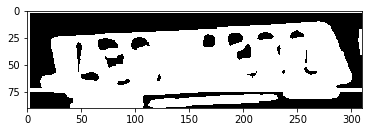

i am not saving


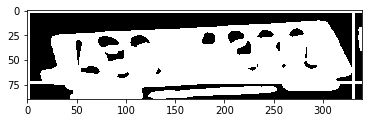

i am not saving
_----------------------------------__Starting______________________________------------------
I00082
['6', 'B', '4', '8', '2', '8', '8']
{'8': ['8_0', '8_1', '8_2']}


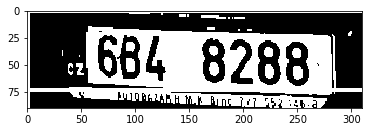

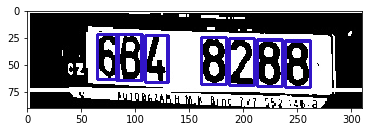

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00038
['2', 'B', '5', '7', '1', '2', '7']
{'2': ['2_0', '2_1'], '7': ['7_0', '7_1']}


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:62: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


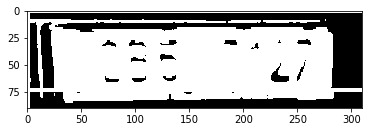

i am not saving


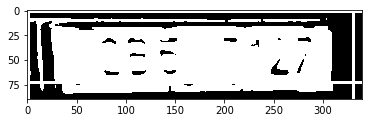

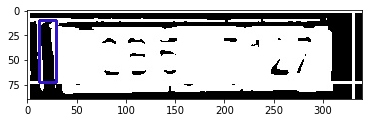

i am not saving
_----------------------------------__Starting______________________________------------------
I00040
['3', 'B', '9', '5', '2', '6', '5']
{'5': ['5_0', '5_1']}


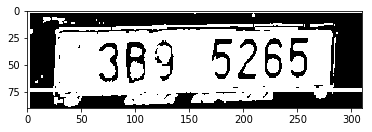

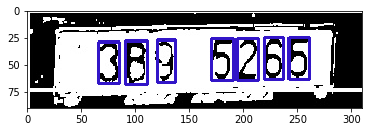

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00016
['4', 'B', '2', '7', '4', '3', '3']
{'3': ['3_0', '3_1'], '4': ['4_0', '4_1']}


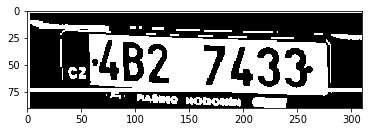

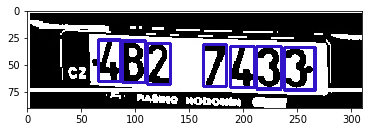

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00019
['3', 'B', '6', '0', '3', '7', '2']
{'3': ['3_0', '3_1']}


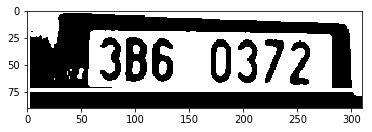

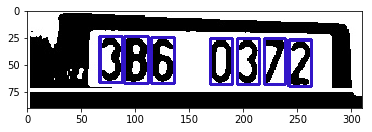

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00005
['6', 'C', '7', '1', '3', '9', '0']
{}


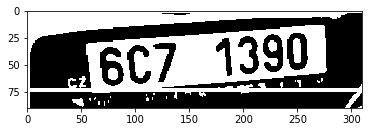

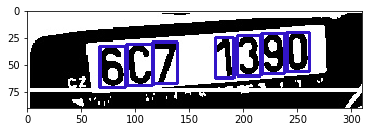

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00103
['B', 'Z', 'L', '5', '6', '8', '5']
{'5': ['5_0', '5_1']}


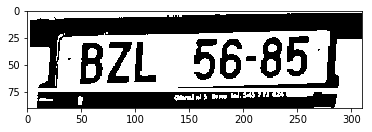

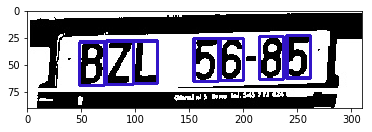

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00123
['B', 'Z', 'B', '1', '9', '2', '2']
{'2': ['2_0', '2_1'], 'B': ['B_0', 'B_1']}


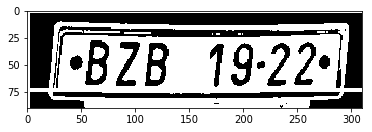

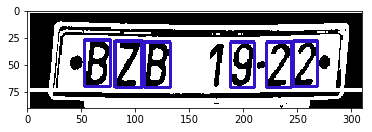

i am not saving


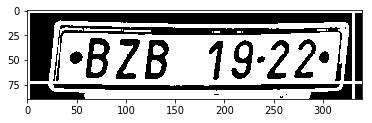

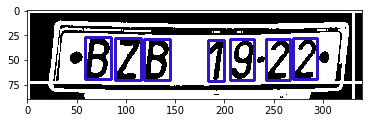

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00067
['8', 'T', '5', '2', '0', '9', '9']
{'9': ['9_0', '9_1']}


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


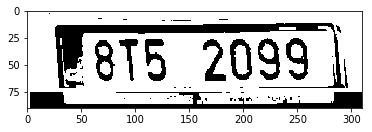

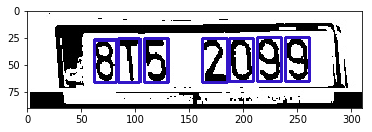

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00122
['B', 'M', 'Z', '3', '9', '3', '3']
{'3': ['3_0', '3_1', '3_2']}


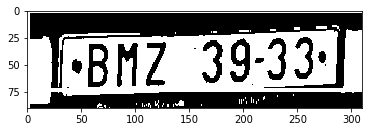

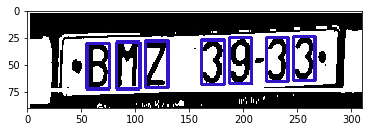

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00090
['1', 'B', 'B', '9', '1', '1', '0']
{'B': ['B_0', 'B_1'], '1': ['1_0', '1_1', '1_2']}


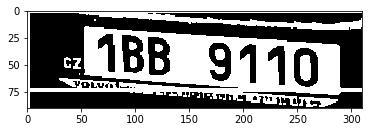

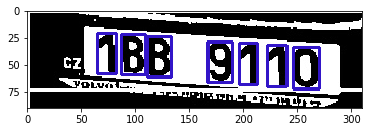

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00031
['5', 'B', '2', '0', '7', '7', '3']
{'7': ['7_0', '7_1']}


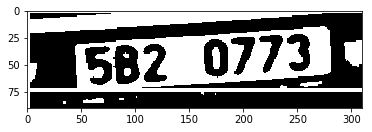

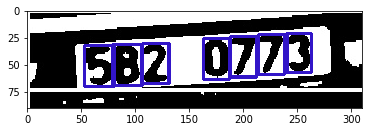

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00085
['7', 'B', '5', '9', '8', '3', '9']
{'9': ['9_0', '9_1']}


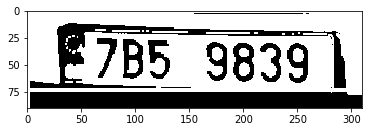

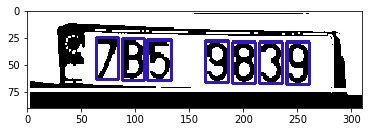

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00003
['7', 'B', '1', '4', '0', '9', '5']
{}


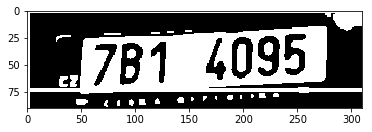

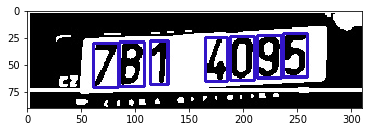

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00028
['5', 'B', '0', '6', '2', '5', '6']
{'6': ['6_0', '6_1'], '5': ['5_0', '5_1']}


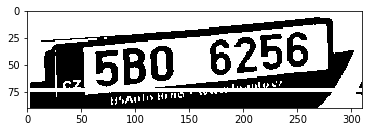

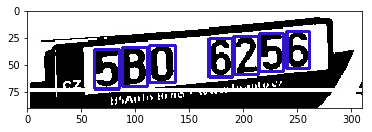

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00056
['5', 'H', '8', '5', '5', '6', '4']
{'5': ['5_0', '5_1', '5_2']}


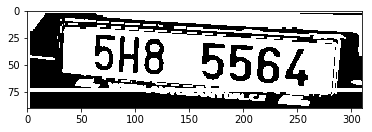

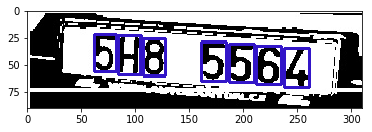

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00010
['8', 'B', '0', '2', '1', '7', '3']
{}


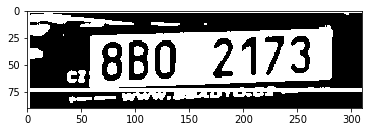

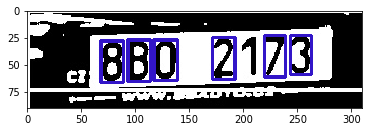

i am not saving


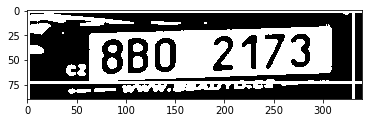

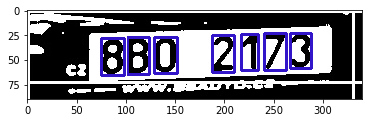

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00040
['3', 'B', '9', '5', '2', '6', '5']
{'5': ['5_0', '5_1']}


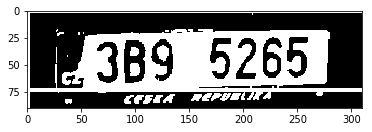

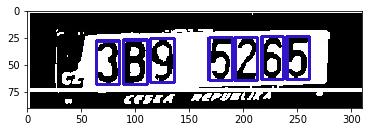

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00114
['1', 'B', 'C', '1', '0', '4', '6']
{'1': ['1_0', '1_1']}


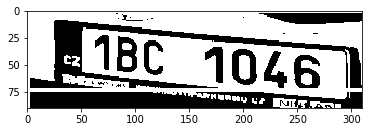

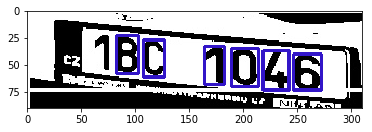

i am not saving


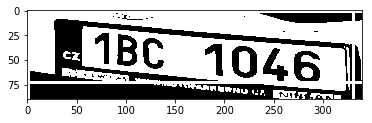

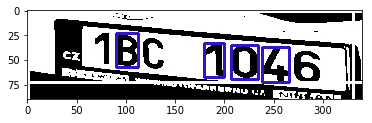

i am not saving
_----------------------------------__Starting______________________________------------------
I00094
['8', 'B', '7', '7', '9', '3', '2']
{'7': ['7_0', '7_1']}


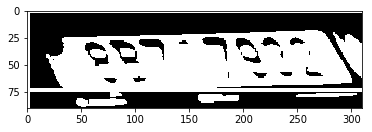

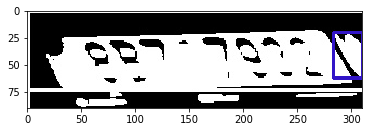

i am not saving


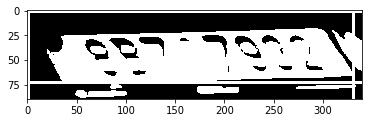

i am not saving
_----------------------------------__Starting______________________________------------------
I00014
['4', 'B', '8', '3', '9', '4', '0']
{'4': ['4_0', '4_1']}


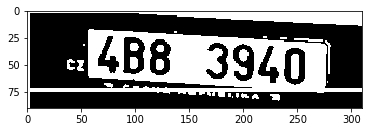

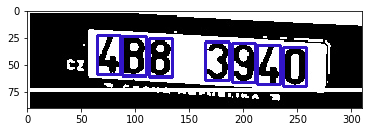

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00107
['4', 'B', '9', '6', '9', '1', '4']
{'9': ['9_0', '9_1'], '4': ['4_0', '4_1']}


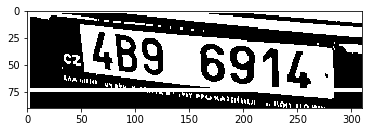

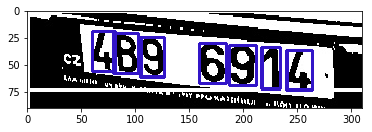

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00030
['3', 'A', 'I', '0', '8', '5', '1']
{}


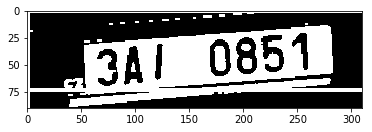

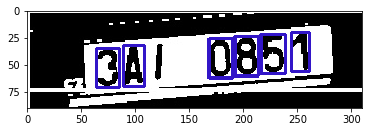

i am not saving


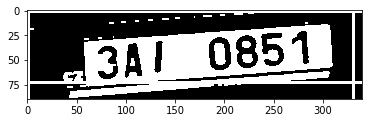

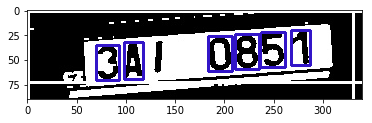

i am not saving
_----------------------------------__Starting______________________________------------------
I00007
['6', 'B', '4', '5', '4', '9', '5']
{'4': ['4_0', '4_1'], '5': ['5_0', '5_1']}


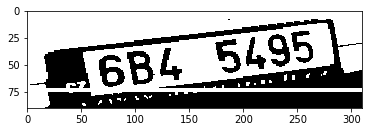

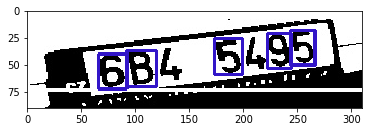

i am not saving


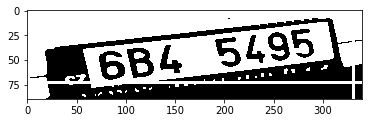

i am not saving
_----------------------------------__Starting______________________________------------------
I00055
['6', 'B', '3', '4', '8', '5', '9']
{}


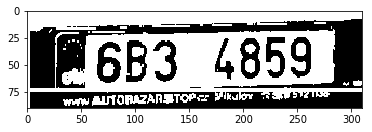

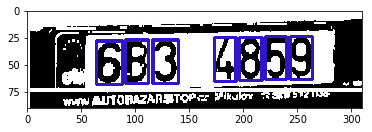

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00044
['5', 'B', '5', '7', '9', '2', '8']
{'5': ['5_0', '5_1']}


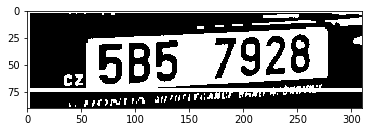

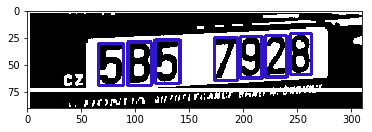

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00111
['7', 'B', '3', '4', '2', '1', '6']
{}


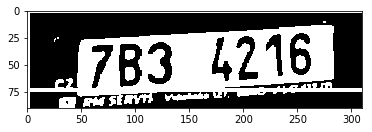

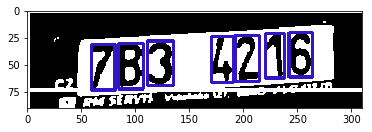

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00064
['4', 'E', '0', '2', '3', '0', '4']
{'4': ['4_0', '4_1'], '0': ['0_0', '0_1']}


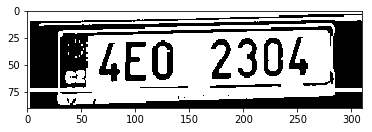

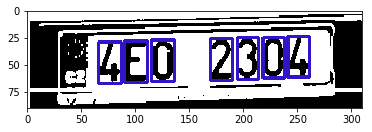

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00043
['7', 'B', '2', '9', '4', '3', '0']
{}


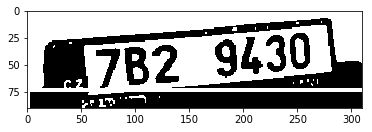

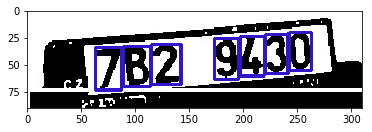

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00053
['B', 'Z', 'C', '4', '9', '3', '9']
{'9': ['9_0', '9_1']}


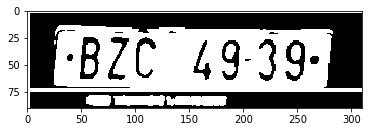

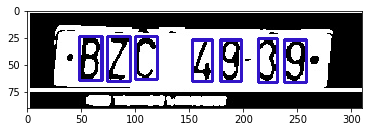

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00039
['1', 'B', 'C', '6', '7', '0', '3']
{}


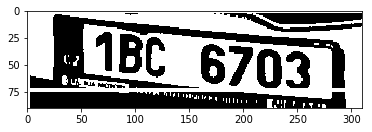

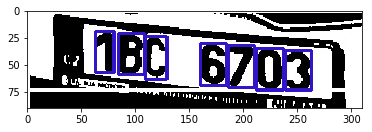

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00041
['6', 'B', '2', '3', '4', '5', '1']
{}


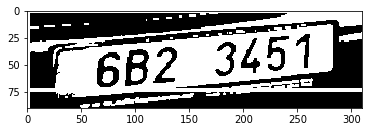

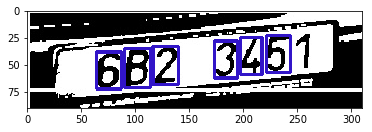

i am not saving


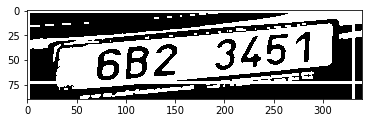

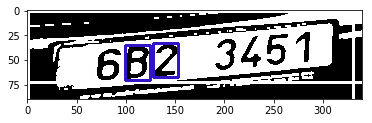

i am not saving
_----------------------------------__Starting______________________________------------------
I00044
['3', 'B', '4', '8', '2', '9', '6']
{}


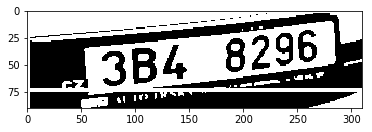

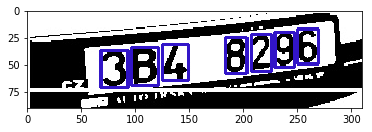

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00046
['6', 'B', '6', '7', '0', '3', '3']
{'3': ['3_0', '3_1'], '6': ['6_0', '6_1']}


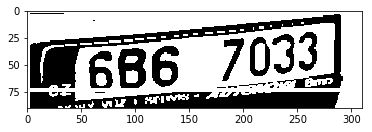

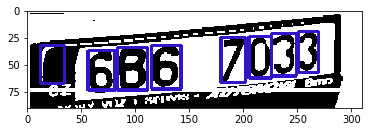

i am not saving


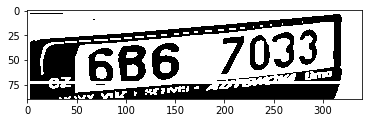

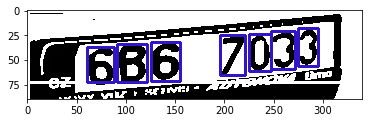

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00001
['1', 'B', '4', '9', '9', '5', '1']
{'9': ['9_0', '9_1'], '1': ['1_0', '1_1']}


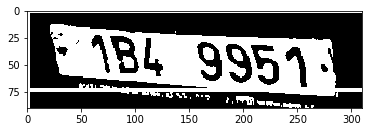

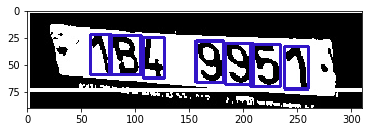

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00014
['1', 'A', 'T', '5', '8', '2', '8']
{'8': ['8_0', '8_1']}


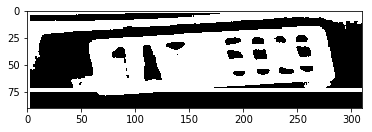

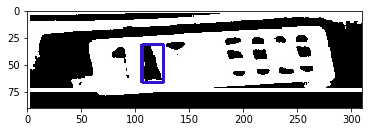

i am not saving


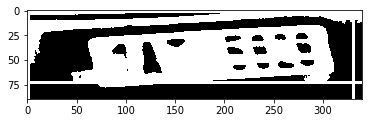

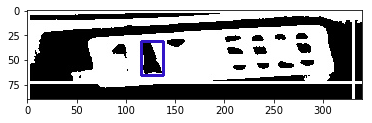

i am not saving
_----------------------------------__Starting______________________________------------------
I00061
['7', 'B', '5', '7', '2', '6', '7']
{'7': ['7_0', '7_1', '7_2']}


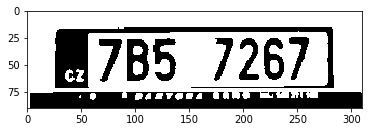

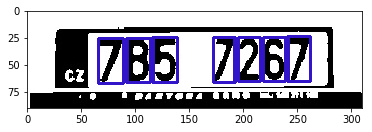

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00004
['8', 'B', '7', '9', '6', '9', '7']
{'9': ['9_0', '9_1'], '7': ['7_0', '7_1']}


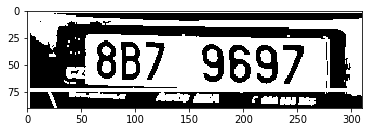

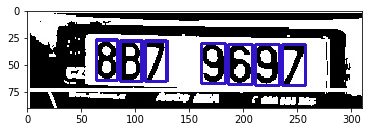

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00011
['7', 'B', '1', '0', '3', '0', '7']
{'0': ['0_0', '0_1'], '7': ['7_0', '7_1']}


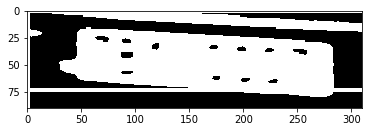

i am not saving


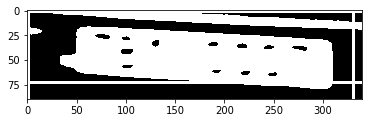

i am not saving
_----------------------------------__Starting______________________________------------------
I00050
['6', 'B', '0', '0', '3', '2', '0']
{'0': ['0_0', '0_1', '0_2']}


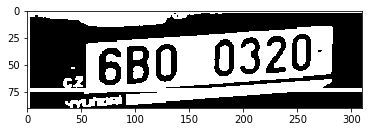

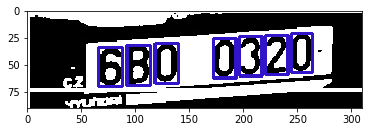

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00072
['2', 'A', 'N', '1', '9', '9', '1']
{'9': ['9_0', '9_1'], '1': ['1_0', '1_1']}


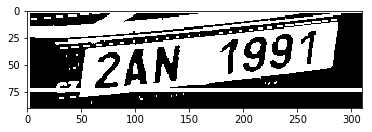

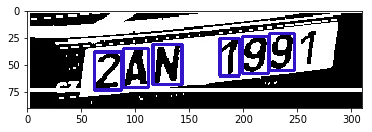

i am not saving


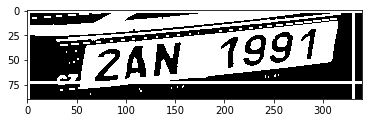

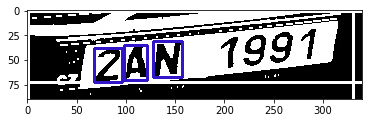

i am not saving
_----------------------------------__Starting______________________________------------------
I00066
['8', 'B', '6', '0', '5', '5', '2']
{'5': ['5_0', '5_1']}


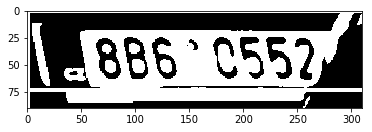

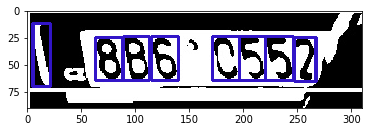

i am not saving


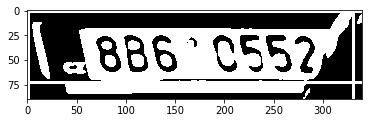

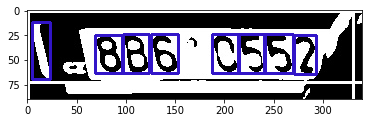

i am not saving
_----------------------------------__Starting______________________________------------------
I00046
['2', 'E', '7', '3', '6', '0', '9']
{}


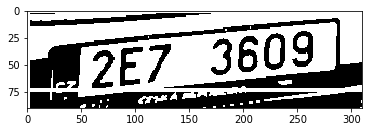

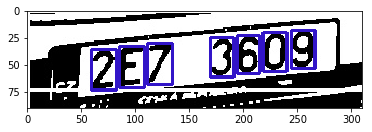

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00019
['9', 'B', '3', '8', '3', '6', '8']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


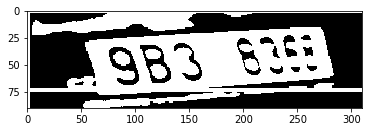

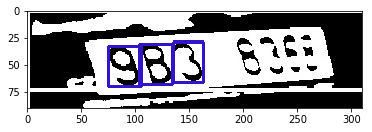

i am not saving


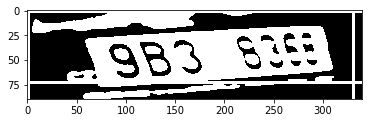

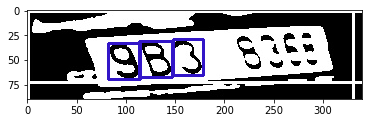

i am not saving
_----------------------------------__Starting______________________________------------------
I00052
['7', 'B', '5', '8', '3', '0', '7']
{'7': ['7_0', '7_1']}


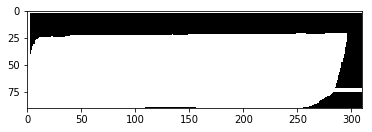

i am not saving


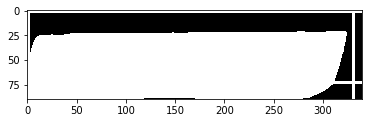

i am not saving
_----------------------------------__Starting______________________________------------------
I00065
['9', 'B', '9', '1', '4', '2', '0']
{'9': ['9_0', '9_1']}


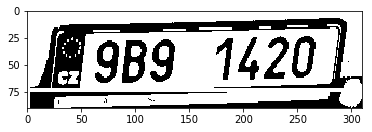

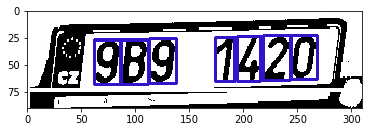

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00120
['4', 'B', '2', '2', '7', '8', '1']
{'2': ['2_0', '2_1']}


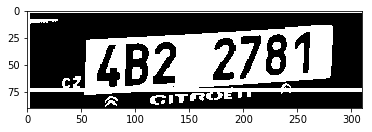

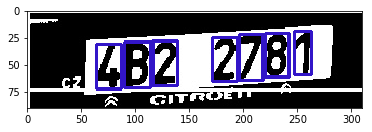

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00027
['B', 'Z', 'P', '2', '0', '8', '7']
{}


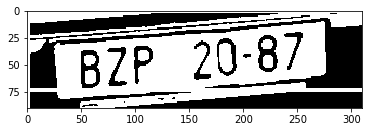

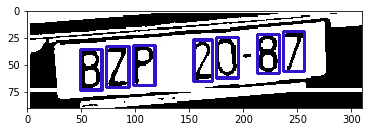

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00048
['4', 'A', 'F', '9', '5', '5', '3']
{'5': ['5_0', '5_1']}


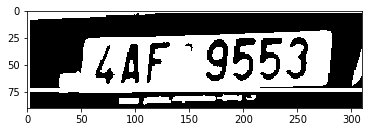

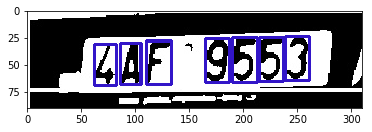

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00018
['5', 'B', '9', '7', '4', '2', '5']
{'5': ['5_0', '5_1']}


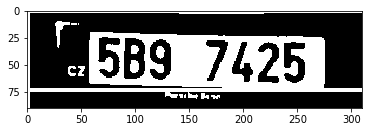

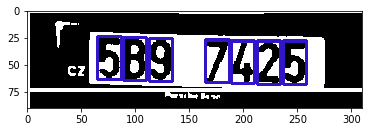

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00102
['9', 'B', '1', '4', '0', '1', '5']
{'1': ['1_0', '1_1']}


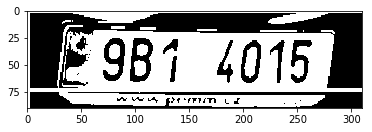

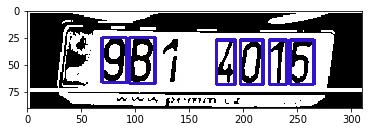

i am not saving


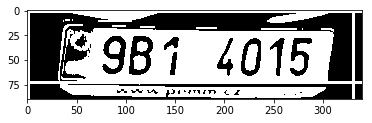

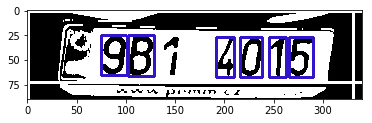

i am not saving
_----------------------------------__Starting______________________________------------------
I00007
['6', 'B', '4', '8', '9', '2', '7']
{}


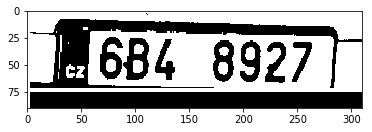

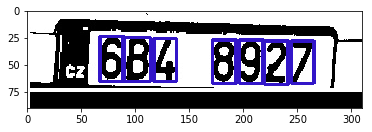

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00006
['8', 'T', '3', '2', '2', '9', '0']
{'2': ['2_0', '2_1']}


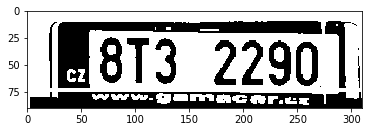

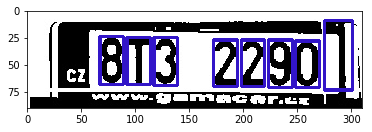

i am not saving


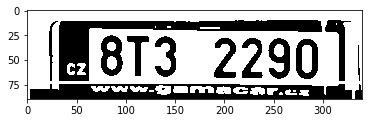

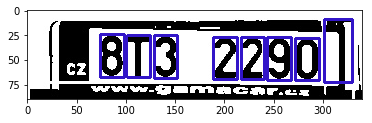

i am not saving
_----------------------------------__Starting______________________________------------------
I00058
['8', 'B', '6', '4', '7', '0', '2']
{}


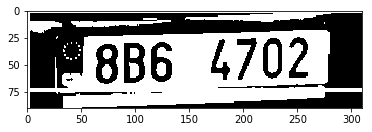

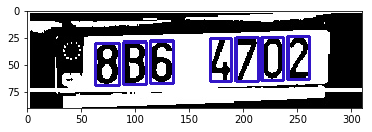

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00062
['B', 'Z', 'P', '6', '4', '8', '0']
{}


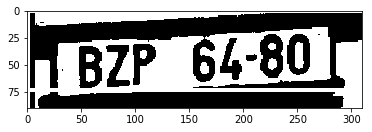

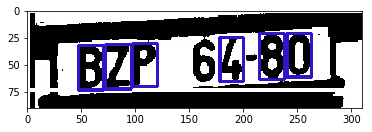

i am not saving


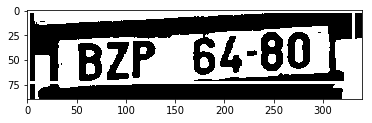

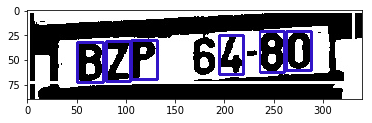

i am not saving
_----------------------------------__Starting______________________________------------------
I00037
['B', '0', 'L', '3', '4', '0', '3']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


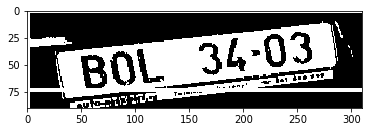

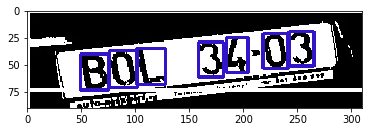

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00132
['7', 'B', '8', '9', '5', '4', '5']
{'5': ['5_0', '5_1']}


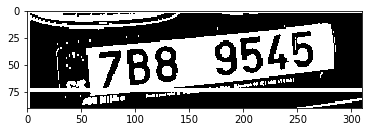

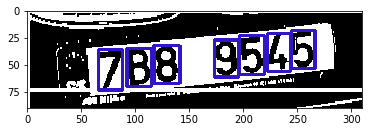

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00057
['3', 'A', 'J', '8', '9', '3', '0']
{'3': ['3_0', '3_1']}


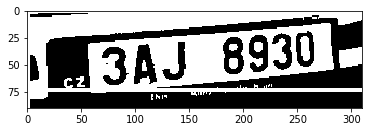

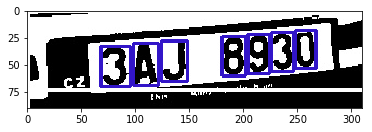

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00025
['5', 'B', '7', '7', '6', '5', '5']
{'5': ['5_0', '5_1', '5_2'], '7': ['7_0', '7_1']}


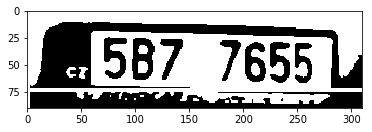

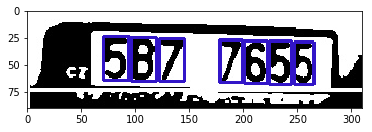

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00056
['4', 'B', '7', '6', '1', '4', '8']
{'4': ['4_0', '4_1']}


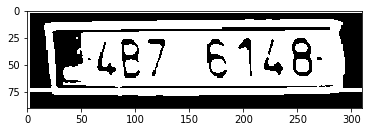

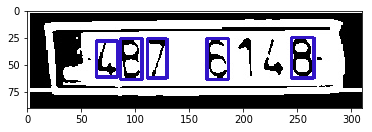

i am not saving


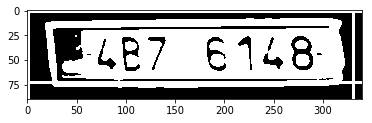

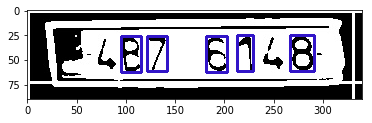

i am not saving
_----------------------------------__Starting______________________________------------------
I00006
['8', 'B', '4', '6', '8', '5', '1']
{'8': ['8_0', '8_1']}


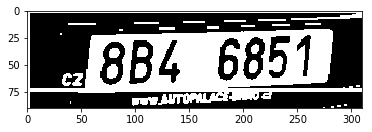

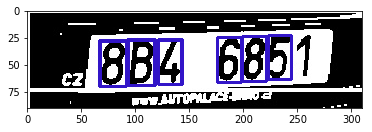

i am not saving


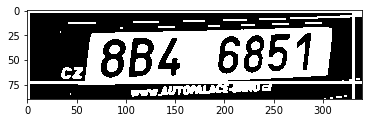

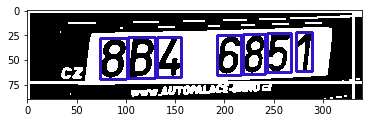

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00017
['2', 'B', '1', '7', '5', '1', '5']
{'1': ['1_0', '1_1'], '5': ['5_0', '5_1']}


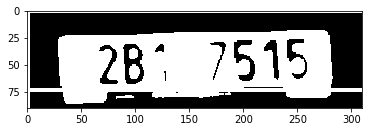

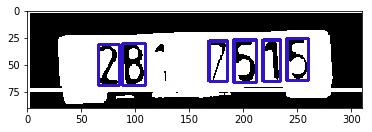

i am not saving


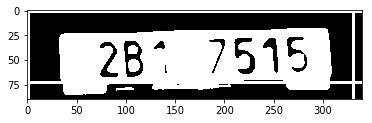

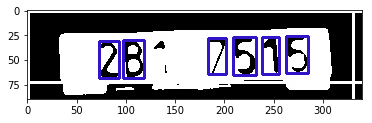

i am not saving
_----------------------------------__Starting______________________________------------------
I00014
['1', 'A', 'T', '5', '8', '2', '8']
{'8': ['8_0', '8_1']}


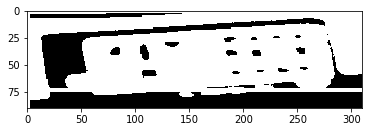

i am not saving


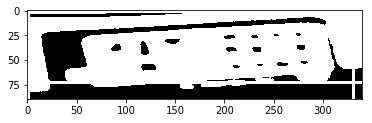

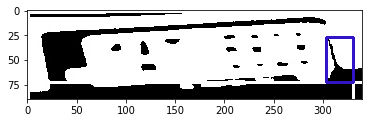

i am not saving
_----------------------------------__Starting______________________________------------------
I00078
['3', 'B', '0', '9', '9', '3', '2']
{'3': ['3_0', '3_1'], '9': ['9_0', '9_1']}


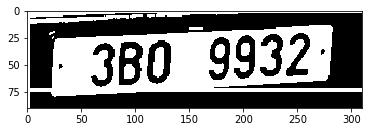

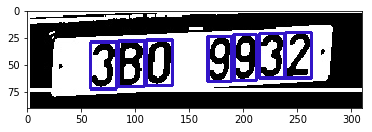

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00095
['2', 'B', '9', '7', '3', '2', '5']
{'2': ['2_0', '2_1']}


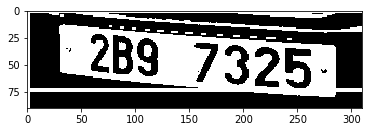

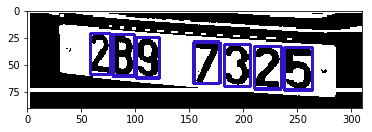

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00072
['7', 'B', '3', '0', '1', '3', '5']
{'3': ['3_0', '3_1']}


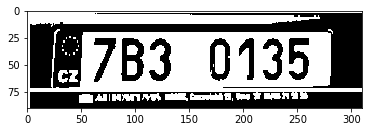

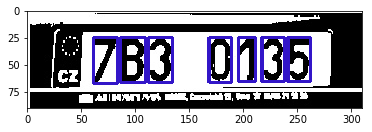

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00041
['4', 'B', '0', '7', '0', '0', '3']
{'0': ['0_0', '0_1', '0_2']}


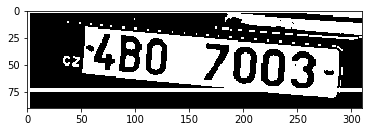

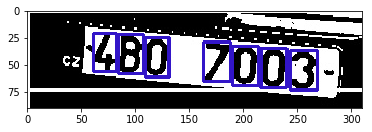

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00092
['9', 'B', '2', '9', '2', '7', '4']
{'9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


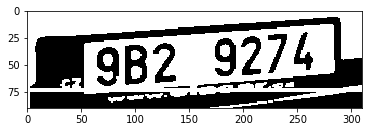

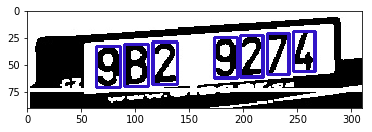

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['4', 'M', '3', '4', '4', '6', '2']
{'4': ['4_0', '4_1', '4_2']}


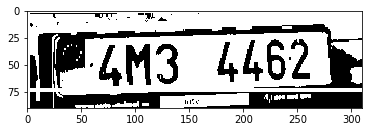

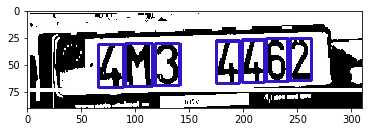

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00028
['5', 'C', '9', '3', '9', '8', '8']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


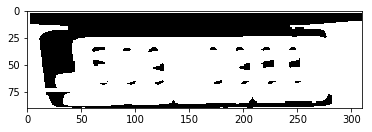

i am not saving


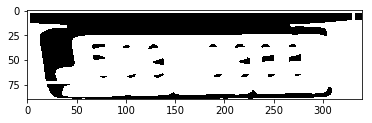

i am not saving
_----------------------------------__Starting______________________________------------------
I00067
['5', 'B', '1', '1', '1', '4', '9']
{'1': ['1_0', '1_1', '1_2']}


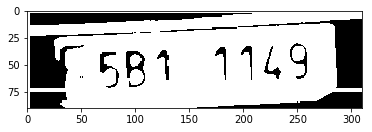

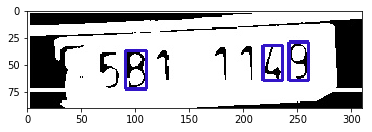

i am not saving


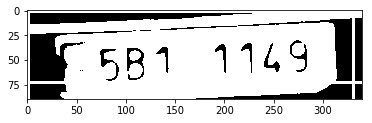

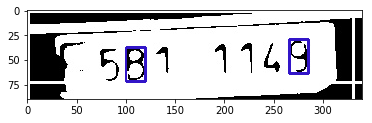

i am not saving
_----------------------------------__Starting______________________________------------------
I00020
['8', 'B', '7', '1', '4', '0', '1']
{'1': ['1_0', '1_1']}


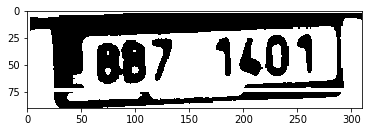

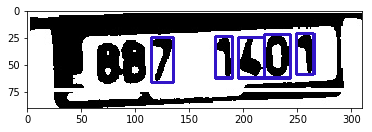

i am not saving


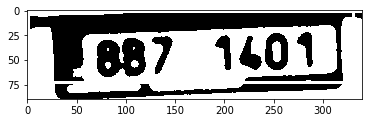

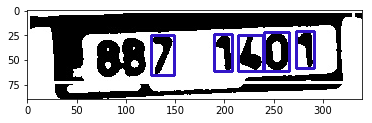

i am not saving
_----------------------------------__Starting______________________________------------------
I00007
['5', 'C', '6', '5', '5', '7', '8']
{'5': ['5_0', '5_1', '5_2']}


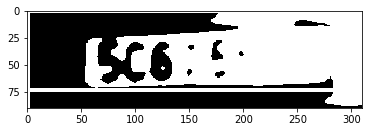

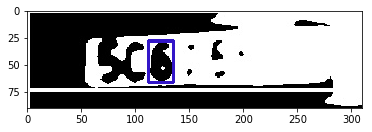

i am not saving


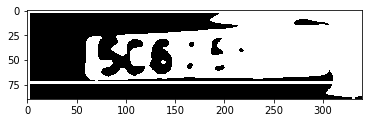

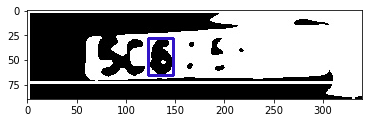

i am not saving
_----------------------------------__Starting______________________________------------------
I00126
['7', 'B', '9', '0', '9', '9', '0']
{'0': ['0_0', '0_1'], '9': ['9_0', '9_1', '9_2']}


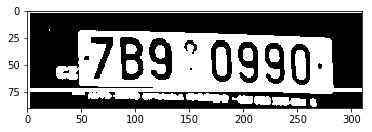

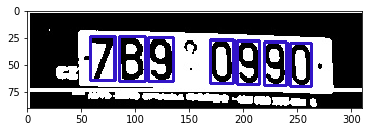

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00042
['7', 'B', '1', '5', '7', '1', '4']
{'1': ['1_0', '1_1'], '7': ['7_0', '7_1']}


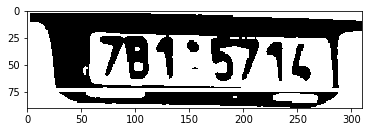

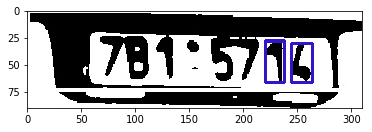

i am not saving


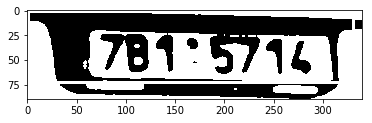

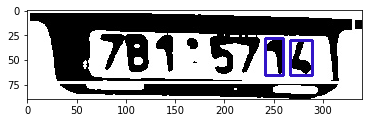

i am not saving
_----------------------------------__Starting______________________________------------------
I00047
['8', 'B', '1', '0', '7', '3', '2']
{}


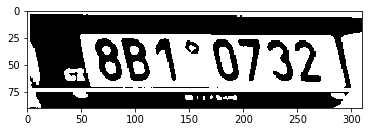

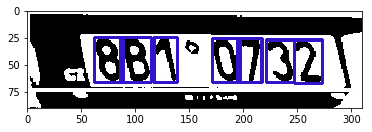

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00034
['2', 'Z', '5', '2', '6', '8', '9']
{'2': ['2_0', '2_1']}


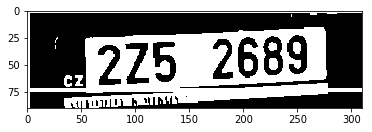

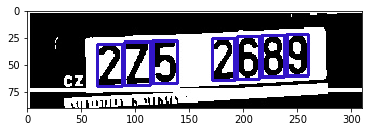

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00055
['1', 'B', 'A', '0', '8', '8', '8']
{'8': ['8_0', '8_1', '8_2']}


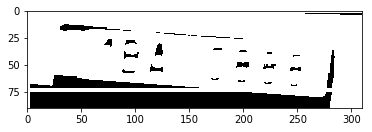

i am not saving


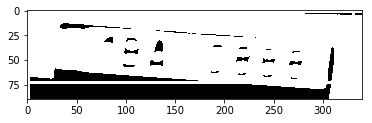

i am not saving
_----------------------------------__Starting______________________________------------------
I00020
['1', 'B', '6', '1', '1', '7', '8']
{'1': ['1_0', '1_1', '1_2']}


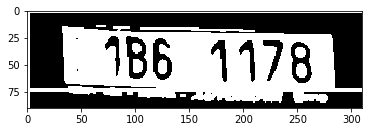

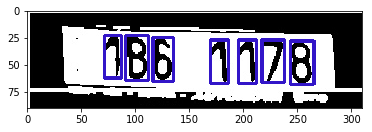

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00029
['1', 'B', 'A', '1', '1', '1', '4']
{'1': ['1_0', '1_1', '1_2', '1_3']}


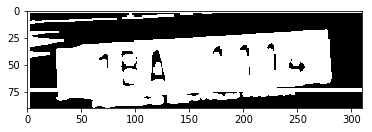

i am not saving


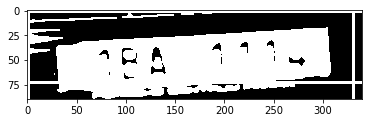

i am not saving
_----------------------------------__Starting______________________________------------------
I00013
['7', 'B', '9', '1', '1', '0', '2']
{'1': ['1_0', '1_1']}


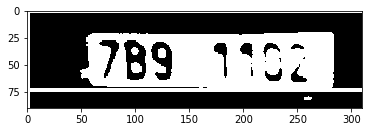

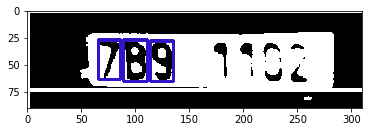

i am not saving


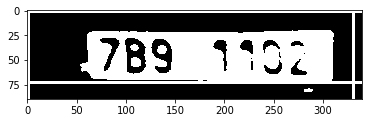

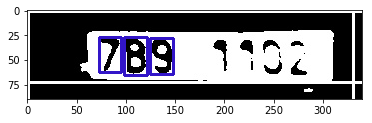

i am not saving
_----------------------------------__Starting______________________________------------------
I00021
['5', 'B', '9', '7', '4', '2', '5']
{'5': ['5_0', '5_1']}


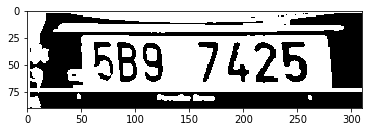

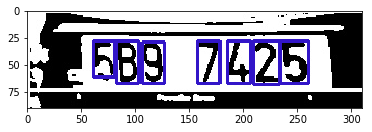

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00004
['8', 'T', '4', '3', '4', '1', '8']
{'8': ['8_0', '8_1'], '4': ['4_0', '4_1']}


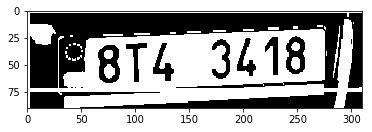

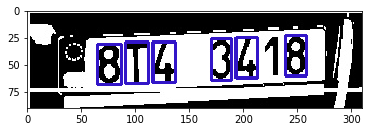

i am not saving


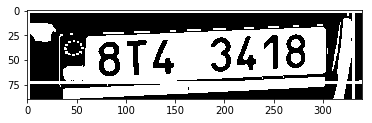

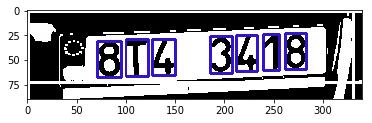

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00078
['3', 'B', '0', '9', '9', '3', '2']
{'3': ['3_0', '3_1'], '9': ['9_0', '9_1']}


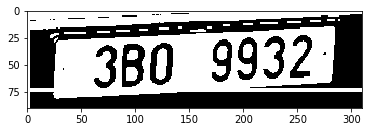

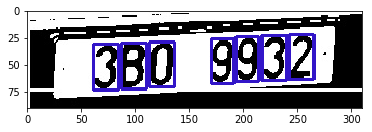

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00038
['4', 'A', 'F', '9', '5', '5', '3']
{'5': ['5_0', '5_1']}


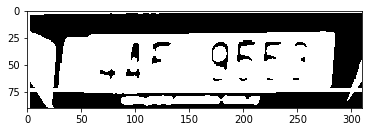

i am not saving


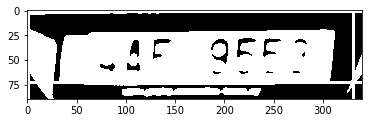

i am not saving
_----------------------------------__Starting______________________________------------------
I00121
['7', 'B', '7', '2', '7', '2', '9']
{'7': ['7_0', '7_1', '7_2'], '2': ['2_0', '2_1']}


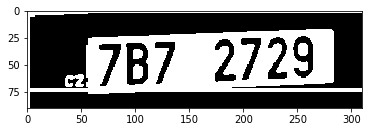

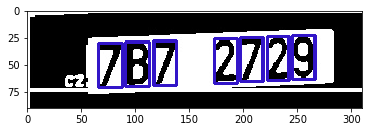

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00057
['6', 'B', '2', '6', '0', '5', '0']
{'6': ['6_0', '6_1'], '0': ['0_0', '0_1']}


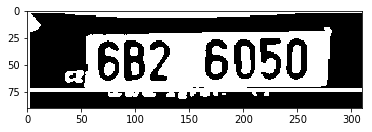

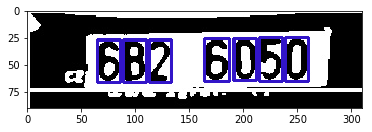

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00098
['2', 'B', '7', '5', '8', '3', '6']
{}


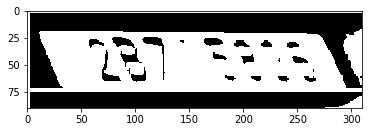

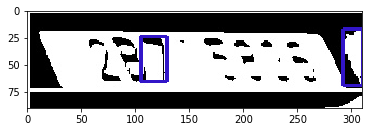

i am not saving


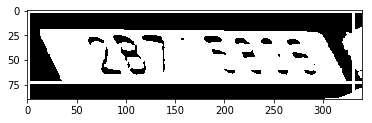

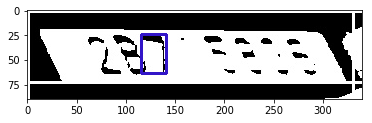

i am not saving
_----------------------------------__Starting______________________________------------------
I00020
['1', 'B', '8', '7', '8', '1', '9']
{'1': ['1_0', '1_1'], '8': ['8_0', '8_1']}


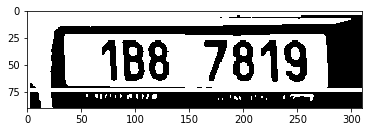

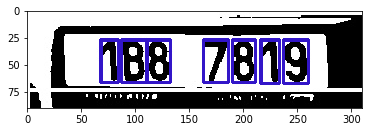

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00002
['4', 'B', '1', '0', '0', '3', '6']
{'0': ['0_0', '0_1']}


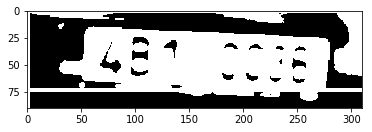

i am not saving


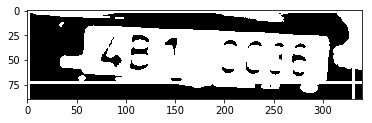

i am not saving
_----------------------------------__Starting______________________________------------------
I00053
['B', 'Z', 'C', '4', '9', '3', '9']
{'9': ['9_0', '9_1']}


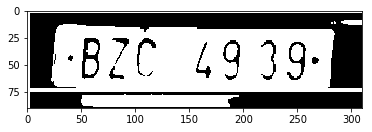

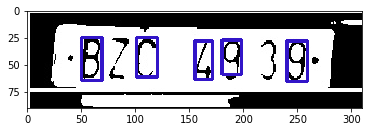

i am not saving


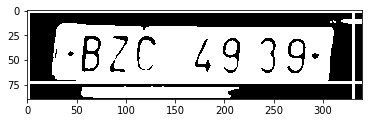

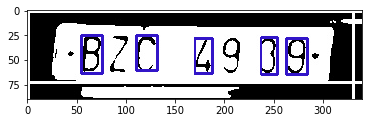

i am not saving
_----------------------------------__Starting______________________________------------------
I00120
['4', 'B', '2', '2', '7', '8', '1']
{'2': ['2_0', '2_1']}


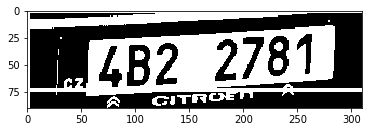

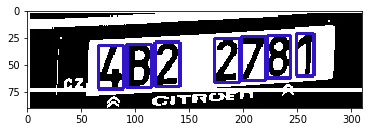

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00075
['1', 'B', 'A', '3', '4', '2', '8']
{}


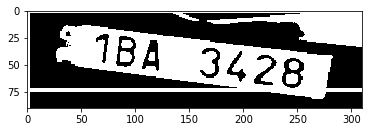

i am not saving


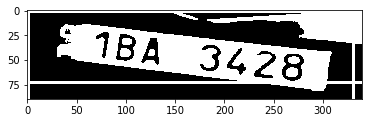

i am not saving
_----------------------------------__Starting______________________________------------------
I00135
['2', 'B', '7', '3', '7', '6', '8']
{'7': ['7_0', '7_1']}


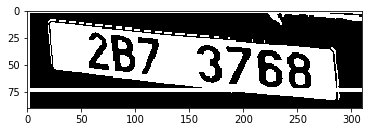

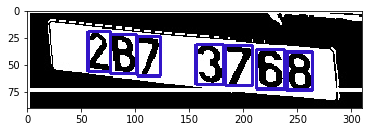

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00021
['9', 'B', '8', '8', '3', '6', '3']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


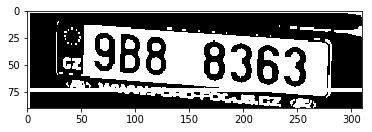

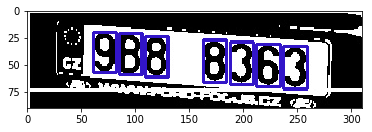

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00006
['4', 'B', '0', '2', '4', '6', '6']
{'6': ['6_0', '6_1'], '4': ['4_0', '4_1']}


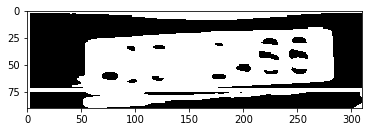

i am not saving


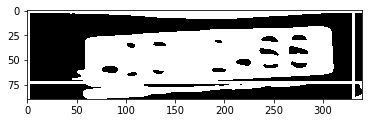

i am not saving
_----------------------------------__Starting______________________________------------------
I00013
['4', 'Z', '4', '2', '4', '0', '7']
{'4': ['4_0', '4_1', '4_2']}


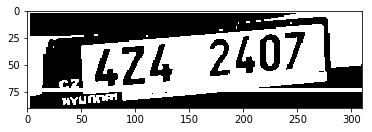

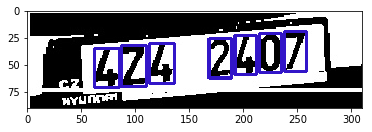

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00015
['7', 'B', '1', '4', '3', '4', '9']
{'4': ['4_0', '4_1']}


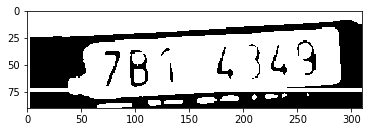

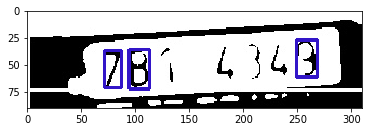

i am not saving


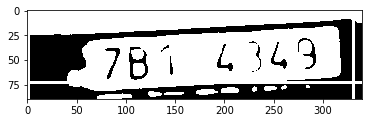

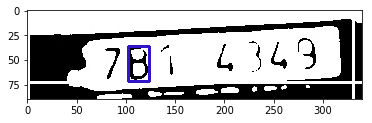

i am not saving
_----------------------------------__Starting______________________________------------------
I00126
['7', 'B', '9', '0', '9', '9', '0']
{'0': ['0_0', '0_1'], '9': ['9_0', '9_1', '9_2']}


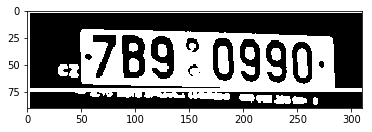

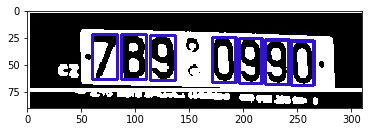

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00097
['9', 'B', '9', '8', '7', '7', '7']
{'9': ['9_0', '9_1'], '7': ['7_0', '7_1', '7_2']}


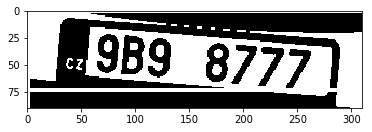

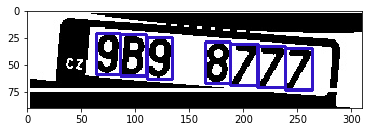

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00019
['5', 'B', '2', '8', '8', '9', '3']
{'8': ['8_0', '8_1']}


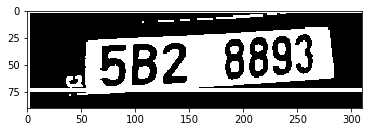

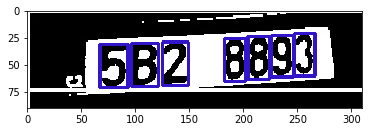

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00114
['1', 'B', 'C', '1', '0', '4', '6']
{'1': ['1_0', '1_1']}


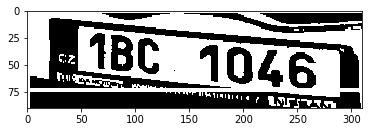

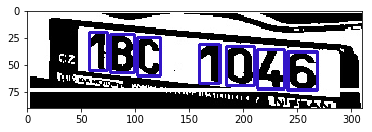

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00003
['1', 'B', 'C', '5', '1', '3', '8']
{'1': ['1_0', '1_1']}


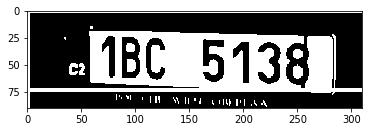

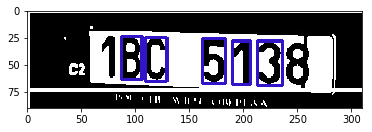

i am not saving


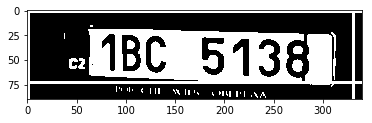

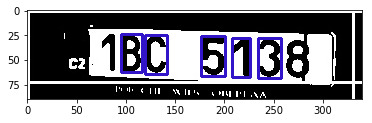

i am not saving
_----------------------------------__Starting______________________________------------------
I00011
['8', 'B', '7', '9', '6', '9', '7']
{'9': ['9_0', '9_1'], '7': ['7_0', '7_1']}


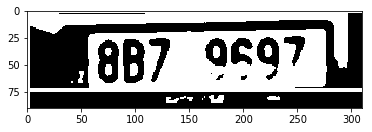

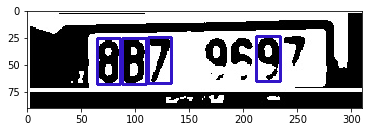

i am not saving


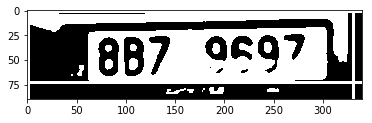

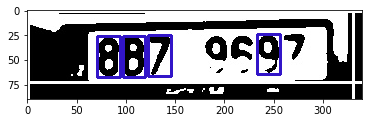

i am not saving
_----------------------------------__Starting______________________________------------------
I00050
['4', 'B', '0', '1', '8', '3', '2']
{}


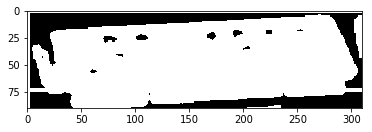

i am not saving


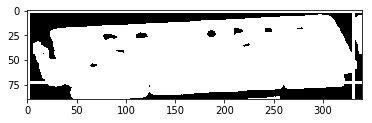

i am not saving
_----------------------------------__Starting______________________________------------------
I00053
['9', 'B', '7', '8', '7', '0', '1']
{'7': ['7_0', '7_1']}


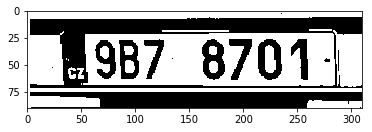

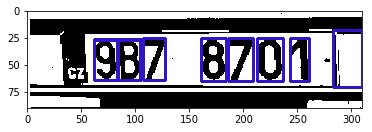

i am not saving


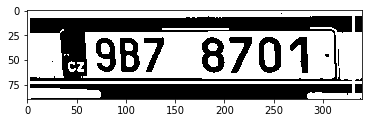

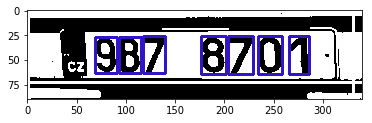

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00044
['3', 'B', '4', '8', '2', '9', '6']
{}


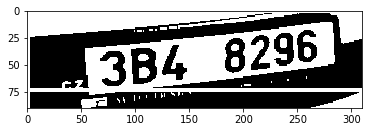

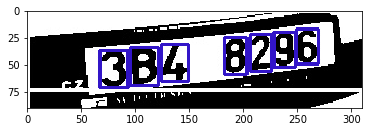

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00024
['9', 'B', '3', '0', '1', '3', '0']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


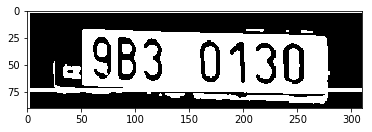

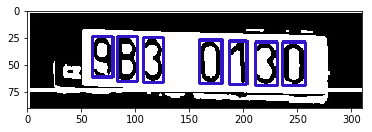

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00052
['4', 'B', '5', '6', '3', '9', '6']
{'6': ['6_0', '6_1']}


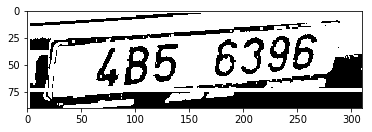

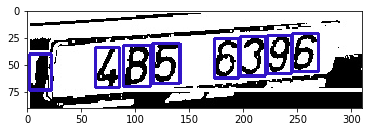

i am not saving


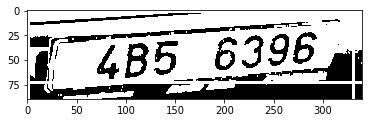

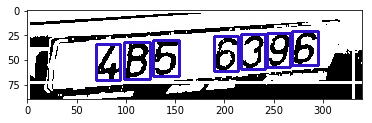

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00034
['7', 'B', '3', '2', '4', '4', '3']
{'3': ['3_0', '3_1'], '4': ['4_0', '4_1']}


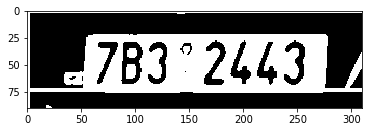

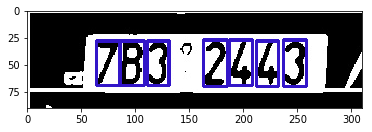

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00073
['5', 'B', '1', '1', '1', '4', '9']
{'1': ['1_0', '1_1', '1_2']}


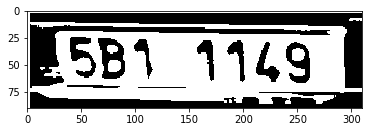

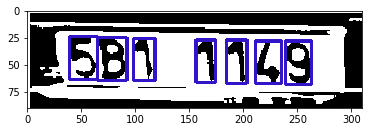

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00116
['3', 'B', '6', '0', '8', '5', '4']
{}


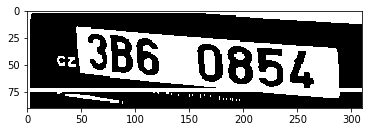

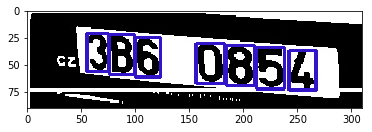

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00042
['8', 'B', '5', '3', '3', '0', '8']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


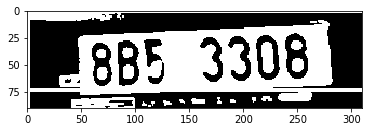

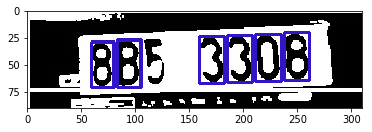

i am not saving


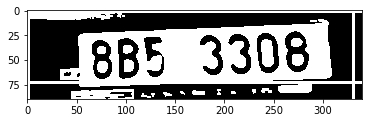

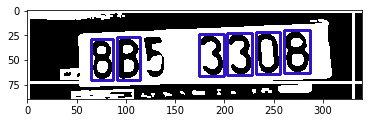

i am not saving
_----------------------------------__Starting______________________________------------------
I00002
['B', 'Z', 'L', '4', '0', '8', '5']
{}


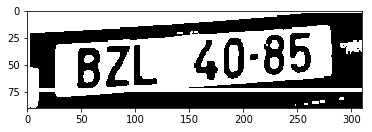

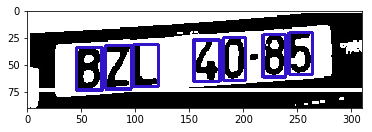

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00008
['2', 'B', '2', '0', '1', '7', '4']
{'2': ['2_0', '2_1']}


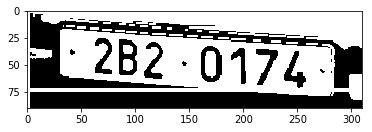

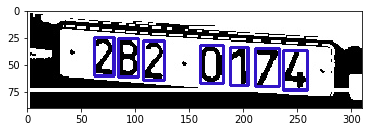

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00089
['1', 'E', '5', '9', '7', '0', '6']
{}


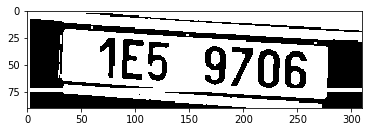

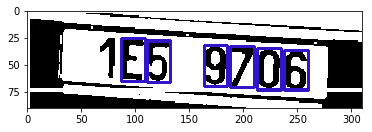

i am not saving


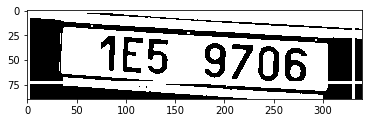

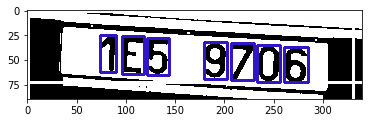

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00015
['9', 'B', '3', '3', '2', '9', '7']
{'3': ['3_0', '3_1'], '9': ['9_0', '9_1']}


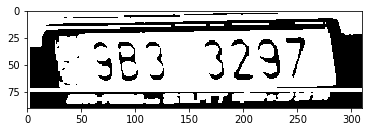

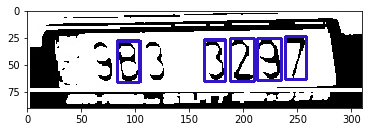

i am not saving


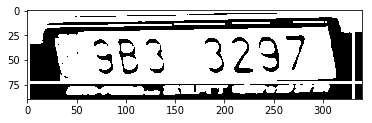

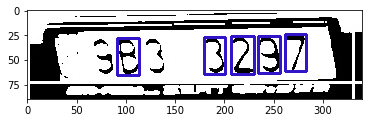

i am not saving
_----------------------------------__Starting______________________________------------------
I00034
['8', 'B', '2', '3', '1', '7', '0']
{}


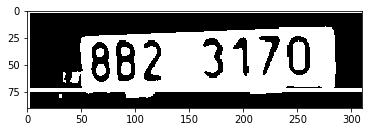

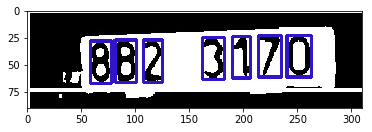

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00001
['6', 'B', '9', '4', '5', '5', '8']
{'5': ['5_0', '5_1']}


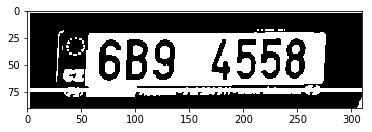

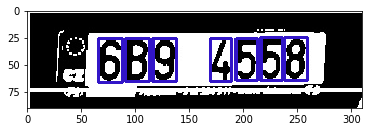

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00067
['5', 'B', '3', '8', '4', '3', '4']
{'3': ['3_0', '3_1'], '4': ['4_0', '4_1']}


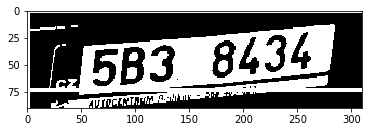

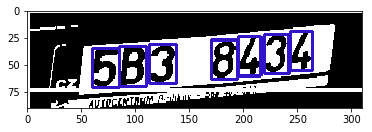

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00033
['D', 'T', '6', '1', '2', 'B', 'C']
{}


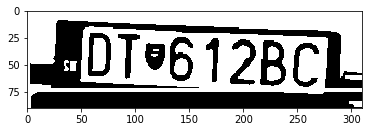

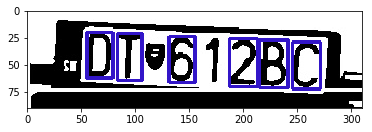

i am not saving


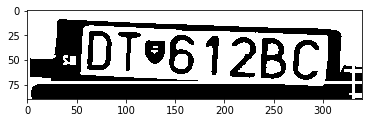

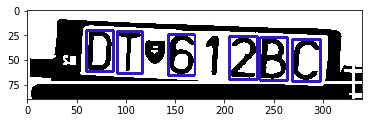

i am not saving
_----------------------------------__Starting______________________________------------------
I00091
['5', 'B', '2', '4', '5', '4', '6']
{'4': ['4_0', '4_1'], '5': ['5_0', '5_1']}


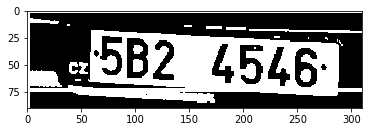

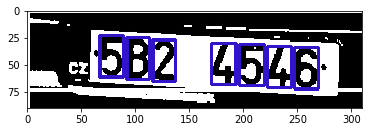

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00074
['5', 'B', '1', '1', '3', '0', '0']
{'0': ['0_0', '0_1'], '1': ['1_0', '1_1']}


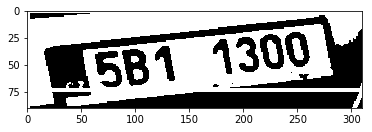

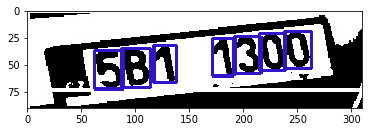

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00060
['B', 'Z', 'P', '6', '4', '8', '0']
{}


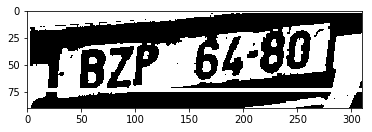

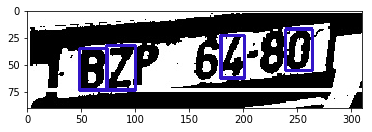

i am not saving


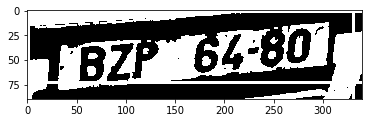

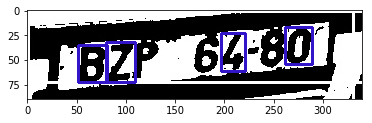

i am not saving
_----------------------------------__Starting______________________________------------------
I00034
['2', 'Z', '5', '2', '6', '8', '9']
{'2': ['2_0', '2_1']}


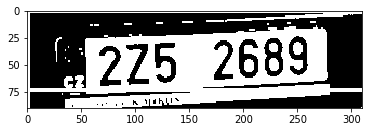

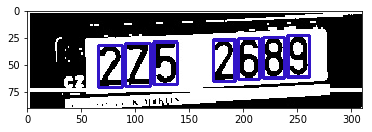

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00060
['4', 'A', 'Z', '3', '8', '0', '2']
{}


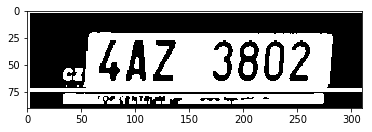

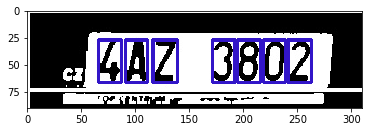

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00112
['8', 'T', '8', '4', '0', '6', '5']
{'8': ['8_0', '8_1']}


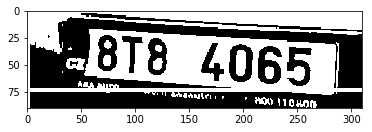

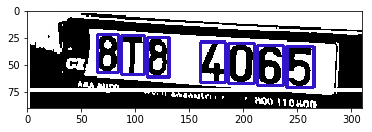

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00058
['B', 'Z', '0', '4', '9', '6', '6']
{'6': ['6_0', '6_1']}


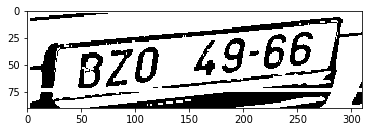

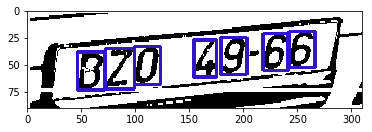

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00060
['B', 'Z', 'P', '6', '4', '8', '0']
{}


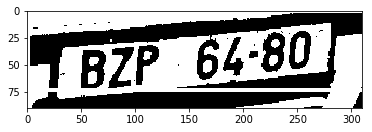

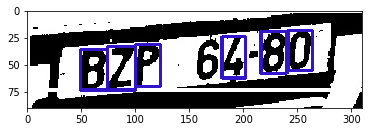

i am not saving


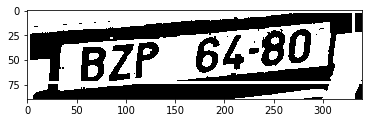

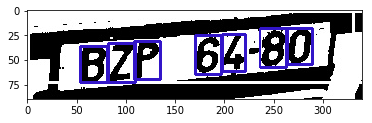

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00082
['1', 'B', '7', '0', '2', '3', '0']
{'0': ['0_0', '0_1']}


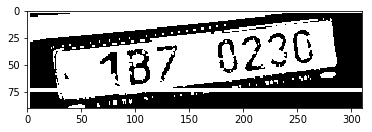

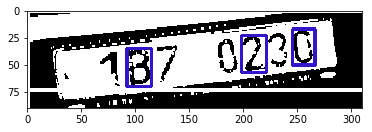

i am not saving


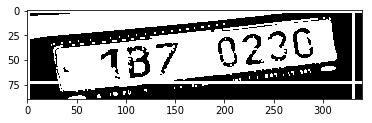

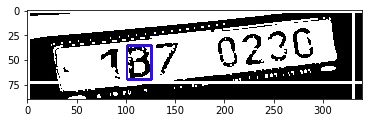

i am not saving
_----------------------------------__Starting______________________________------------------
I00077
['8', 'B', '6', '8', '5', '0', '8']
{'8': ['8_0', '8_1', '8_2']}


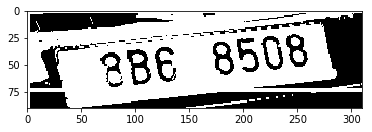

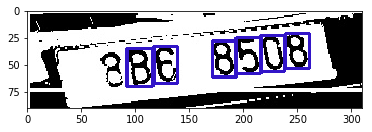

i am not saving


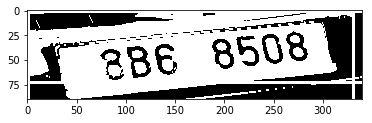

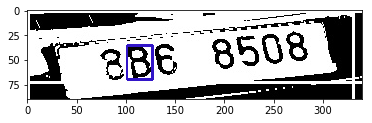

i am not saving
_----------------------------------__Starting______________________________------------------
I00015
['3', 'B', '3', '7', '9', '0', '2']
{'3': ['3_0', '3_1']}


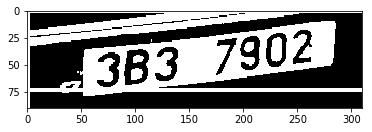

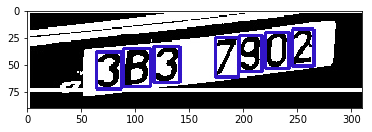

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00132
['7', 'B', '8', '9', '5', '4', '5']
{'5': ['5_0', '5_1']}


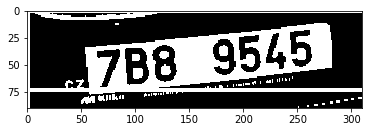

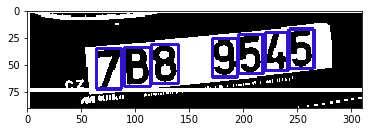

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00046
['2', 'E', '7', '3', '6', '0', '9']
{}


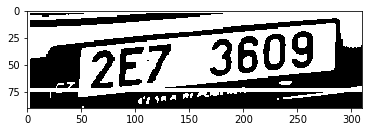

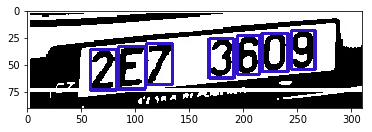

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00005
['6', 'B', '5', '1', '2', '5', '5']
{'5': ['5_0', '5_1', '5_2']}


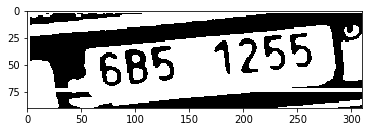

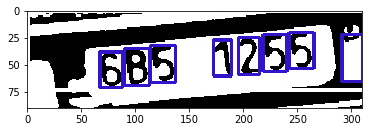

i am not saving


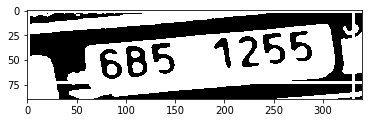

i am not saving
_----------------------------------__Starting______________________________------------------
I00122
['B', 'M', 'Z', '3', '9', '3', '3']
{'3': ['3_0', '3_1', '3_2']}


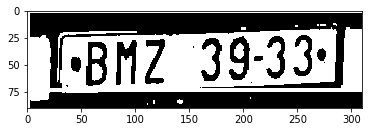

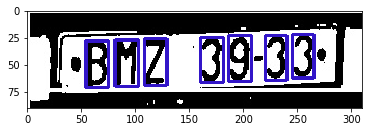

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00006
['5', 'B', '1', '1', '1', '8', '1']
{'1': ['1_0', '1_1', '1_2', '1_3']}


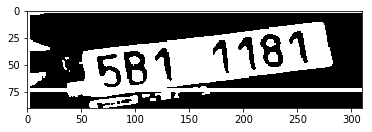

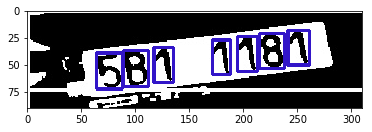

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00063
['6', 'B', '8', '8', '3', '0', '4']
{'8': ['8_0', '8_1']}


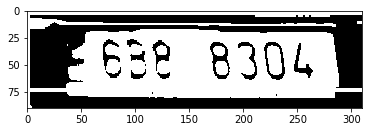

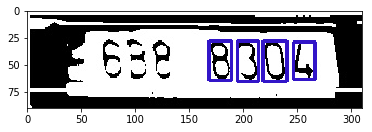

i am not saving


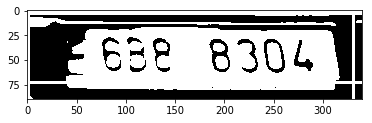

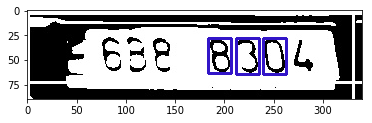

i am not saving
_----------------------------------__Starting______________________________------------------
I00127
['6', 'B', '7', '0', '9', '9', '0']
{'9': ['9_0', '9_1'], '0': ['0_0', '0_1']}


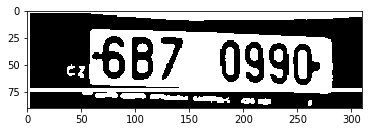

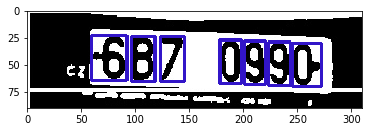

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00005
['L', 'L', '4', '3', '5', 'J', 'G']
{'L': ['L_0', 'L_1']}


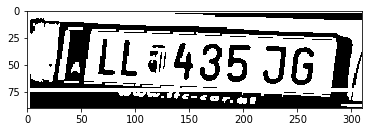

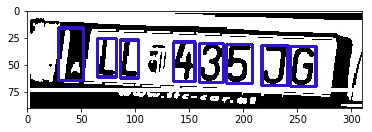

i am not saving


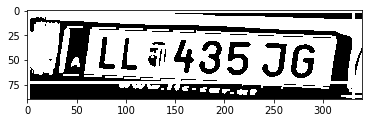

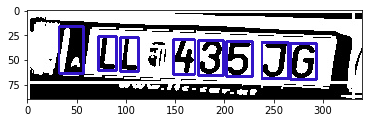

i am not saving
_----------------------------------__Starting______________________________------------------
I00124
['2', 'M', '2', '5', '9', '4', '8']
{'2': ['2_0', '2_1']}


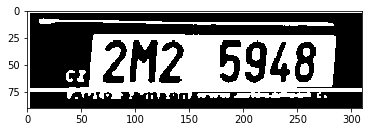

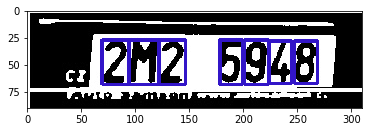

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00044
['7', 'B', '6', '1', '6', '2', '3']
{'6': ['6_0', '6_1']}


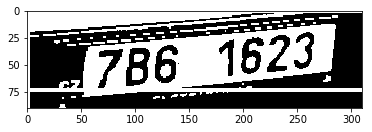

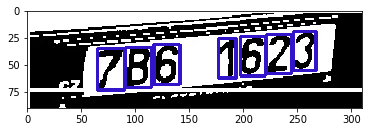

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00006
['5', 'B', '1', '1', '1', '8', '1']
{'1': ['1_0', '1_1', '1_2', '1_3']}


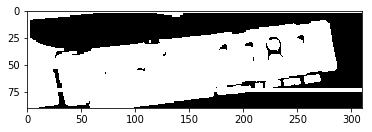

i am not saving


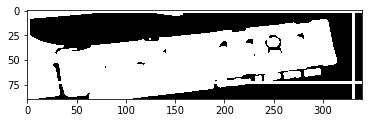

i am not saving
_----------------------------------__Starting______________________________------------------
I00054
['2', 'B', '3', '8', '2', '8', '0']
{'8': ['8_0', '8_1'], '2': ['2_0', '2_1']}


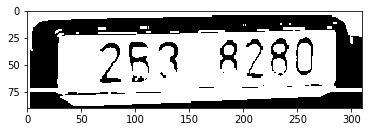

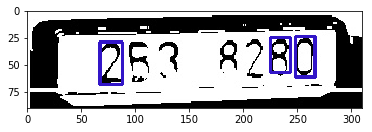

i am not saving


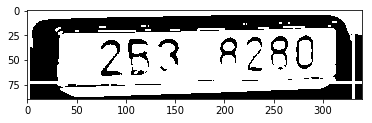

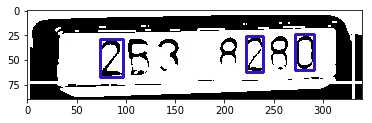

i am not saving
_----------------------------------__Starting______________________________------------------
I00113
['4', 'A', 'C', '5', '7', '1', '0']
{}


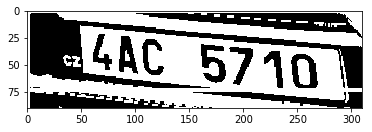

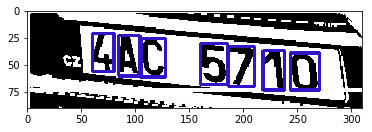

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00075
['7', 'B', '7', '3', '4', '8', '5']
{'7': ['7_0', '7_1']}


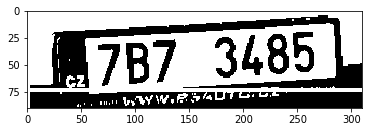

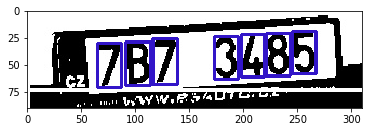

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00057
['8', 'B', '8', '1', '0', '1', '3']
{'1': ['1_0', '1_1'], '8': ['8_0', '8_1']}


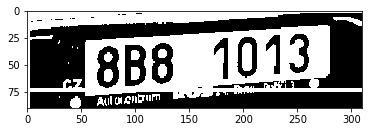

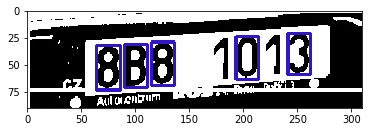

i am not saving


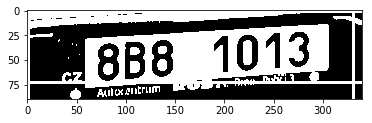

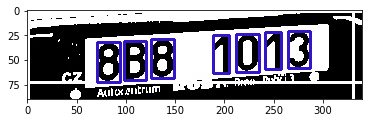

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00028
['5', 'C', '9', '3', '9', '8', '8']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


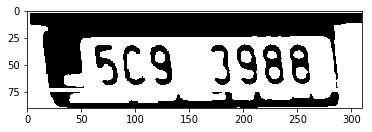

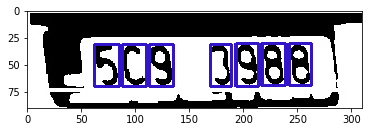

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00021
['9', 'B', '8', '8', '3', '6', '3']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


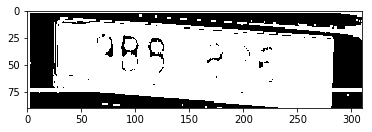

i am not saving


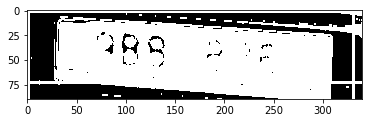

i am not saving
_----------------------------------__Starting______________________________------------------
I00032
['7', 'B', '1', '1', '8', '5', '9']
{'1': ['1_0', '1_1']}


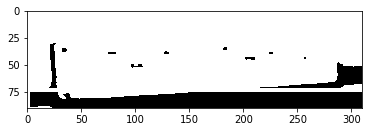

i am not saving


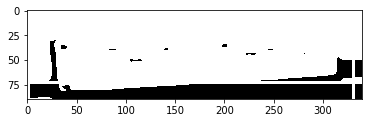

i am not saving
_----------------------------------__Starting______________________________------------------
I00071
['B', 'Z', 'N', '1', '0', '6', '5']
{}


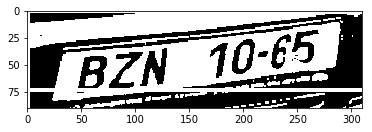

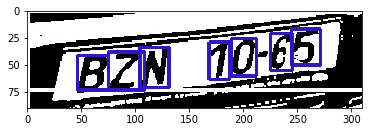

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00008
['4', 'B', '8', '2', '8', '4', '0']
{'8': ['8_0', '8_1'], '4': ['4_0', '4_1']}


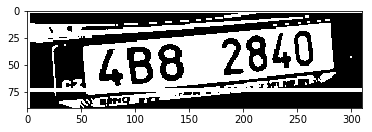

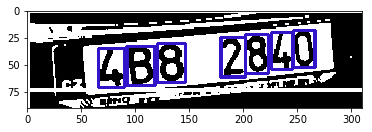

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00140
['9', 'B', '8', '6', '9', '0', '6']
{'9': ['9_0', '9_1'], '6': ['6_0', '6_1']}


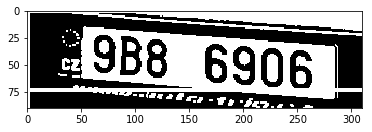

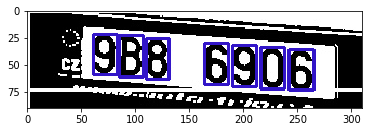

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00042
['7', 'B', '1', '5', '7', '1', '4']
{'1': ['1_0', '1_1'], '7': ['7_0', '7_1']}


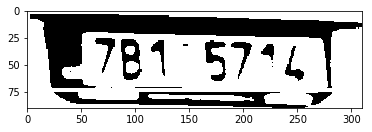

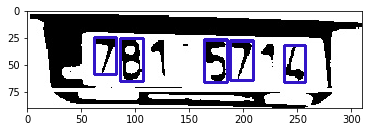

i am not saving


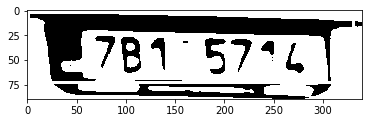

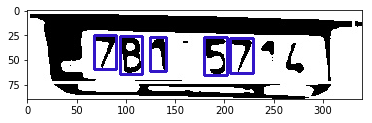

i am not saving
_----------------------------------__Starting______________________________------------------
I00061
['1', 'B', 'I', '1', '7', '1', '0']
{'1': ['1_0', '1_1', '1_2']}


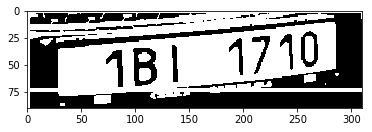

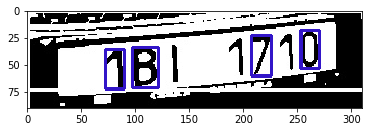

i am not saving


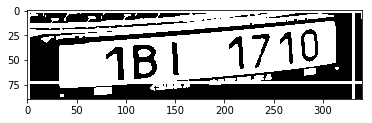

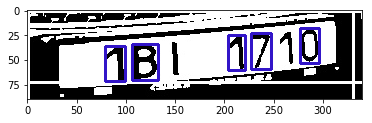

i am not saving
_----------------------------------__Starting______________________________------------------
I00077
['8', 'B', '6', '8', '5', '0', '8']
{'8': ['8_0', '8_1', '8_2']}


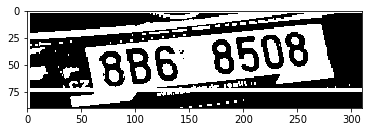

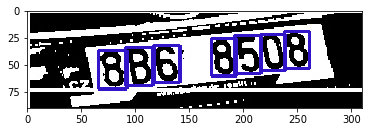

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00079
['B', 'Z', '0', '5', '0', '4', '2']
{'0': ['0_0', '0_1']}


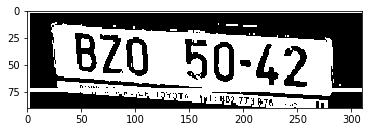

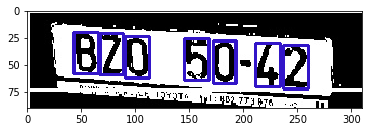

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00026
['1', 'B', 'A', '1', '1', '1', '4']
{'1': ['1_0', '1_1', '1_2', '1_3']}


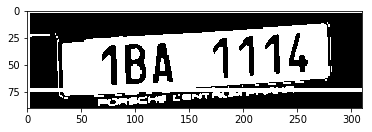

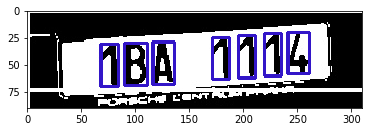

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00027
['B', 'Z', 'P', '2', '0', '8', '7']
{}


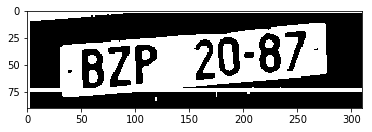

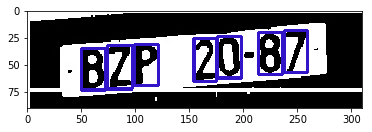

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00129
['3', 'B', '2', '5', '2', '2', '9']
{'2': ['2_0', '2_1', '2_2']}


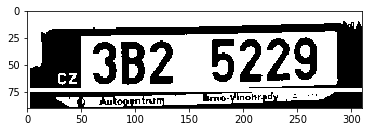

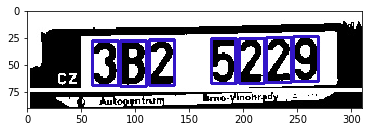

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00035
['7', 'B', '3', '0', '3', '3', '2']
{'3': ['3_0', '3_1', '3_2']}


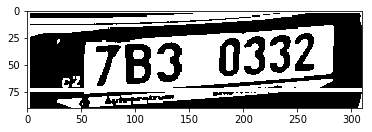

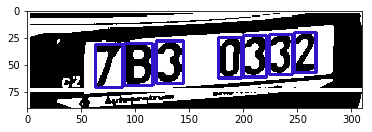

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00067
['8', 'T', '5', '2', '0', '9', '9']
{'9': ['9_0', '9_1']}


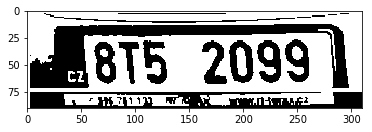

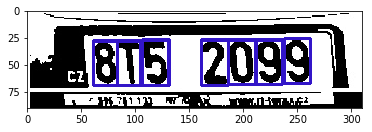

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00056
['9', 'B', '4', '9', '3', '6', '5']
{'9': ['9_0', '9_1']}


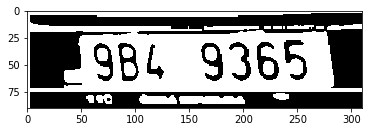

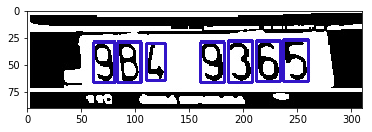

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00080
['9', 'T', '1', '9', '2', '0', '2']
{'9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


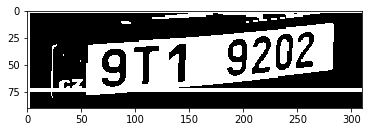

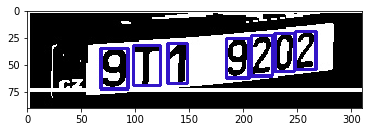

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00013
['1', 'B', '9', '4', '6', '8', '6']
{'6': ['6_0', '6_1']}


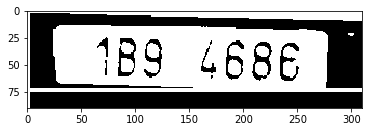

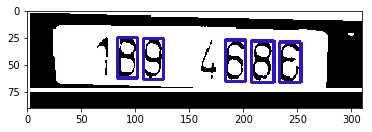

i am not saving


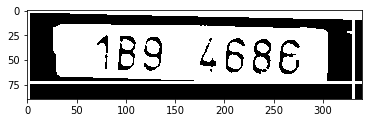

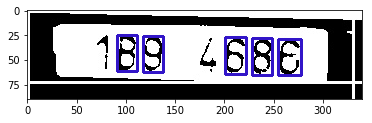

i am not saving
_----------------------------------__Starting______________________________------------------
I00056
['4', 'B', '7', '6', '1', '4', '8']
{'4': ['4_0', '4_1']}


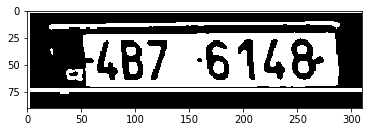

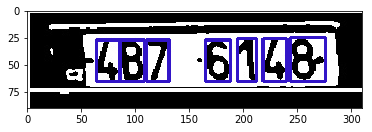

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00119
['4', 'B', '8', '2', '2', '9', '5']
{'2': ['2_0', '2_1']}


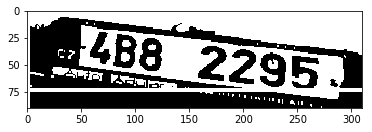

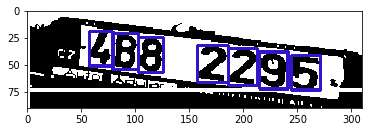

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00000
['5', 'C', '4', '8', '3', '0', '6']
{}


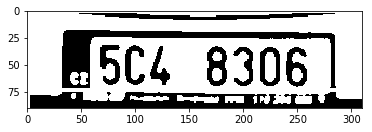

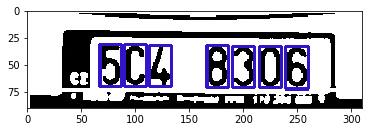

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00027
['9', 'B', '8', '8', '3', '6', '3']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


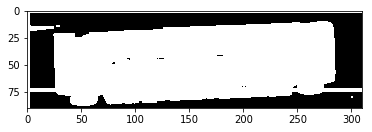

i am not saving


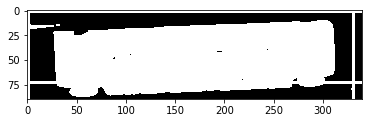

i am not saving
_----------------------------------__Starting______________________________------------------
I00006
['4', 'B', '0', '2', '4', '6', '6']
{'6': ['6_0', '6_1'], '4': ['4_0', '4_1']}


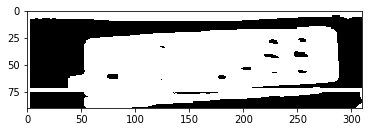

i am not saving


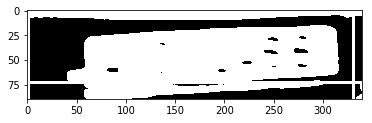

i am not saving
_----------------------------------__Starting______________________________------------------
I00133
['8', 'B', '6', '6', '5', '1', '2']
{'6': ['6_0', '6_1']}


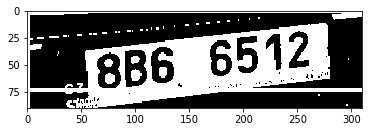

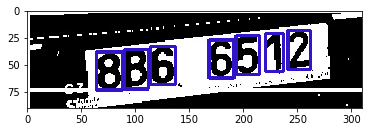

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00055
['9', 'B', '4', '6', '9', '8', '8']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


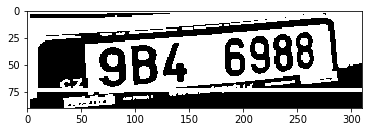

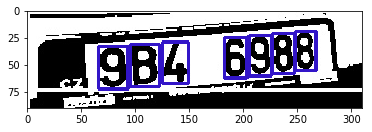

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00061
['1', 'B', 'A', '8', '3', '7', '0']
{}


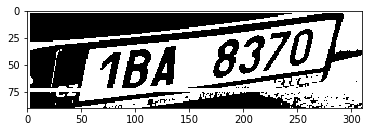

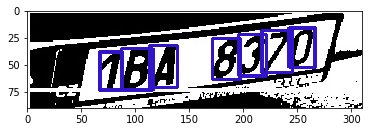

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00034
['7', 'B', '3', '2', '4', '4', '3']
{'3': ['3_0', '3_1'], '4': ['4_0', '4_1']}


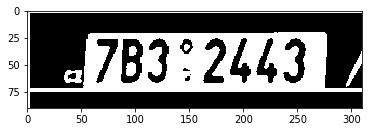

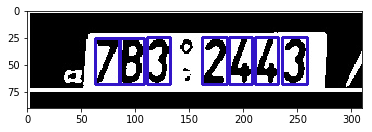

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00140
['9', 'B', '8', '6', '9', '0', '6']
{'9': ['9_0', '9_1'], '6': ['6_0', '6_1']}


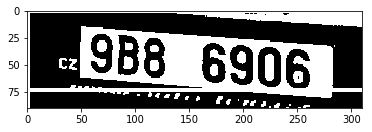

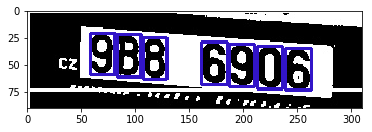

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00063
['5', 'J', '0', '4', '0', '2', '7']
{'0': ['0_0', '0_1']}


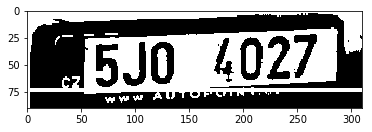

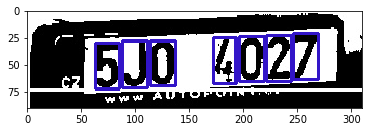

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00004
['1', 'B', 'A', '2', '9', '0', '5']
{}


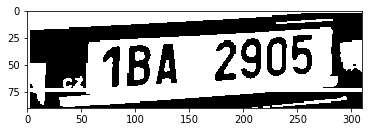

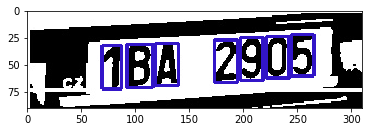

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00047
['3', 'S', 'A', '6', '4', '1', '3']
{'3': ['3_0', '3_1']}


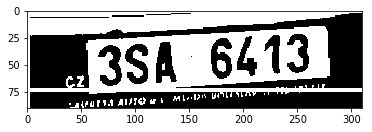

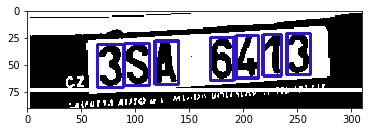

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00098
['2', 'B', '7', '5', '8', '3', '6']
{}


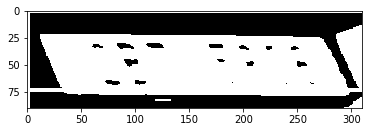

i am not saving


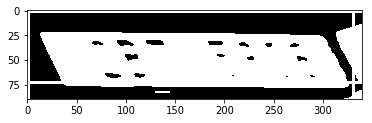

i am not saving
_----------------------------------__Starting______________________________------------------
I00054
['1', 'B', 'B', '6', '3', '3', '8']
{'3': ['3_0', '3_1'], 'B': ['B_0', 'B_1']}


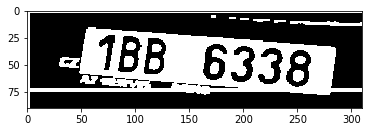

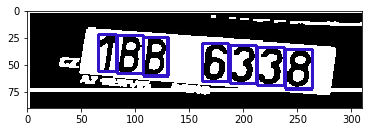

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00068
['2', 'A', 'B', '5', '8', '9', '6']
{}


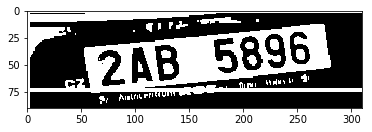

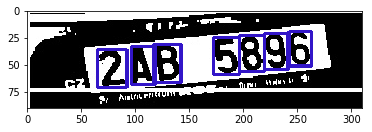

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00080
['B', 'Z', 'I', '0', '3', '4', '6']
{}


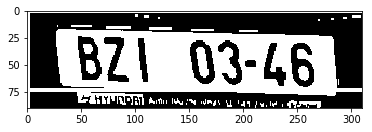

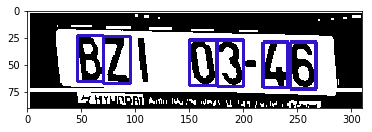

i am not saving


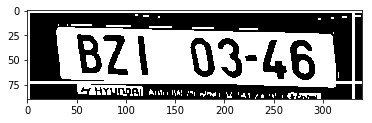

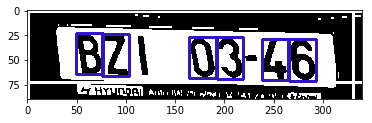

i am not saving
_----------------------------------__Starting______________________________------------------
I00002
['8', 'B', '9', '1', '6', '9', '8']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


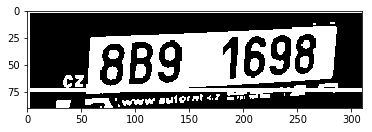

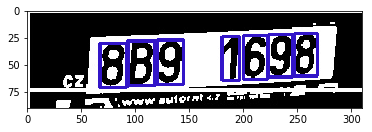

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00031
['B', '8', '5', '4', '7']
{}


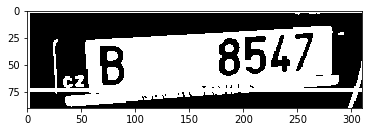

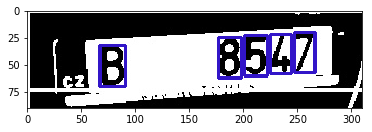

i am not saving


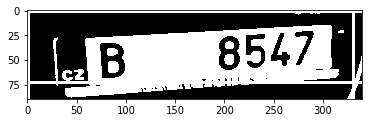

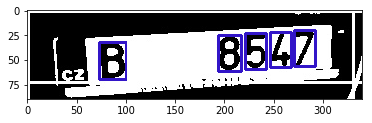

i am not saving
_----------------------------------__Starting______________________________------------------
I00068
['2', 'A', 'B', '5', '8', '9', '6']
{}


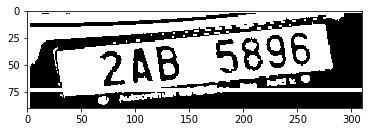

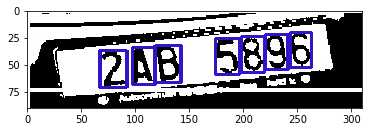

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00062
['2', 'Z', '5', '2', '6', '8', '9']
{'2': ['2_0', '2_1']}


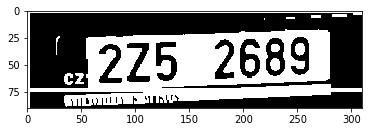

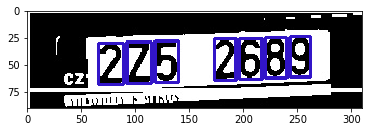

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00014
['4', 'B', '8', '3', '9', '4', '0']
{'4': ['4_0', '4_1']}


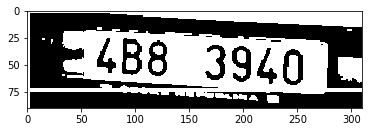

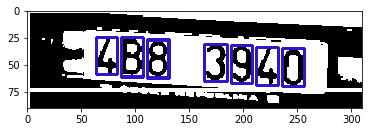

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00012
['5', 'Z', '1', '5', '0', '5', '7']
{'5': ['5_0', '5_1', '5_2']}


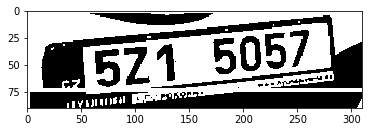

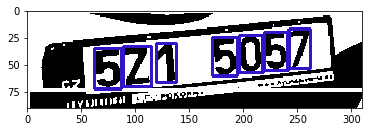

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00012
['8', 'B', '7', '0', '6', '8', '8']
{'8': ['8_0', '8_1', '8_2']}


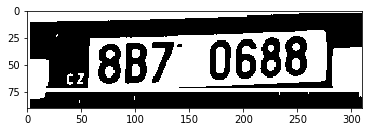

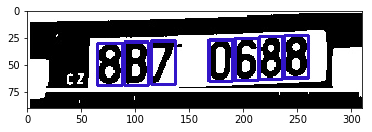

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00083
['8', 'B', '4', '7', '3', '1', '8']
{'8': ['8_0', '8_1']}


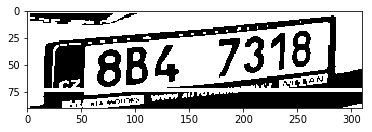

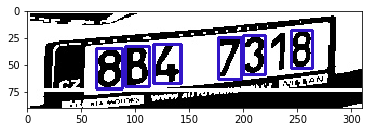

i am not saving


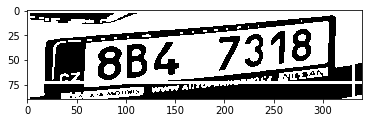

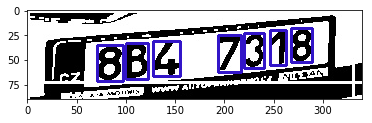

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00043
['9', 'B', '1', '3', '9', '7', '3']
{'3': ['3_0', '3_1'], '9': ['9_0', '9_1']}


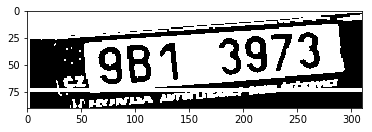

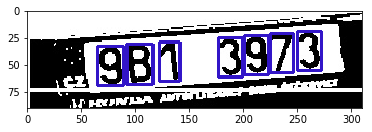

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00066
['7', 'B', '9', '4', '2', '6', '1']
{}


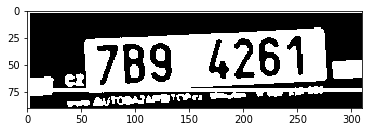

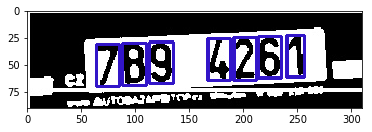

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00106
['3', 'K', '2', '9', '7', '2', '9']
{'9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


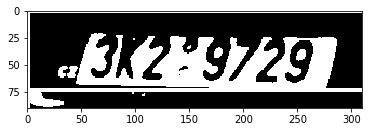

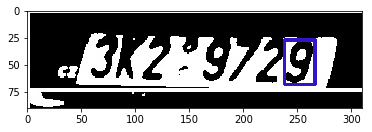

i am not saving


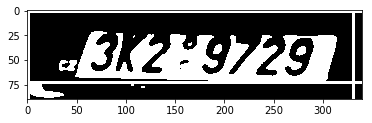

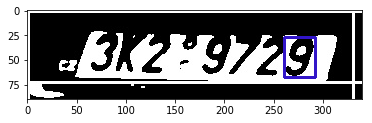

i am not saving
_----------------------------------__Starting______________________________------------------
I00040
['7', 'B', '1', '1', '6', '0', '7']
{'1': ['1_0', '1_1'], '7': ['7_0', '7_1']}


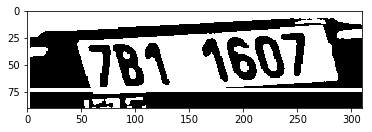

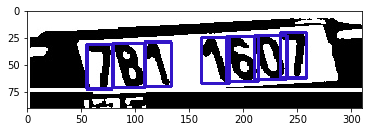

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00000
['5', 'C', '4', '8', '3', '0', '6']
{}


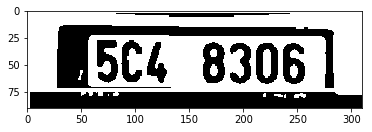

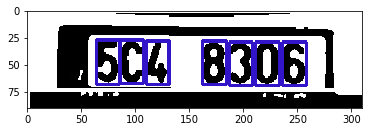

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00100
['1', 'B', '0', '5', '0', '0', '2']
{'0': ['0_0', '0_1', '0_2']}


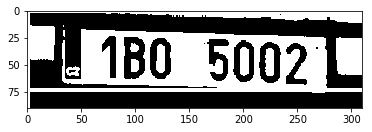

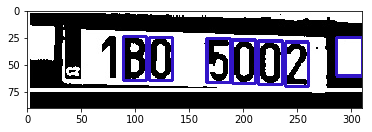

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00084
['1', 'B', 'I', '2', '1', '3', '8']
{'1': ['1_0', '1_1']}


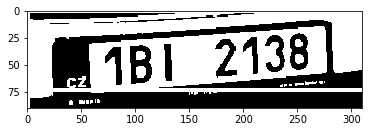

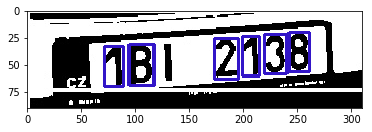

i am not saving


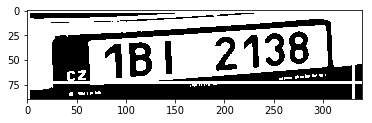

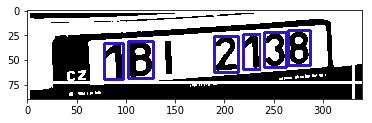

i am not saving
_----------------------------------__Starting______________________________------------------
I00010
['B', 'V', 'J', '6', '4', '1', '1']
{'1': ['1_0', '1_1']}


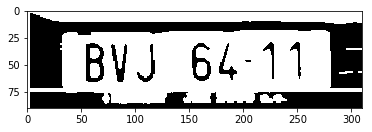

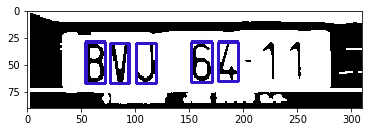

i am not saving


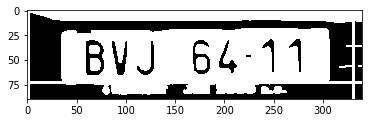

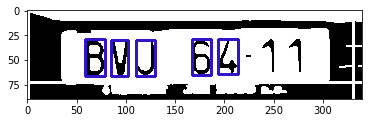

i am not saving
_----------------------------------__Starting______________________________------------------
I00002
['8', 'B', '9', '0', '1', '6', '4']
{}


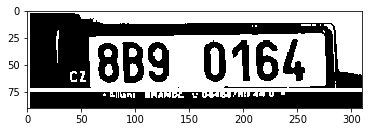

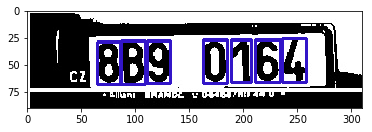

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00060
['4', 'B', '8', '3', '1', '7', '2']
{}


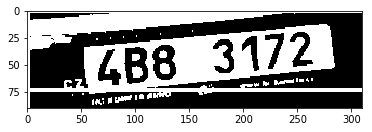

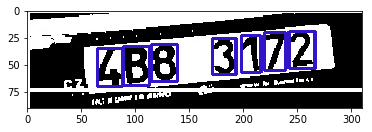

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00072
['9', 'B', '5', '9', '7', '2', '9']
{'9': ['9_0', '9_1', '9_2']}


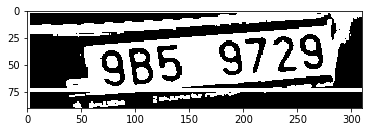

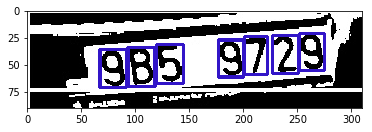

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00026
['1', 'B', 'A', '1', '1', '1', '4']
{'1': ['1_0', '1_1', '1_2', '1_3']}


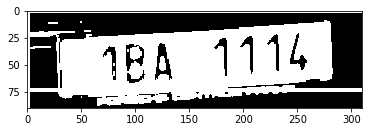

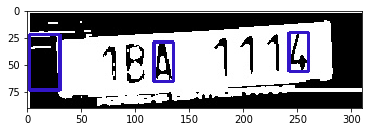

i am not saving


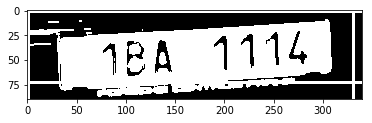

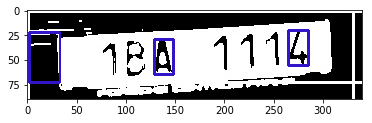

i am not saving
_----------------------------------__Starting______________________________------------------
I00071
['7', 'B', '9', '8', '4', '5', '3']
{}


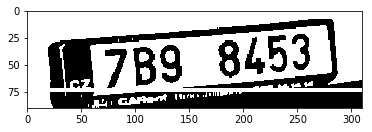

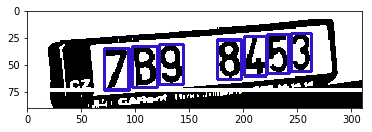

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00008
['4', 'B', '8', '2', '8', '4', '0']
{'8': ['8_0', '8_1'], '4': ['4_0', '4_1']}


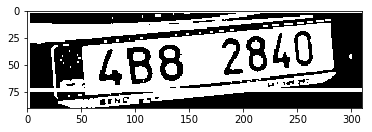

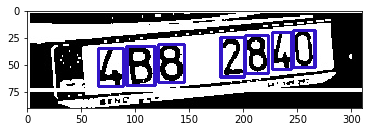

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00040
['7', 'B', '0', '0', '8', '4', '4']
{'4': ['4_0', '4_1'], '0': ['0_0', '0_1']}


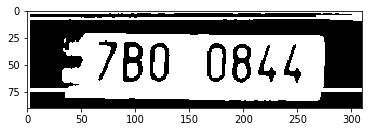

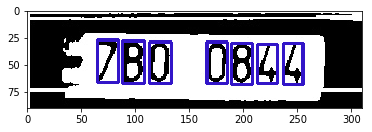

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00003
['5', 'B', '1', '1', '1', '8', '1']
{'1': ['1_0', '1_1', '1_2', '1_3']}


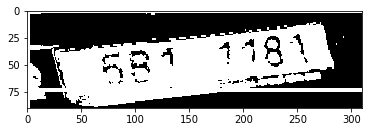

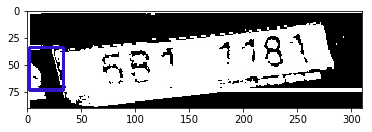

i am not saving


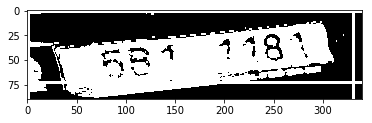

i am not saving
_----------------------------------__Starting______________________________------------------
I00107
['4', 'B', '9', '6', '9', '1', '4']
{'9': ['9_0', '9_1'], '4': ['4_0', '4_1']}


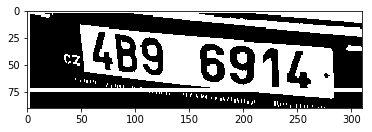

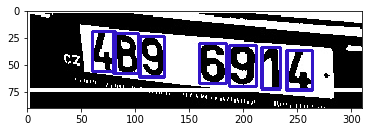

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00086
['7', 'B', '1', '1', '1', '2', '3']
{'1': ['1_0', '1_1', '1_2']}


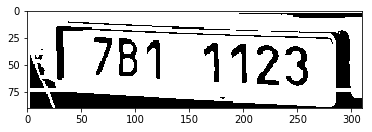

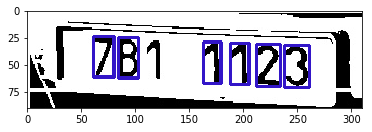

i am not saving


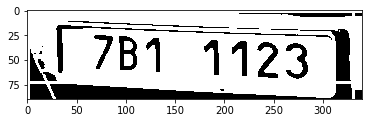

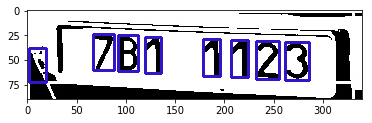

i am not saving
_----------------------------------__Starting______________________________------------------
I00063
['6', 'B', '8', '8', '3', '0', '4']
{'8': ['8_0', '8_1']}


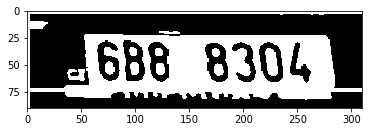

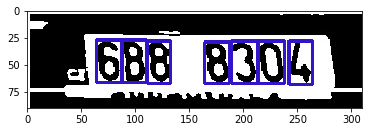

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00066
['3', 'B', '7', '5', '7', '6', '3']
{'3': ['3_0', '3_1'], '7': ['7_0', '7_1']}


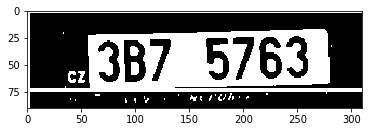

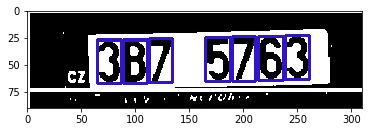

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00079
['8', 'T', '7', '7', '4', '6', '2']
{'7': ['7_0', '7_1']}


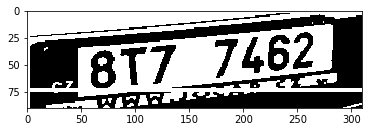

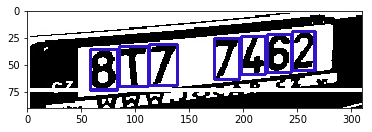

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00000
['4', 'M', '2', '6', '7', '7', '6']
{'6': ['6_0', '6_1'], '7': ['7_0', '7_1']}


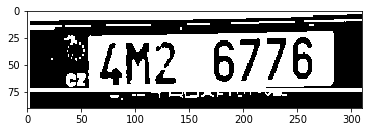

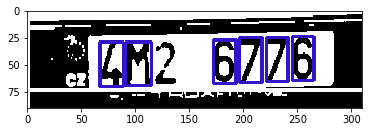

i am not saving


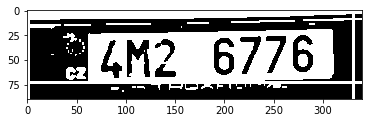

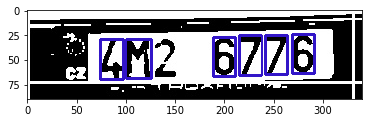

i am not saving
_----------------------------------__Starting______________________________------------------
I00068
['2', 'B', '7', '4', '2', '8', '9']
{'2': ['2_0', '2_1']}


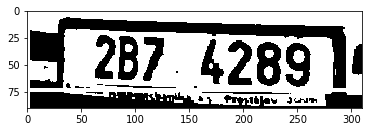

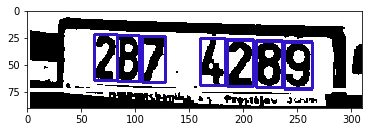

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00053
['6', 'B', '8', '9', '3', '5', '8']
{'8': ['8_0', '8_1']}


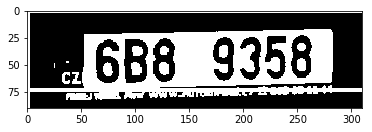

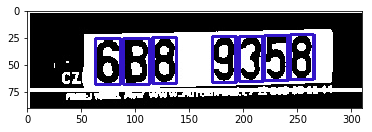

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00002
['8', 'B', '9', '1', '6', '9', '8']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


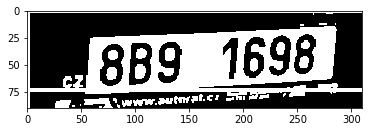

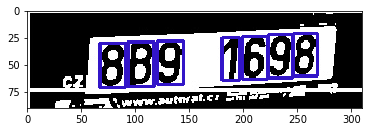

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00001
['6', 'B', '9', '4', '5', '5', '8']
{'5': ['5_0', '5_1']}


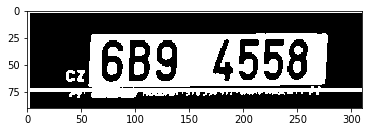

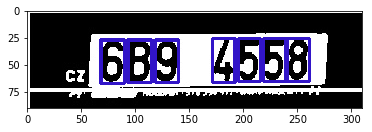

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00016
['7', 'B', '6', '6', '6', '5', '7']
{'7': ['7_0', '7_1'], '6': ['6_0', '6_1', '6_2']}


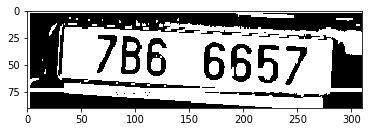

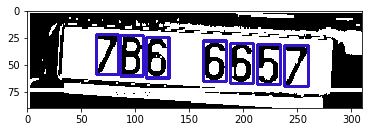

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00103
['B', 'Z', 'L', '5', '6', '8', '5']
{'5': ['5_0', '5_1']}


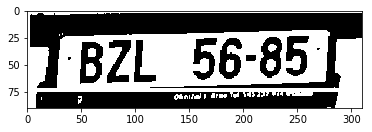

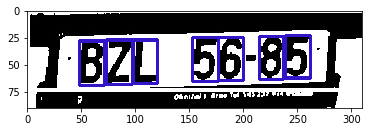

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00010
['8', 'B', '0', '2', '1', '7', '3']
{}


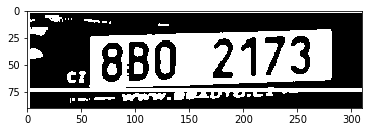

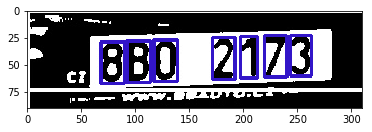

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00139
['5', 'H', '6', '8', '5', '0', '4']
{'5': ['5_0', '5_1']}


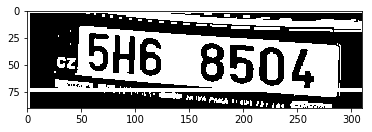

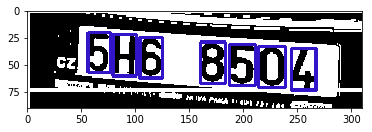

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00117
['4', 'B', '6', '4', '2', '6', '1']
{'6': ['6_0', '6_1'], '4': ['4_0', '4_1']}


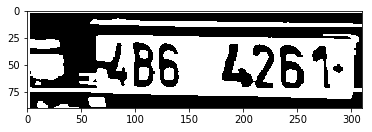

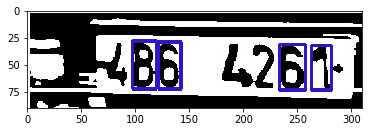

i am not saving


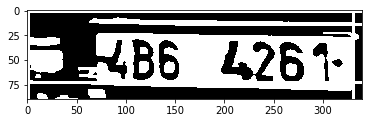

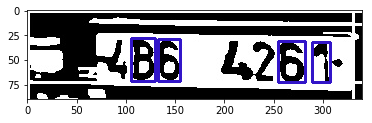

i am not saving
_----------------------------------__Starting______________________________------------------
I00134
['1', 'B', 'B', '7', '3', '2', '5']
{'B': ['B_0', 'B_1']}


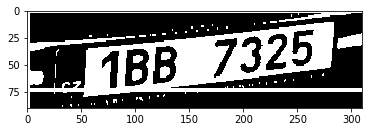

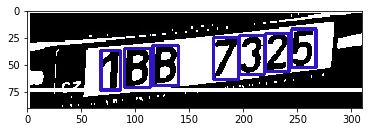

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00013
['1', 'B', 'C', '5', '1', '9', '1']
{'1': ['1_0', '1_1', '1_2']}


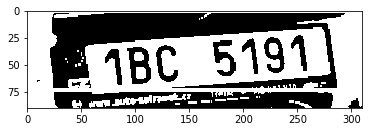

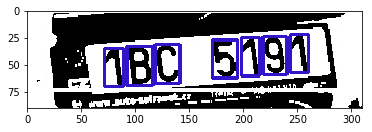

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00043
['8', 'B', '1', '0', '1', '6', '2']
{'1': ['1_0', '1_1']}


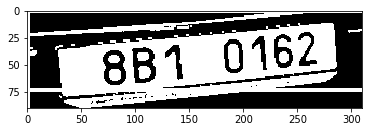

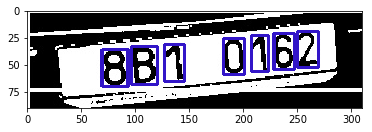

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00016
['3', 'B', '8', '8', '7', '2', '9']
{'8': ['8_0', '8_1']}


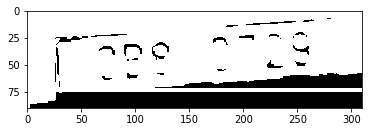

i am not saving


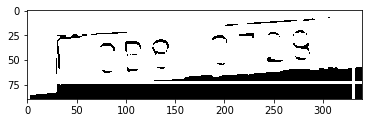

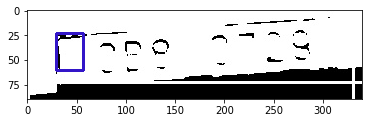

i am not saving
_----------------------------------__Starting______________________________------------------
I00025
['9', 'B', '3', '0', '1', '3', '0']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


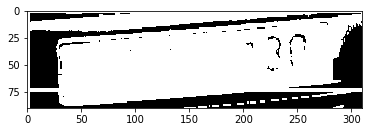

i am not saving


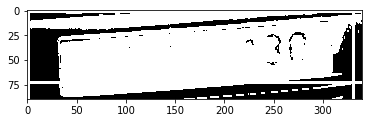

i am not saving
_----------------------------------__Starting______________________________------------------
I00130
['7', 'B', '5', '9', '0', '6', '6']
{'6': ['6_0', '6_1']}


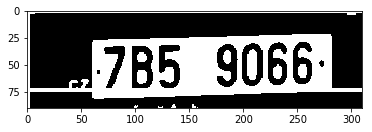

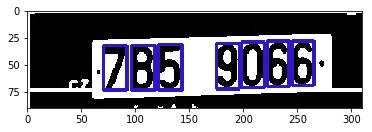

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00057
['6', 'B', '2', '6', '0', '5', '0']
{'6': ['6_0', '6_1'], '0': ['0_0', '0_1']}


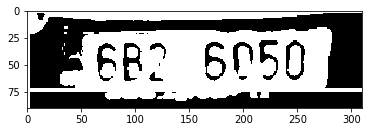

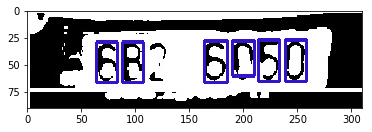

i am not saving


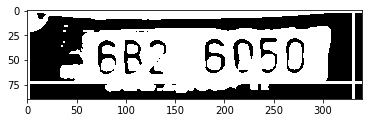

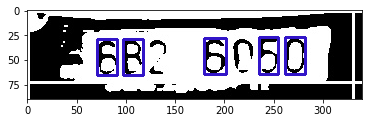

i am not saving
_----------------------------------__Starting______________________________------------------
I00043
['7', 'B', '2', '9', '4', '3', '0']
{}


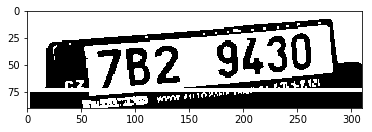

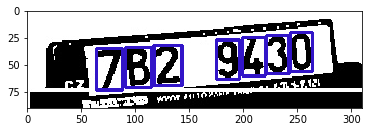

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00017
['7', 'B', '2', '7', '2', '5', '4']
{'2': ['2_0', '2_1'], '7': ['7_0', '7_1']}


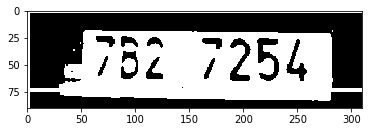

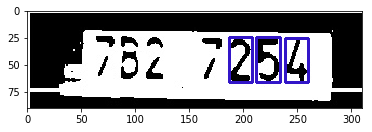

i am not saving


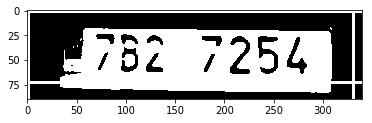

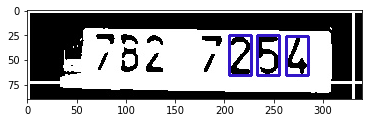

i am not saving
_----------------------------------__Starting______________________________------------------
I00042
['9', 'B', '5', '4', '8', '1', '7']
{}


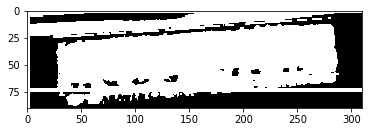

i am not saving


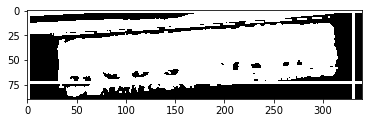

i am not saving
_----------------------------------__Starting______________________________------------------
I00025
['7', 'B', '0', '8', '1', '9', '9']
{'9': ['9_0', '9_1']}


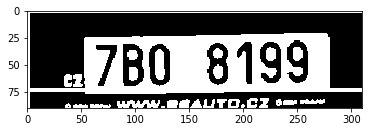

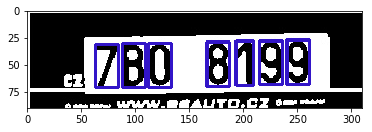

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00074
['5', 'B', '1', '1', '3', '0', '0']
{'0': ['0_0', '0_1'], '1': ['1_0', '1_1']}


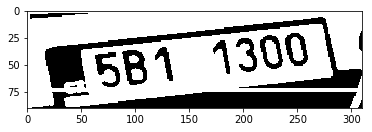

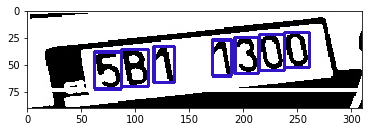

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00045
['2', 'Z', '9', '6', '4', '1', '8']
{}


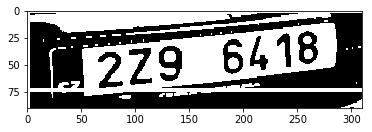

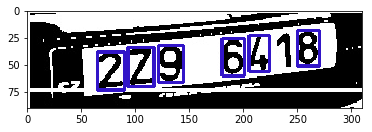

i am not saving


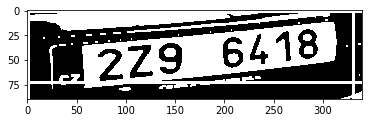

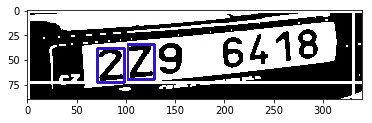

i am not saving
_----------------------------------__Starting______________________________------------------
I00091
['5', 'B', '2', '4', '5', '4', '6']
{'4': ['4_0', '4_1'], '5': ['5_0', '5_1']}


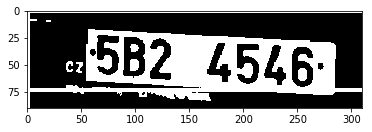

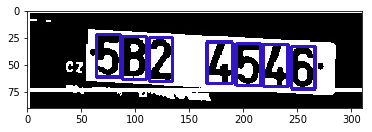

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00012
['9', 'B', '6', '0', '4', '6', '4']
{'6': ['6_0', '6_1'], '4': ['4_0', '4_1']}


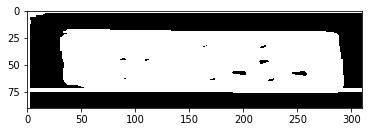

i am not saving


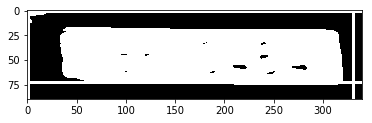

i am not saving
_----------------------------------__Starting______________________________------------------
I00047
['9', 'B', '8', '4', '7', '5', '9']
{'9': ['9_0', '9_1']}


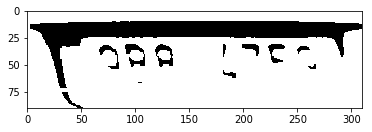

i am not saving


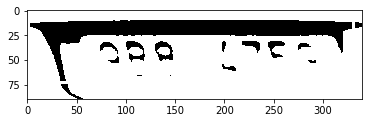

i am not saving
_----------------------------------__Starting______________________________------------------
I00039
['2', 'B', '5', '2', '7', '3', '9']
{'2': ['2_0', '2_1']}


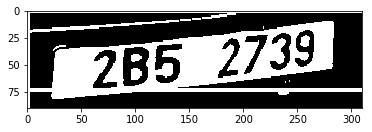

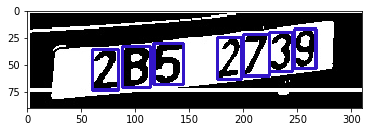

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00012
['B', 'V', 'J', '6', '4', '1', '1']
{'1': ['1_0', '1_1']}


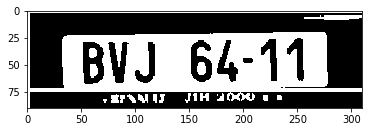

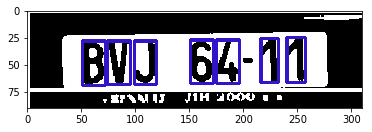

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00011
['3', 'M', '4', '6', '9', '1', '8']
{}


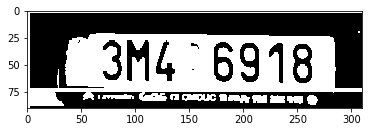

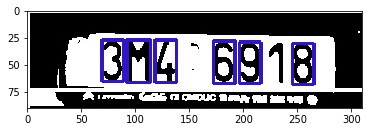

i am not saving


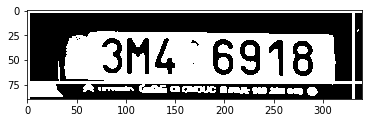

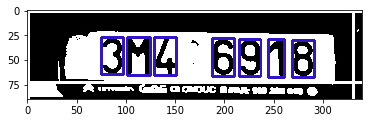

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00016
['4', 'M', '9', '8', '6', '8', '1']
{'8': ['8_0', '8_1']}


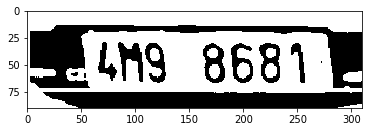

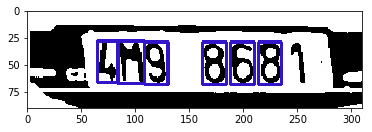

i am not saving


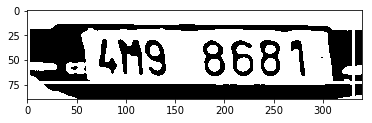

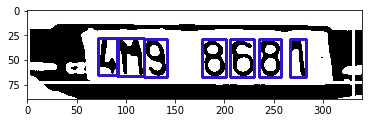

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00068
['2', 'B', '7', '4', '2', '8', '9']
{'2': ['2_0', '2_1']}


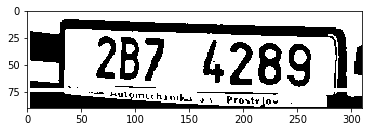

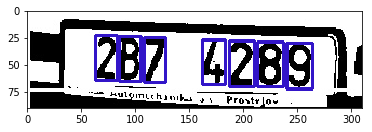

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00049
['6', 'B', '5', '0', '4', '3', '0']
{'0': ['0_0', '0_1']}


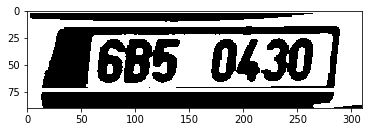

i am not saving


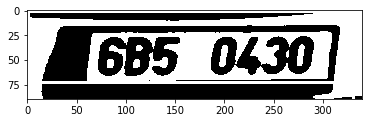

i am not saving
_----------------------------------__Starting______________________________------------------
I00105
['7', 'B', '3', '5', '4', '3', '8']
{'3': ['3_0', '3_1']}


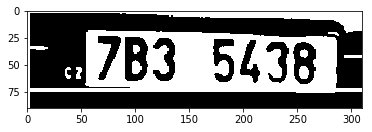

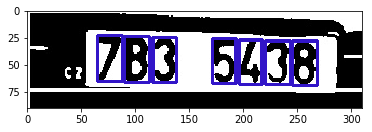

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00023
['7', 'B', '1', '2', '1', '5', '1']
{'1': ['1_0', '1_1', '1_2']}


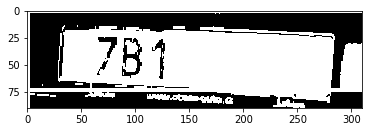

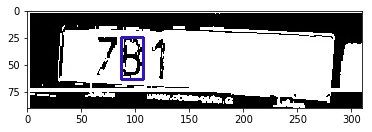

i am not saving


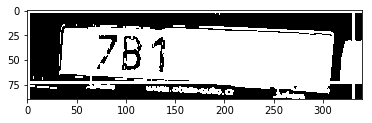

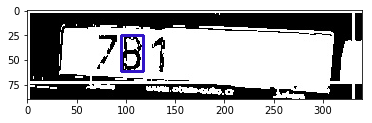

i am not saving
_----------------------------------__Starting______________________________------------------
I00004
['1', 'B', 'A', '2', '9', '0', '5']
{}


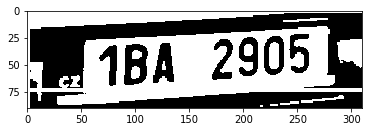

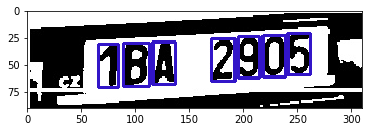

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00131
['7', 'B', '1', '4', '0', '9', '5']
{}


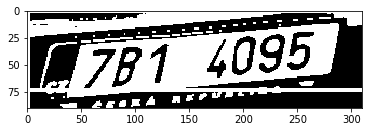

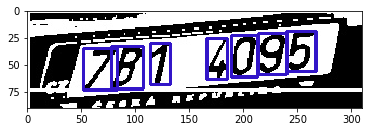

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00081
['9', 'B', '4', '5', '1', '9', '3']
{'9': ['9_0', '9_1']}


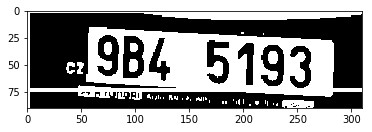

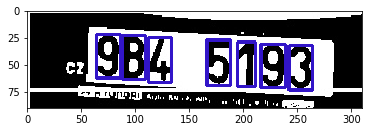

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00083
['8', 'B', '4', '7', '3', '1', '8']
{'8': ['8_0', '8_1']}


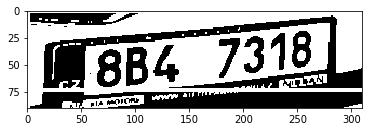

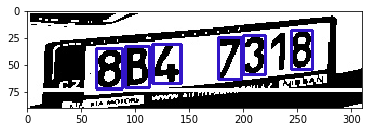

i am not saving


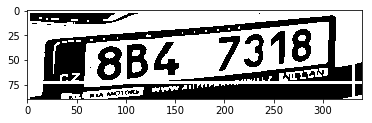

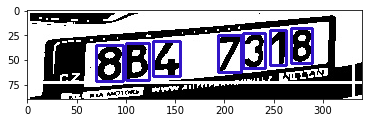

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00044
['7', 'B', '6', '1', '6', '2', '3']
{'6': ['6_0', '6_1']}


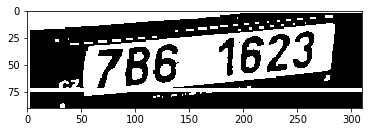

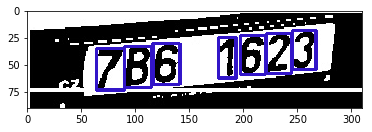

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00049
['1', 'Z', '3', '5', '2', '0', '6']
{}


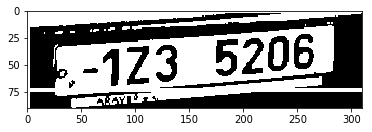

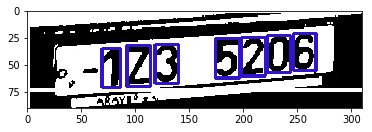

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['9', 'B', '6', '5', '4', '3', '1']
{}


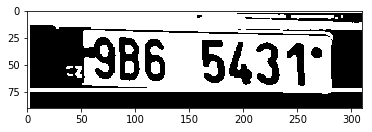

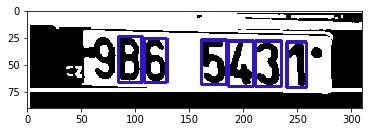

i am not saving


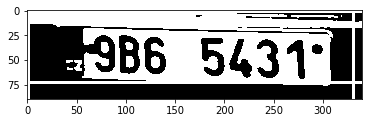

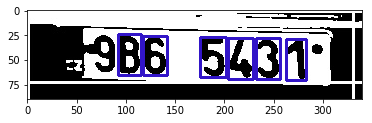

i am not saving
_----------------------------------__Starting______________________________------------------
I00051
['1', 'B', '0', '7', '8', '4', '6']
{}


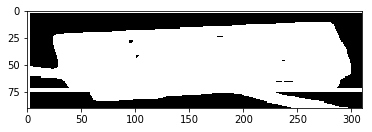

i am not saving


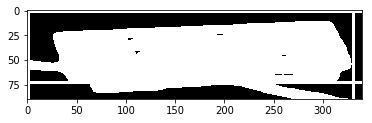

i am not saving
_----------------------------------__Starting______________________________------------------
I00074
['5', 'B', '7', '7', '3', '7', '9']
{'7': ['7_0', '7_1', '7_2']}


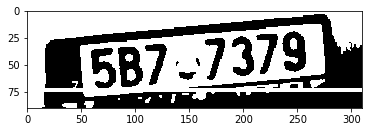

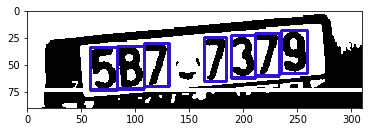

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00004
['8', 'T', '4', '3', '4', '1', '8']
{'8': ['8_0', '8_1'], '4': ['4_0', '4_1']}


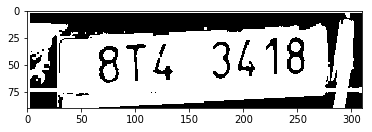

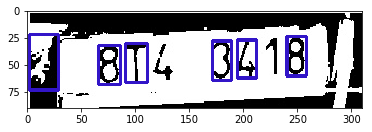

i am not saving


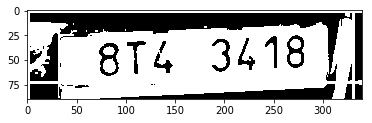

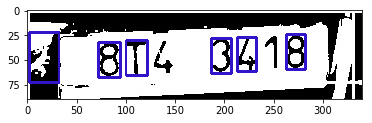

i am not saving
_----------------------------------__Starting______________________________------------------
I00003
['1', 'B', 'C', '5', '1', '3', '8']
{'1': ['1_0', '1_1']}


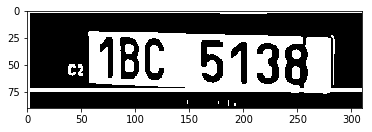

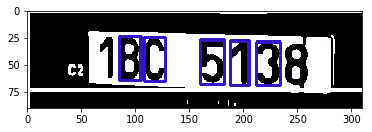

i am not saving


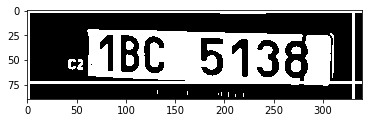

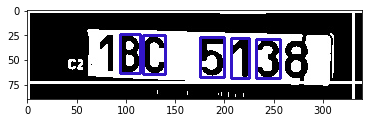

i am not saving
_----------------------------------__Starting______________________________------------------
I00053
['9', 'B', '7', '8', '7', '0', '1']
{'7': ['7_0', '7_1']}


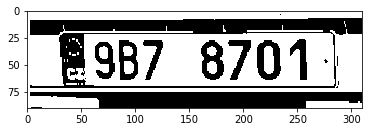

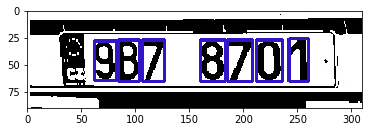

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00061
['1', 'B', 'I', '1', '7', '1', '0']
{'1': ['1_0', '1_1', '1_2']}


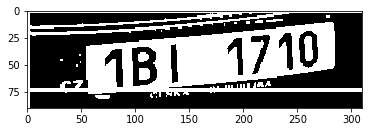

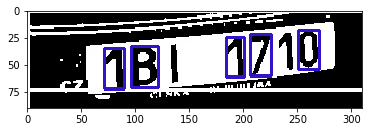

i am not saving


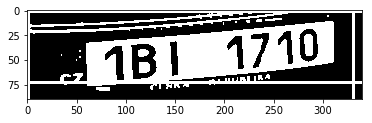

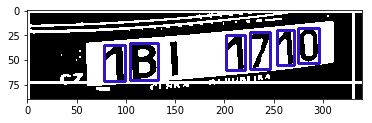

i am not saving
_----------------------------------__Starting______________________________------------------
I00015
['9', 'B', '3', '3', '2', '9', '7']
{'3': ['3_0', '3_1'], '9': ['9_0', '9_1']}


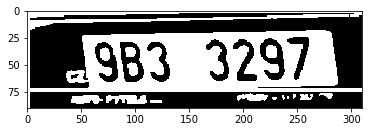

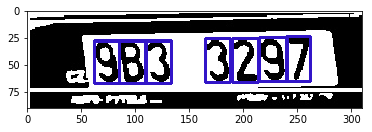

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00077
['4', 'B', '6', '0', '6', '2', '0']
{'6': ['6_0', '6_1'], '0': ['0_0', '0_1']}


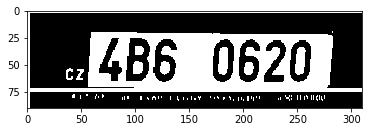

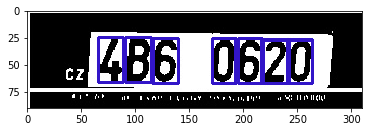

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00066
['8', 'B', '6', '0', '5', '5', '2']
{'5': ['5_0', '5_1']}


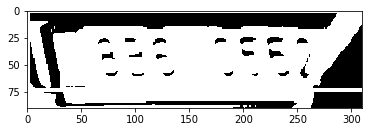

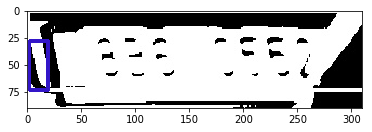

i am not saving


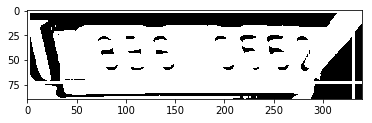

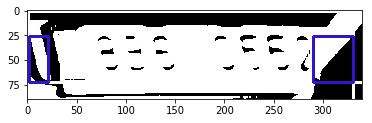

i am not saving
_----------------------------------__Starting______________________________------------------
I00072
['2', 'A', 'N', '1', '9', '9', '1']
{'9': ['9_0', '9_1'], '1': ['1_0', '1_1']}


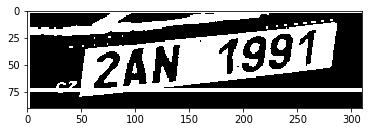

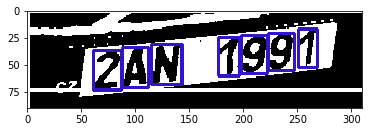

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00052
['7', 'B', '5', '8', '3', '0', '7']
{'7': ['7_0', '7_1']}


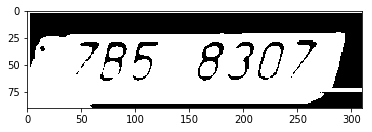

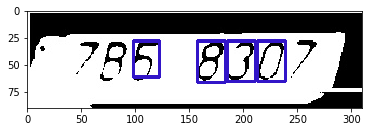

i am not saving


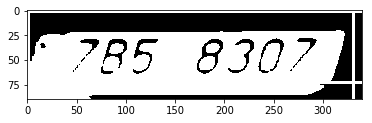

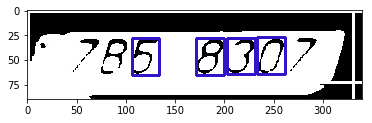

i am not saving
_----------------------------------__Starting______________________________------------------
I00071
['7', 'B', '9', '8', '4', '5', '3']
{}


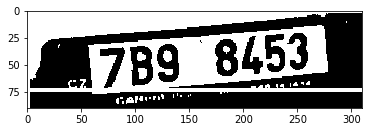

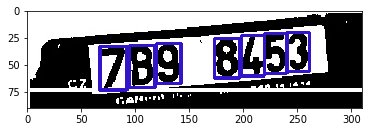

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00024
['4', 'A', 'T', '7', '9', '6', '2']
{}


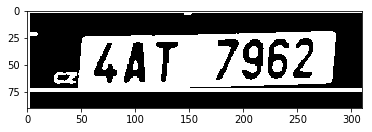

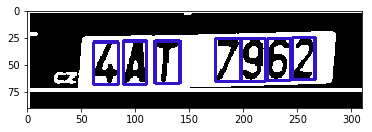

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00045
['2', 'Z', '9', '6', '4', '1', '8']
{}


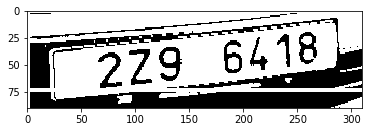

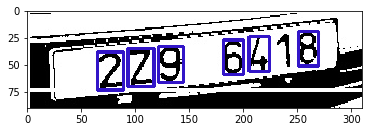

i am not saving


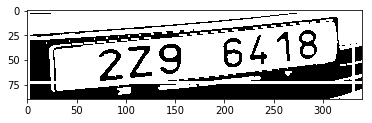

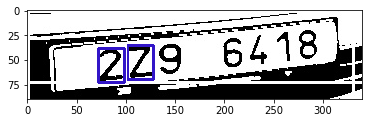

i am not saving
_----------------------------------__Starting______________________________------------------
I00002
['8', 'B', '9', '0', '1', '6', '4']
{}


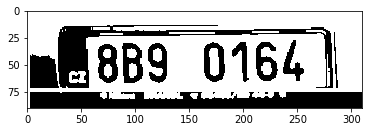

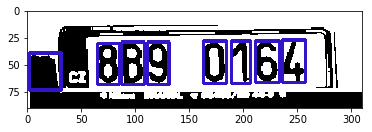

i am not saving


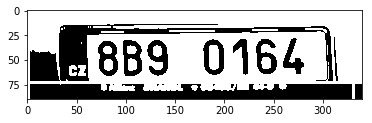

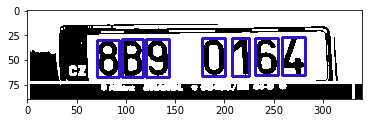

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00025
['9', 'B', '3', '0', '1', '3', '0']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


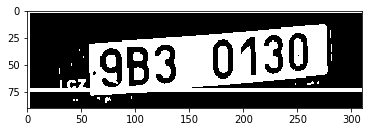

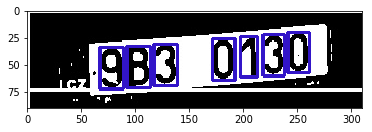

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00121
['7', 'B', '7', '2', '7', '2', '9']
{'7': ['7_0', '7_1', '7_2'], '2': ['2_0', '2_1']}


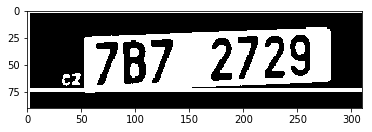

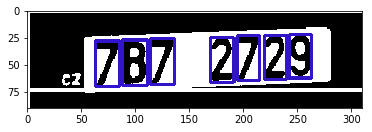

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00000
['4', 'M', '2', '6', '7', '7', '6']
{'6': ['6_0', '6_1'], '7': ['7_0', '7_1']}


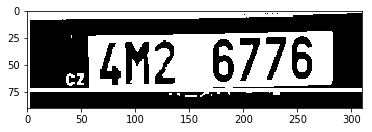

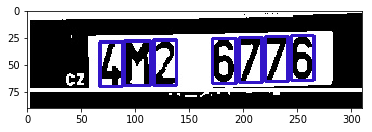

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00054
['B', 'Z', 'J', '2', '9', '0', '9']
{'9': ['9_0', '9_1']}


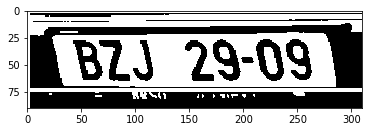

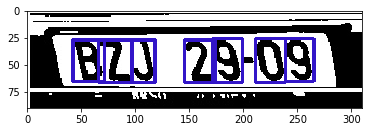

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00092
['9', 'B', '2', '9', '2', '7', '4']
{'9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


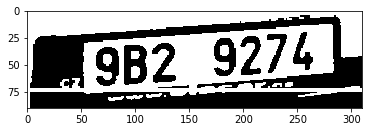

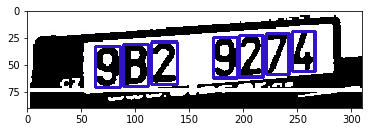

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00060
['4', 'A', 'Z', '3', '8', '0', '2']
{}


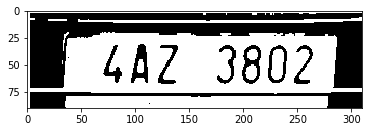

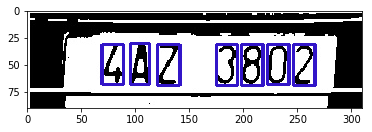

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00048
['1', 'B', 'B', '8', '8', '5', '1']
{'B': ['B_0', 'B_1'], '8': ['8_0', '8_1'], '1': ['1_0', '1_1']}


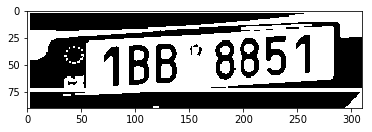

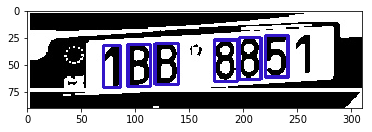

i am not saving


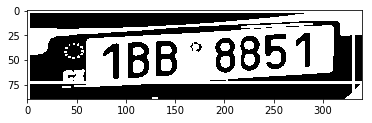

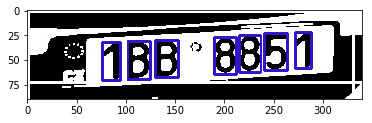

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00119
['4', 'B', '8', '2', '2', '9', '5']
{'2': ['2_0', '2_1']}


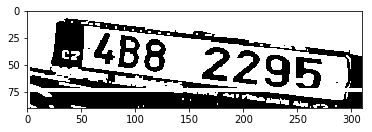

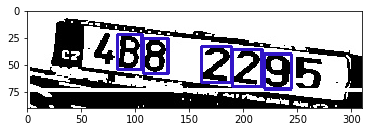

i am not saving


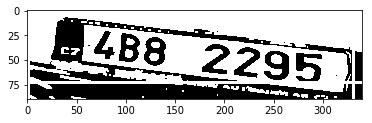

i am not saving
_----------------------------------__Starting______________________________------------------
I00077
['5', 'B', '8', '2', '9', '0', '8']
{'8': ['8_0', '8_1']}


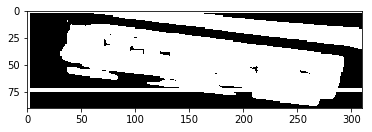

i am not saving


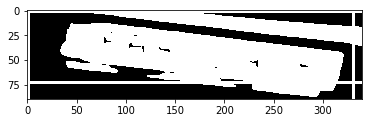

i am not saving
_----------------------------------__Starting______________________________------------------
I00002
['4', 'B', '1', '0', '0', '3', '6']
{'0': ['0_0', '0_1']}


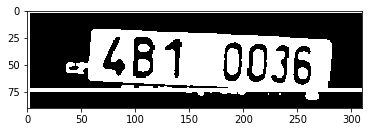

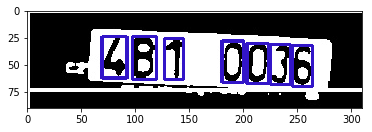

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00097
['9', 'B', '9', '8', '7', '7', '7']
{'9': ['9_0', '9_1'], '7': ['7_0', '7_1', '7_2']}


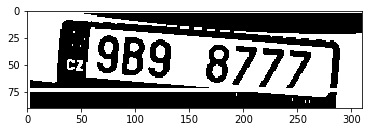

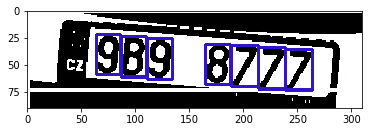

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00071
['2', 'A', 'X', '4', '9', '3', '8']
{}


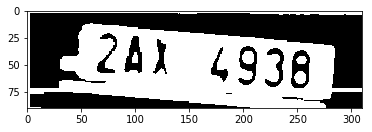

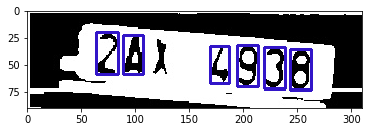

i am not saving


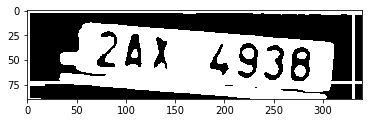

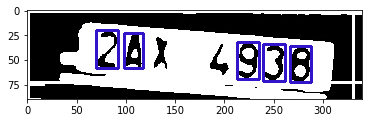

i am not saving
_----------------------------------__Starting______________________________------------------
I00087
['2', 'B', '7', '6', '6', '8', '6']
{'6': ['6_0', '6_1', '6_2']}


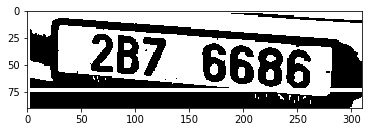

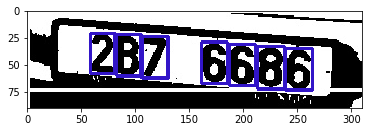

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00104
['2', 'E', '6', '7', '1', '7', '5']
{'7': ['7_0', '7_1']}


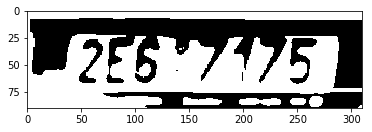

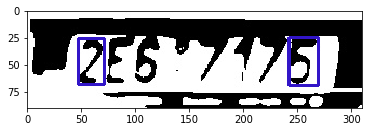

i am not saving


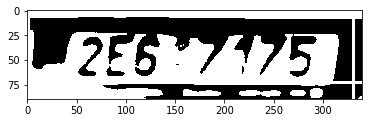

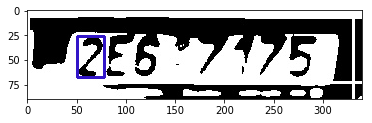

i am not saving
_----------------------------------__Starting______________________________------------------
I00110
['8', 'B', '8', '6', '2', '6', '6']
{'6': ['6_0', '6_1', '6_2'], '8': ['8_0', '8_1']}


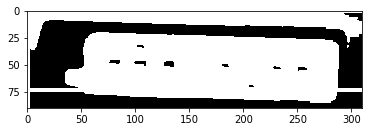

i am not saving


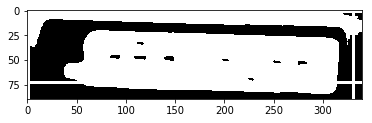

i am not saving
_----------------------------------__Starting______________________________------------------
I00089
['1', 'E', '5', '9', '7', '0', '6']
{}


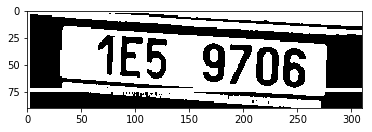

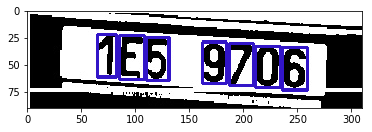

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['Z', 'N', 'E', '2', '3', '9', '3']
{'3': ['3_0', '3_1']}


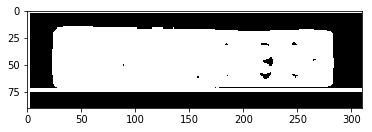

i am not saving


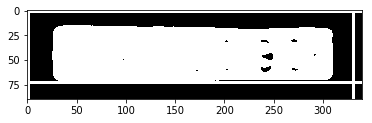

i am not saving
_----------------------------------__Starting______________________________------------------
I00058
['8', 'B', '6', '4', '7', '0', '2']
{}


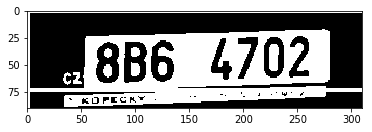

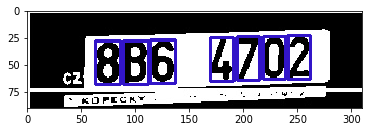

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00060
['4', 'B', '8', '3', '1', '7', '2']
{}


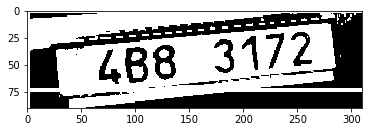

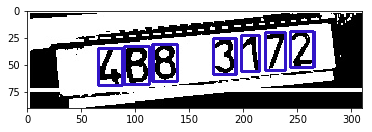

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00049
['6', 'B', '5', '0', '4', '3', '0']
{'0': ['0_0', '0_1']}


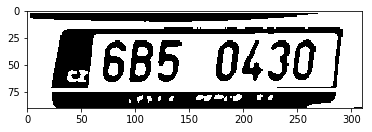

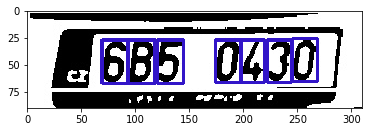

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00032
['7', 'B', '1', '1', '8', '5', '9']
{'1': ['1_0', '1_1']}


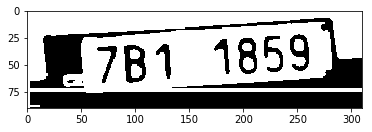

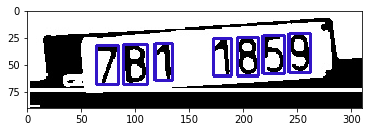

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00070
['4', 'B', '8', '4', '4', '8', '9']
{'4': ['4_0', '4_1', '4_2'], '8': ['8_0', '8_1']}


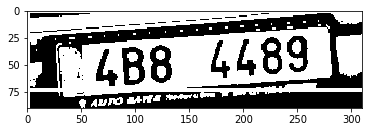

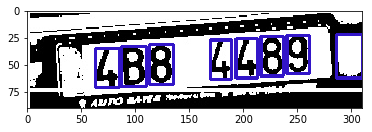

i am not saving


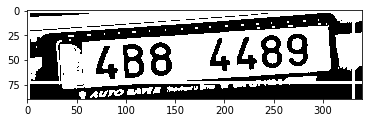

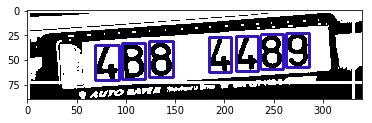

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00045
['2', 'B', '8', '9', '9', '2', '8']
{'8': ['8_0', '8_1'], '9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


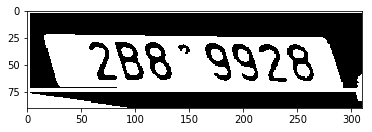

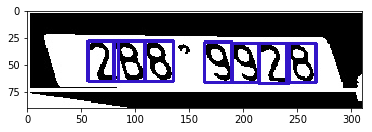

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00020
['1', 'B', '8', '7', '8', '1', '9']
{'1': ['1_0', '1_1'], '8': ['8_0', '8_1']}


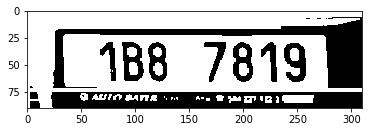

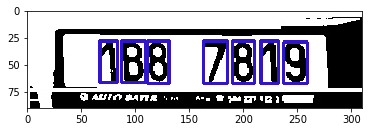

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00006
['8', 'B', '4', '6', '8', '5', '1']
{'8': ['8_0', '8_1']}


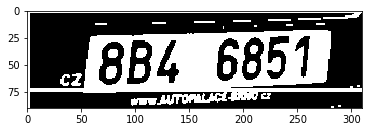

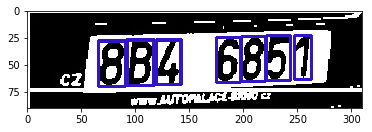

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['1', 'B', '7', '6', '4', '6', '2']
{'6': ['6_0', '6_1']}


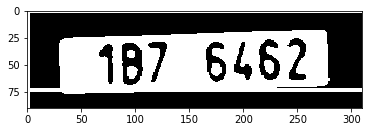

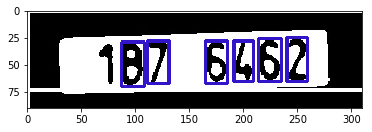

i am not saving


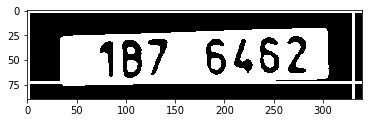

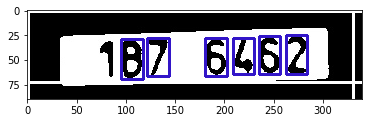

i am not saving
_----------------------------------__Starting______________________________------------------
I00048
['4', 'A', 'F', '9', '5', '5', '3']
{'5': ['5_0', '5_1']}


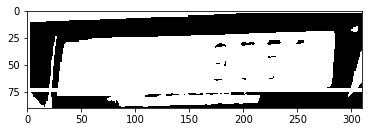

i am not saving


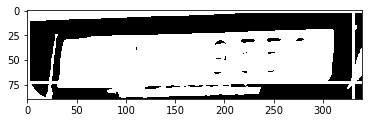

i am not saving
_----------------------------------__Starting______________________________------------------
I00077
['4', 'B', '6', '0', '6', '2', '0']
{'6': ['6_0', '6_1'], '0': ['0_0', '0_1']}


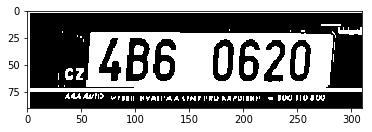

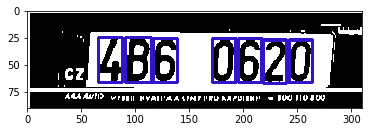

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00040
['7', 'B', '0', '0', '8', '4', '4']
{'4': ['4_0', '4_1'], '0': ['0_0', '0_1']}


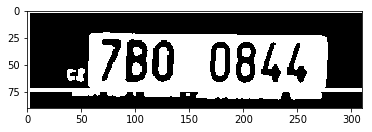

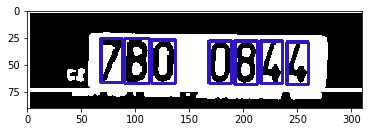

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00079
['8', 'T', '7', '7', '4', '6', '2']
{'7': ['7_0', '7_1']}


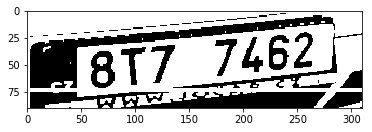

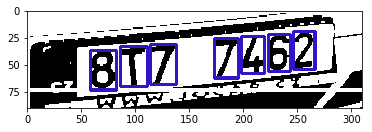

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00064
['7', 'B', '6', '5', '5', '8', '5']
{'5': ['5_0', '5_1', '5_2']}


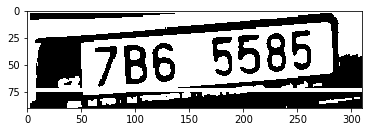

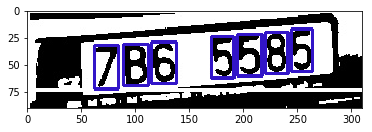

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00023
['7', 'B', '1', '2', '1', '5', '1']
{'1': ['1_0', '1_1', '1_2']}


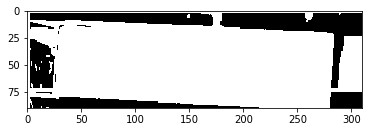

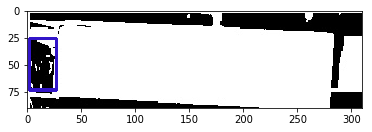

i am not saving


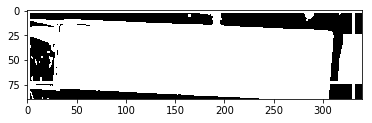

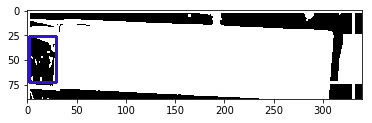

i am not saving
_----------------------------------__Starting______________________________------------------
I00018
['B', 'Z', 'H', '8', '3', '8', '9']
{'8': ['8_0', '8_1']}


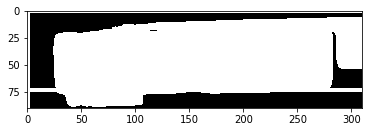

i am not saving


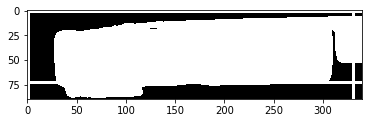

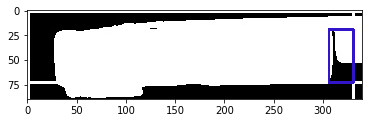

i am not saving
_----------------------------------__Starting______________________________------------------
I00033
['1', 'B', '3', '7', '2', '0', '8']
{}


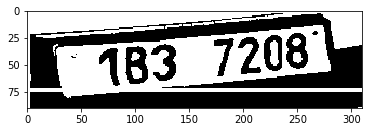

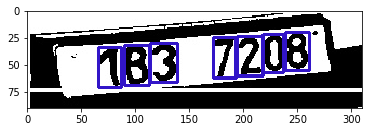

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00016
['3', 'B', '8', '8', '7', '2', '9']
{'8': ['8_0', '8_1']}


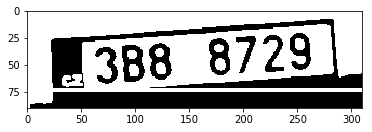

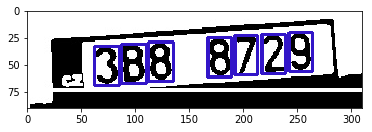

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00063
['2', 'B', '4', '5', '2', '7', '0']
{'2': ['2_0', '2_1']}


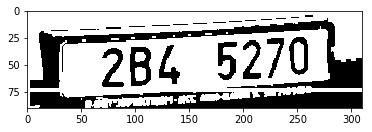

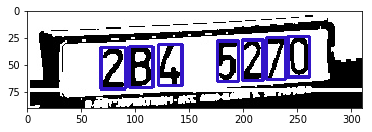

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00010
['F', 'M', 'R', '4', '4', '3', '7']
{'4': ['4_0', '4_1']}


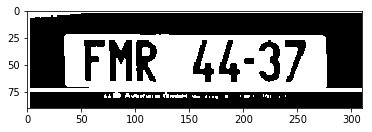

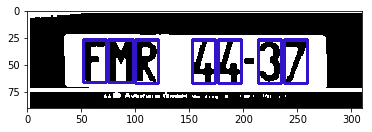

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00008
['2', 'B', '2', '0', '1', '7', '4']
{'2': ['2_0', '2_1']}


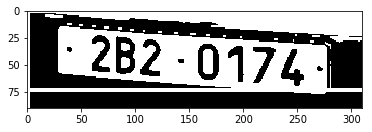

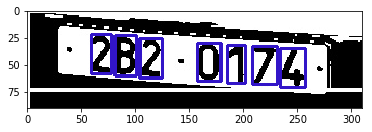

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00096
['7', 'B', '7', '6', '6', '0', '0']
{'0': ['0_0', '0_1'], '7': ['7_0', '7_1'], '6': ['6_0', '6_1']}


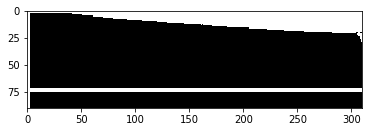

i am not saving


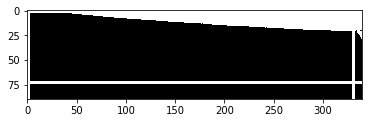

i am not saving
_----------------------------------__Starting______________________________------------------
I00067
['5', 'B', '1', '1', '1', '4', '9']
{'1': ['1_0', '1_1', '1_2']}


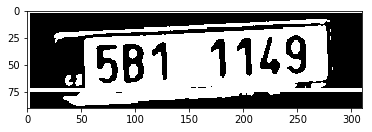

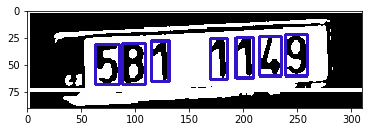

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00131
['7', 'B', '1', '4', '0', '9', '5']
{}


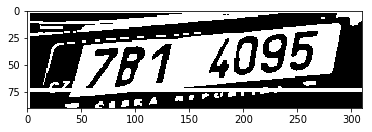

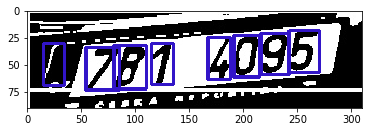

i am not saving


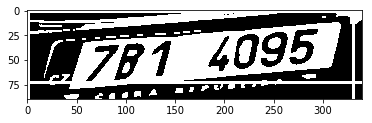

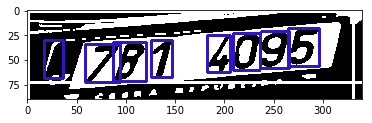

i am not saving
_----------------------------------__Starting______________________________------------------
I00005
['8', 'B', '9', '0', '1', '6', '4']
{}


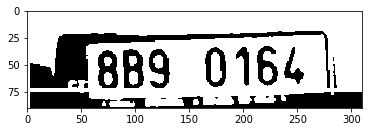

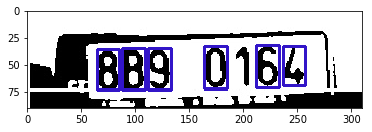

i am not saving


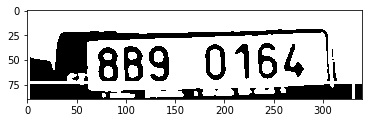

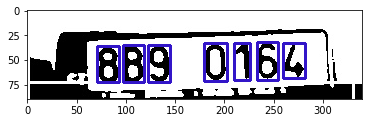

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00065
['9', 'B', '9', '1', '4', '2', '0']
{'9': ['9_0', '9_1']}


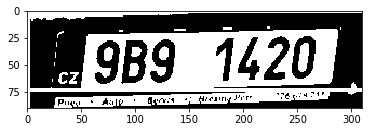

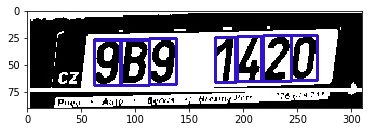

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00069
['9', 'B', '6', '4', '0', '6', '4']
{'6': ['6_0', '6_1'], '4': ['4_0', '4_1']}


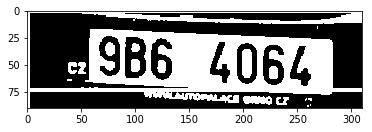

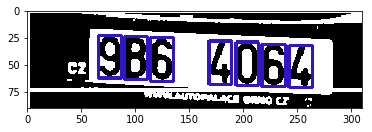

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00035
['2', 'B', '4', '6', '1', '7', '5']
{}


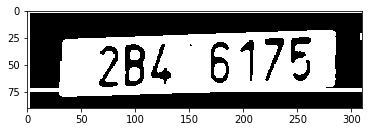

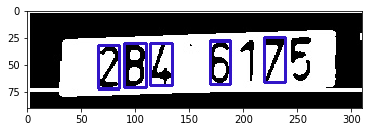

i am not saving


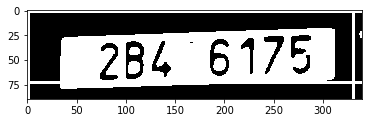

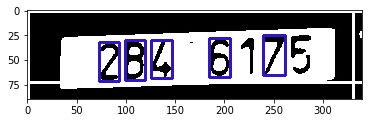

i am not saving
_----------------------------------__Starting______________________________------------------
I00032
['7', 'B', '3', '1', '5', '0', '5']
{'5': ['5_0', '5_1']}


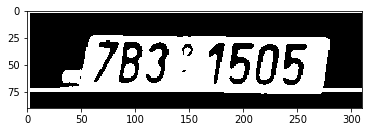

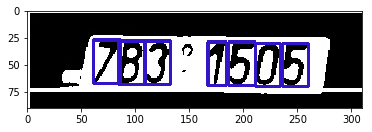

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00014
['1', 'B', 'C', '0', '5', '2', '5']
{'5': ['5_0', '5_1']}


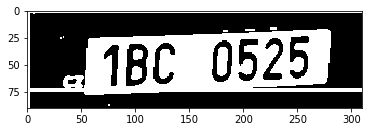

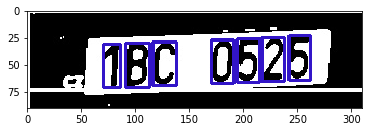

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00066
['7', 'B', '9', '4', '2', '6', '1']
{}


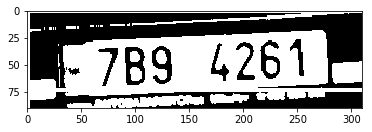

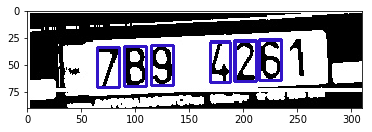

i am not saving


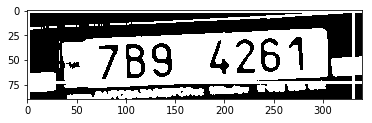

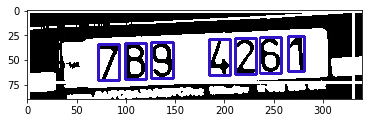

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00058
['7', 'B', '8', '8', '5', '1', '7']
{'8': ['8_0', '8_1'], '7': ['7_0', '7_1']}


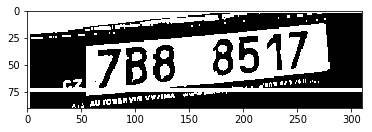

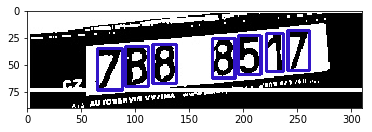

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00138
['7', 'B', '7', '8', '2', '8', '0']
{'8': ['8_0', '8_1'], '7': ['7_0', '7_1']}


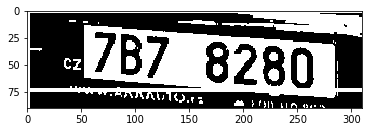

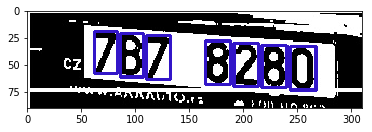

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00095
['2', 'B', '9', '7', '3', '2', '5']
{'2': ['2_0', '2_1']}


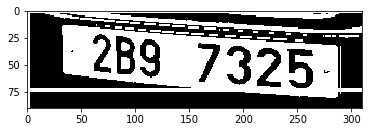

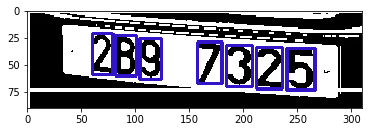

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00079
['B', 'Z', '0', '5', '0', '4', '2']
{'0': ['0_0', '0_1']}


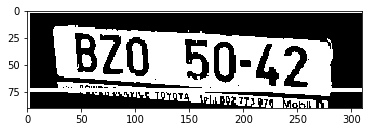

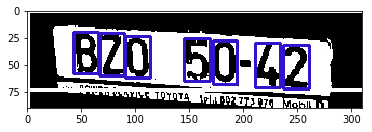

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00006
['8', 'T', '3', '2', '2', '9', '0']
{'2': ['2_0', '2_1']}


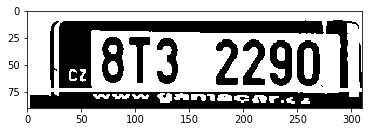

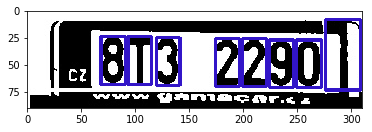

i am not saving


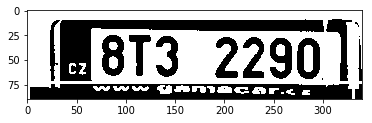

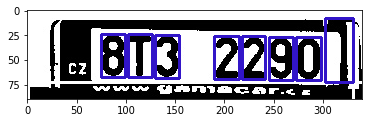

i am not saving
_----------------------------------__Starting______________________________------------------
I00000
['4', 'E', '0', '2', '3', '0', '4']
{'4': ['4_0', '4_1'], '0': ['0_0', '0_1']}


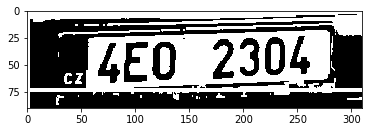

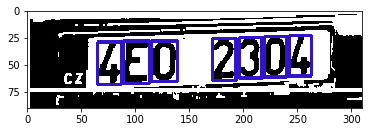

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00005
['6', 'C', '7', '1', '3', '9', '0']
{}


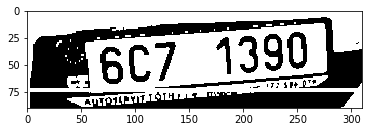

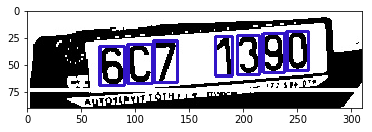

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00038
['3', 'T', '1', '6', '7', '5', '4']
{}


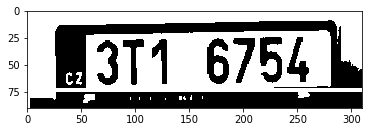

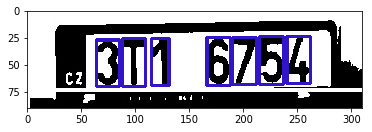

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00022
['7', 'B', '1', '2', '1', '5', '1']
{'1': ['1_0', '1_1', '1_2']}


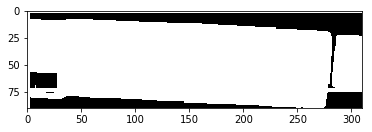

i am not saving


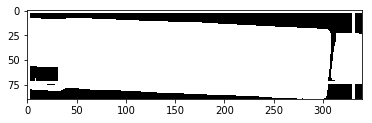

i am not saving
_----------------------------------__Starting______________________________------------------
I00023
['1', 'J', '2', '4', '8', '1', '3']
{'1': ['1_0', '1_1']}


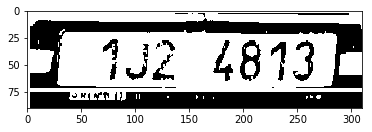

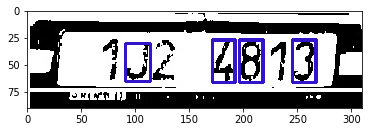

i am not saving


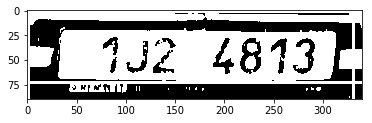

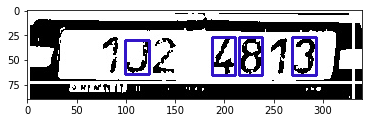

i am not saving
_----------------------------------__Starting______________________________------------------
I00056
['5', 'H', '8', '5', '5', '6', '4']
{'5': ['5_0', '5_1', '5_2']}


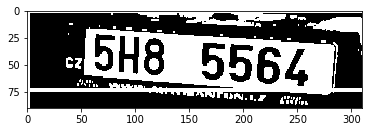

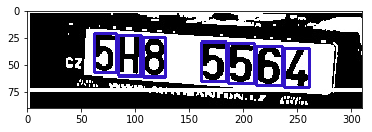

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00046
['6', 'B', '6', '7', '0', '3', '3']
{'3': ['3_0', '3_1'], '6': ['6_0', '6_1']}


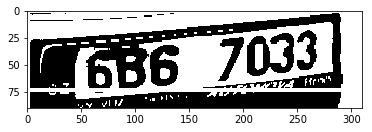

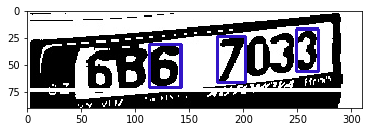

i am not saving


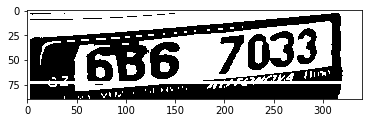

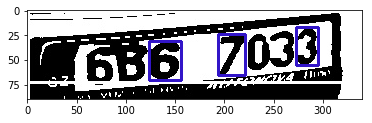

i am not saving
_----------------------------------__Starting______________________________------------------
I00023
['1', 'J', '2', '4', '8', '1', '3']
{'1': ['1_0', '1_1']}


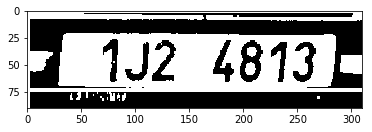

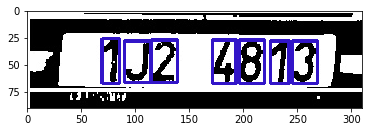

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00015
['3', 'B', '3', '7', '9', '0', '2']
{'3': ['3_0', '3_1']}


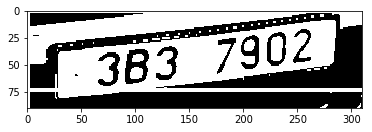

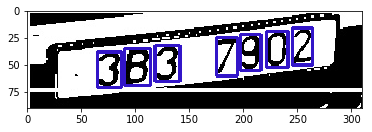

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00082
['1', 'B', '7', '0', '2', '3', '0']
{'0': ['0_0', '0_1']}


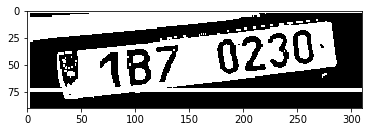

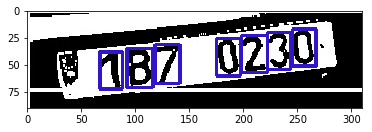

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00080
['9', 'T', '1', '9', '2', '0', '2']
{'9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


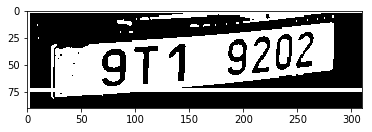

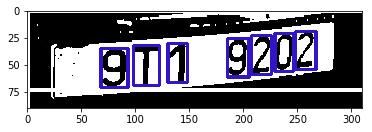

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00137
['5', 'B', '2', '6', '6', '7', '5']
{'6': ['6_0', '6_1'], '5': ['5_0', '5_1']}


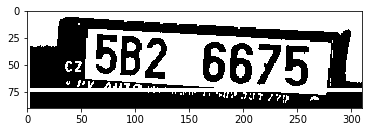

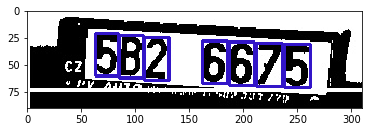

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00004
['8', 'B', '7', '9', '6', '9', '7']
{'9': ['9_0', '9_1'], '7': ['7_0', '7_1']}


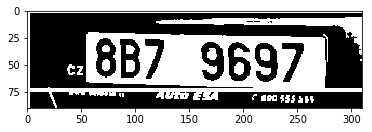

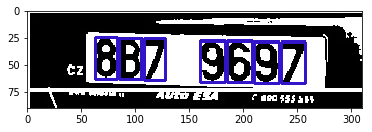

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00076
['1', 'B', 'D', '0', '6', '7', '9']
{}


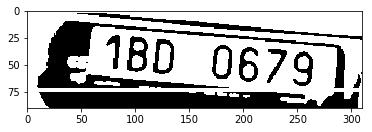

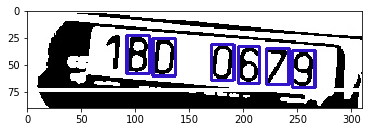

i am not saving


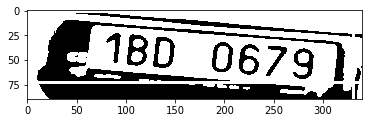

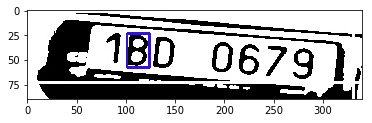

i am not saving
_----------------------------------__Starting______________________________------------------
I00050
['8', 'B', '4', '1', '9', '5', '8']
{'8': ['8_0', '8_1']}


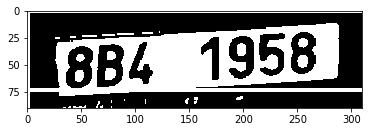

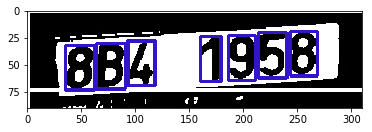

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00102
['9', 'B', '1', '4', '0', '1', '5']
{'1': ['1_0', '1_1']}


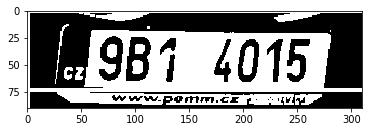

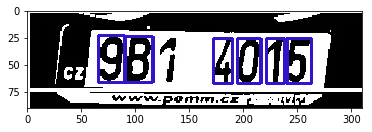

i am not saving


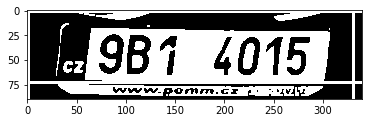

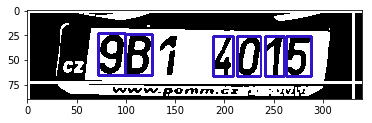

i am not saving
_----------------------------------__Starting______________________________------------------
I00085
['7', 'B', '4', '6', '2', '0', '4']
{'4': ['4_0', '4_1']}


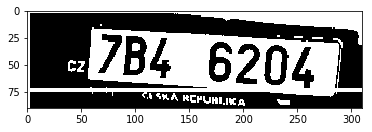

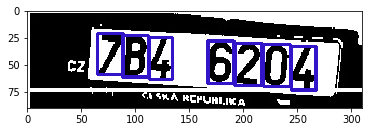

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00075
['7', 'B', '7', '3', '4', '8', '5']
{'7': ['7_0', '7_1']}


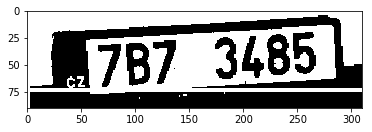

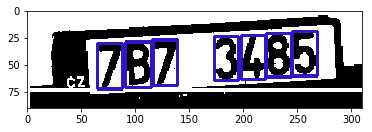

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00037
['B', '0', 'L', '3', '4', '0', '3']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


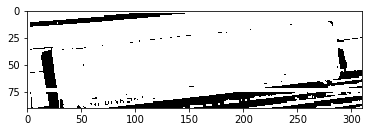

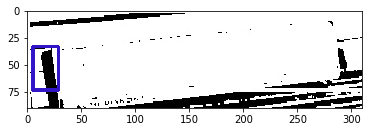

i am not saving


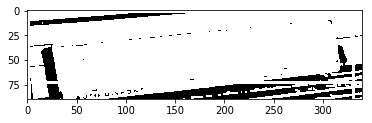

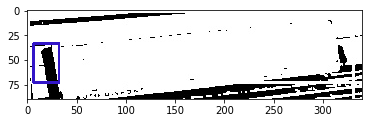

i am not saving
_----------------------------------__Starting______________________________------------------
I00070
['1', 'B', '8', '5', '8', '1', '5']
{'8': ['8_0', '8_1'], '5': ['5_0', '5_1'], '1': ['1_0', '1_1']}


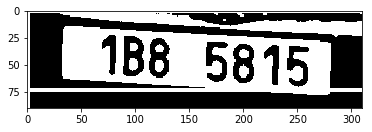

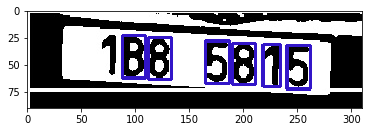

i am not saving


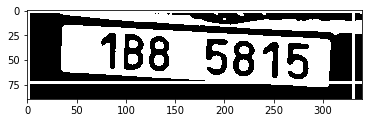

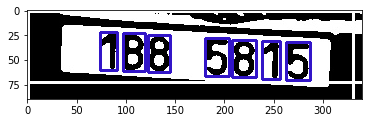

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00064
['7', 'B', '6', '5', '5', '8', '5']
{'5': ['5_0', '5_1', '5_2']}


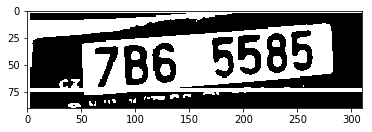

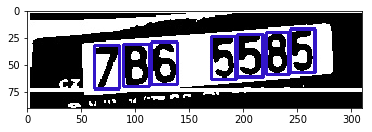

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00017
['5', 'B', '2', '9', '7', '3', '7']
{'7': ['7_0', '7_1']}


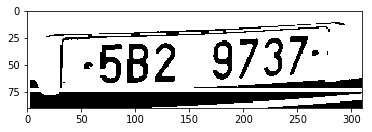

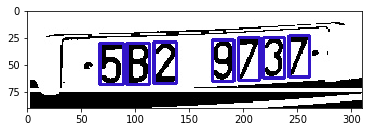

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00129
['3', 'B', '2', '5', '2', '2', '9']
{'2': ['2_0', '2_1', '2_2']}


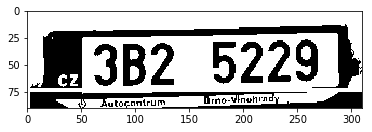

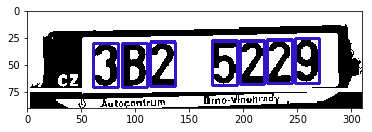

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00064
['6', 'B', '8', '4', '9', '4', '9']
{'9': ['9_0', '9_1'], '4': ['4_0', '4_1']}


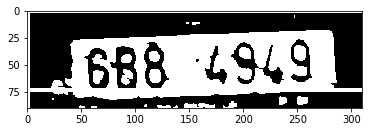

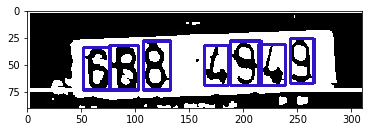

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00099
['8', 'B', '2', '2', '9', '2', '0']
{'2': ['2_0', '2_1', '2_2']}


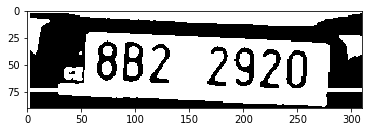

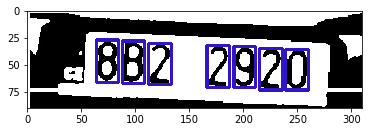

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00035
['2', 'B', '4', '6', '1', '7', '5']
{}


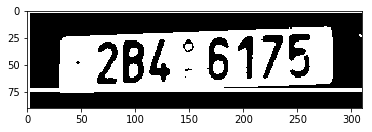

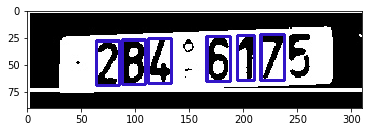

i am not saving


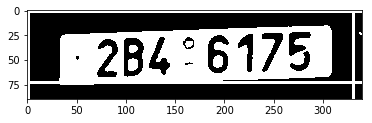

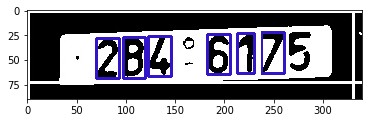

i am not saving
_----------------------------------__Starting______________________________------------------
I00032
['7', 'B', '3', '1', '5', '0', '5']
{'5': ['5_0', '5_1']}


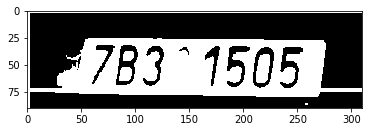

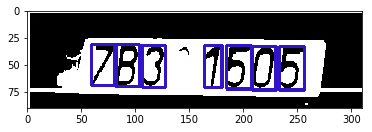

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00014
['3', 'S', '8', '6', '8', '9', '9']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


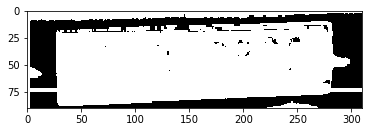

i am not saving


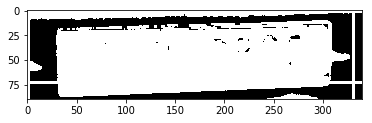

i am not saving
_----------------------------------__Starting______________________________------------------
I00008
['B', 'Z', 'D', '1', '2', '2', '3']
{'2': ['2_0', '2_1']}


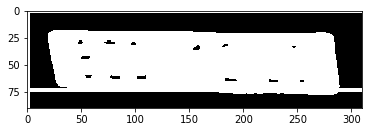

i am not saving


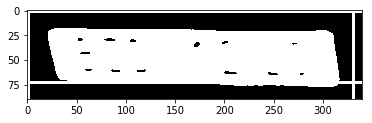

i am not saving
_----------------------------------__Starting______________________________------------------
I00024
['1', 'B', 'C', '4', '1', '4', '6']
{'1': ['1_0', '1_1'], '4': ['4_0', '4_1']}


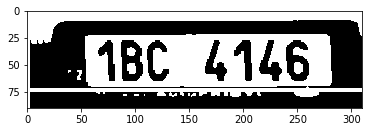

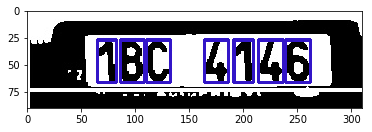

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00037
['5', 'B', '0', '8', '4', '3', '6']
{}


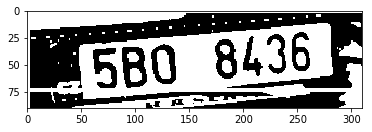

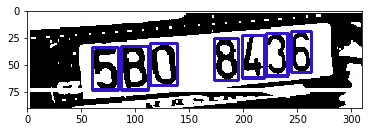

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00067
['5', 'B', '3', '8', '4', '3', '4']
{'3': ['3_0', '3_1'], '4': ['4_0', '4_1']}


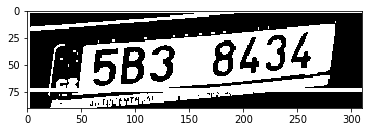

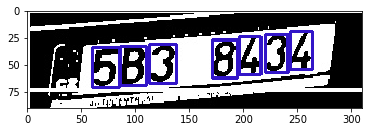

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00028
['5', 'B', '0', '6', '2', '5', '6']
{'6': ['6_0', '6_1'], '5': ['5_0', '5_1']}


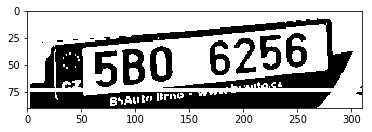

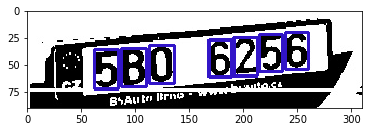

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00024
['9', 'B', '3', '0', '1', '3', '0']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


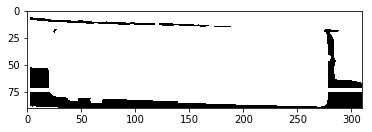

i am not saving


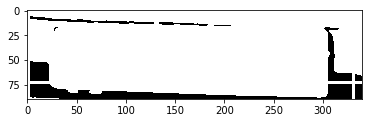

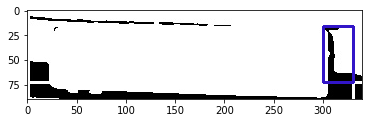

i am not saving
_----------------------------------__Starting______________________________------------------
I00036
['7', 'B', '6', '3', '7', '6', '6']
{'7': ['7_0', '7_1'], '6': ['6_0', '6_1', '6_2']}


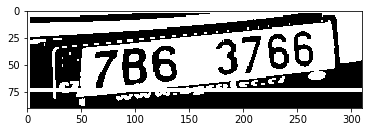

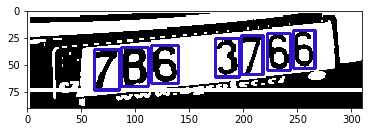

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00057
['8', 'B', '8', '1', '0', '1', '3']
{'1': ['1_0', '1_1'], '8': ['8_0', '8_1']}


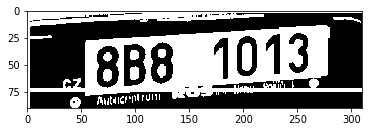

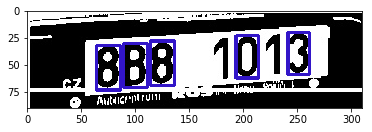

i am not saving


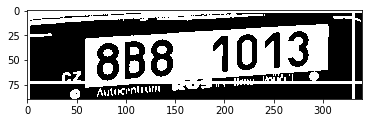

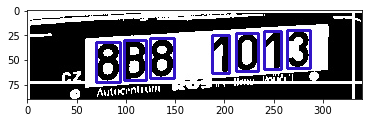

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00001
['1', 'B', '4', '9', '9', '5', '1']
{'9': ['9_0', '9_1'], '1': ['1_0', '1_1']}


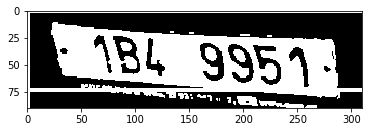

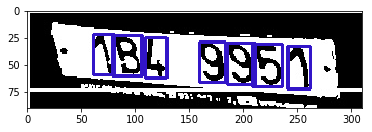

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00065
['6', 'B', '8', '4', '9', '4', '9']
{'9': ['9_0', '9_1'], '4': ['4_0', '4_1']}


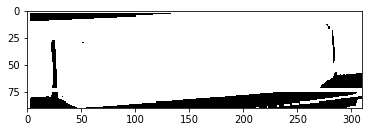

i am not saving


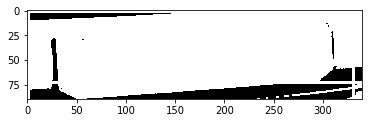

i am not saving
_----------------------------------__Starting______________________________------------------
I00062
['2', 'Z', '5', '2', '6', '8', '9']
{'2': ['2_0', '2_1']}


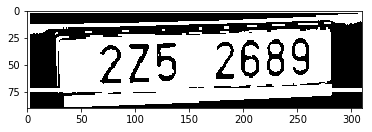

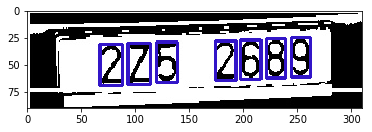

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00075
['1', 'B', 'A', '3', '4', '2', '8']
{}


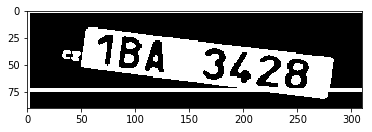

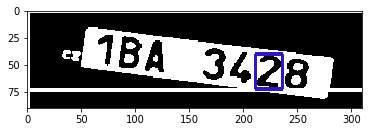

i am not saving


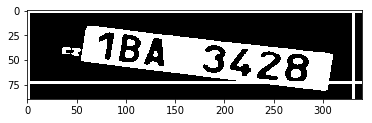

i am not saving
_----------------------------------__Starting______________________________------------------
I00053
['6', 'B', '8', '9', '3', '5', '8']
{'8': ['8_0', '8_1']}


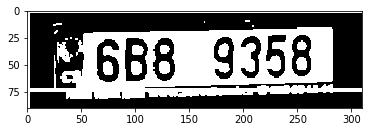

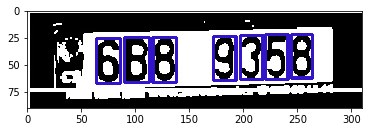

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00046
['9', 'B', '8', '3', '3', '0', '5']
{'3': ['3_0', '3_1']}


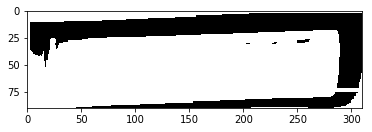

i am not saving


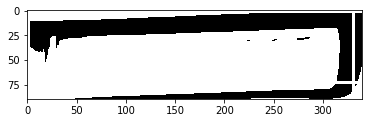

i am not saving
_----------------------------------__Starting______________________________------------------
I00110
['8', 'B', '8', '6', '2', '6', '6']
{'6': ['6_0', '6_1', '6_2'], '8': ['8_0', '8_1']}


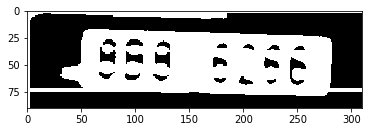

i am not saving


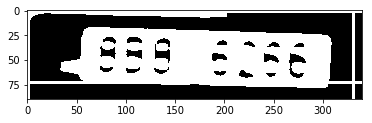

i am not saving
_----------------------------------__Starting______________________________------------------
I00001
['9', 'B', '4', '3', '1', '0', '4']
{'4': ['4_0', '4_1']}


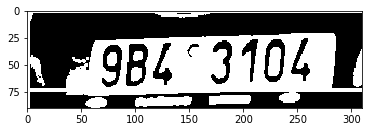

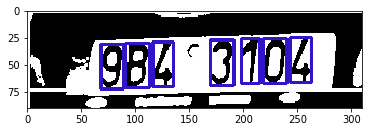

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00123
['B', 'Z', 'B', '1', '9', '2', '2']
{'2': ['2_0', '2_1'], 'B': ['B_0', 'B_1']}


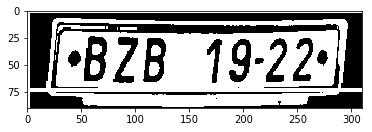

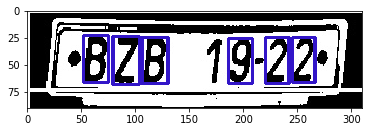

i am not saving


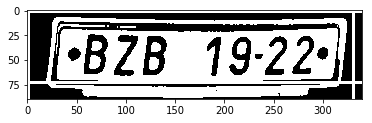

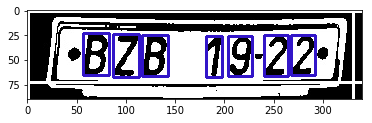

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00075
['9', 'B', '1', '3', '1', '9', '8']
{'9': ['9_0', '9_1'], '1': ['1_0', '1_1']}


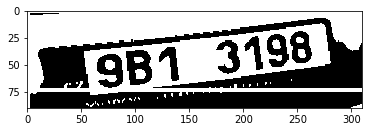

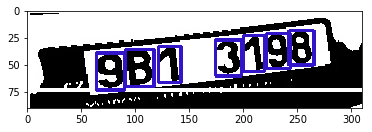

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00085
['7', 'B', '5', '9', '8', '3', '9']
{'9': ['9_0', '9_1']}


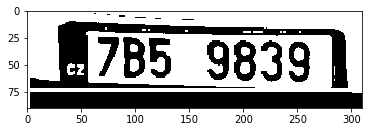

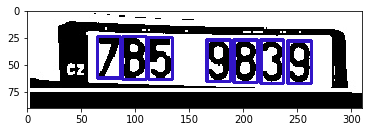

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00094
['8', 'B', '7', '7', '9', '3', '2']
{'7': ['7_0', '7_1']}


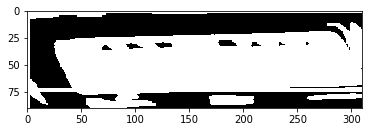

i am not saving


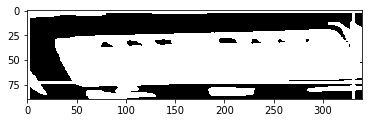

i am not saving
_----------------------------------__Starting______________________________------------------
I00073
['5', 'B', '1', '1', '1', '4', '9']
{'1': ['1_0', '1_1', '1_2']}


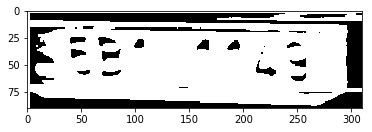

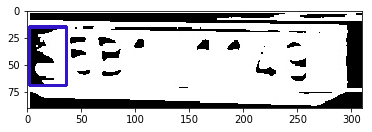

i am not saving


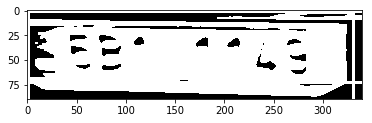

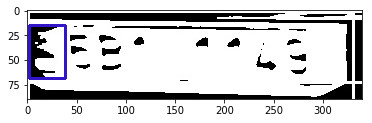

i am not saving
_----------------------------------__Starting______________________________------------------
I00003
['5', 'B', '1', '1', '1', '8', '1']
{'1': ['1_0', '1_1', '1_2', '1_3']}


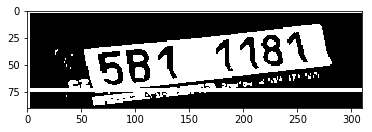

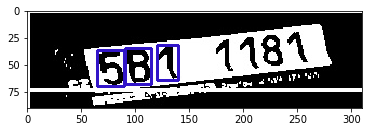

i am not saving


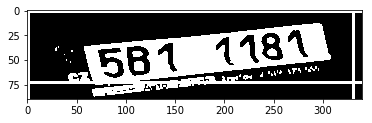

i am not saving
_----------------------------------__Starting______________________________------------------
I00108
['8', 'B', '8', '6', '2', '6', '6']
{'6': ['6_0', '6_1', '6_2'], '8': ['8_0', '8_1']}


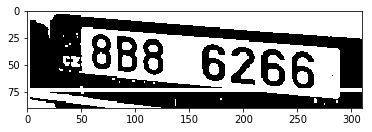

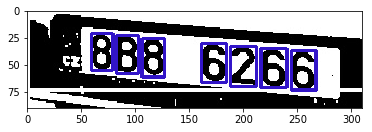

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00012
['8', 'B', '7', '0', '6', '8', '8']
{'8': ['8_0', '8_1', '8_2']}


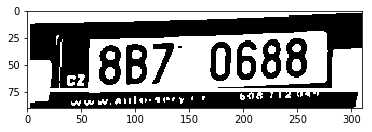

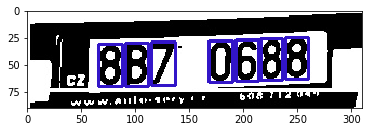

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00093
['9', 'B', '1', '3', '7', '7', '2']
{'7': ['7_0', '7_1']}


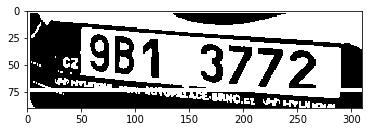

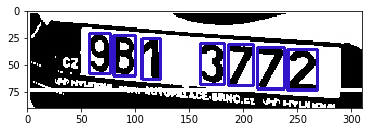

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00083
['9', 'B', '8', '5', '2', '8', '9']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


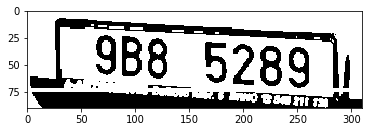

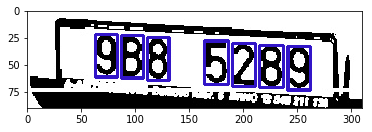

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00042
['9', 'B', '5', '4', '8', '1', '7']
{}


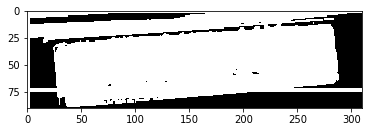

i am not saving


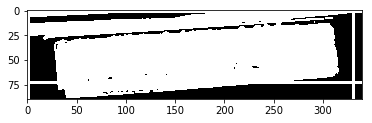

i am not saving
_----------------------------------__Starting______________________________------------------
I00041
['6', 'B', '6', '8', '3', '8', '4']
{'8': ['8_0', '8_1'], '6': ['6_0', '6_1']}


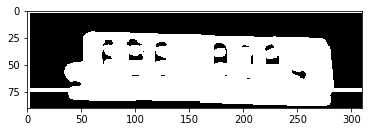

i am not saving


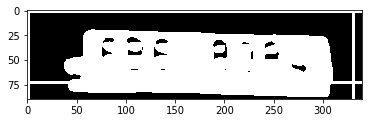

i am not saving
_----------------------------------__Starting______________________________------------------
I00064
['4', 'E', '0', '2', '3', '0', '4']
{'4': ['4_0', '4_1'], '0': ['0_0', '0_1']}


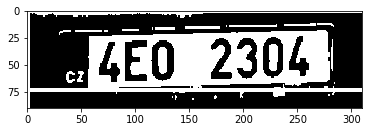

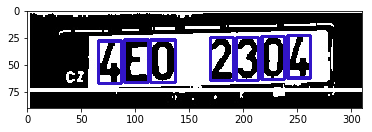

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00076
['1', 'B', 'D', '0', '6', '7', '9']
{}


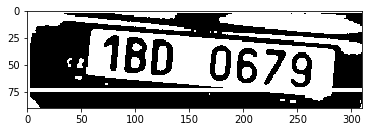

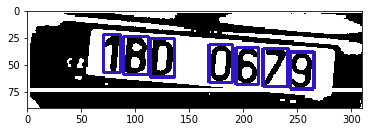

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00011
['7', 'B', '1', '0', '3', '0', '7']
{'0': ['0_0', '0_1'], '7': ['7_0', '7_1']}


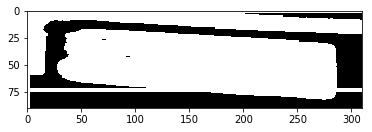

i am not saving


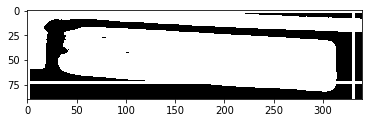

i am not saving
_----------------------------------__Starting______________________________------------------
I00014
['3', 'S', '8', '6', '8', '9', '9']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


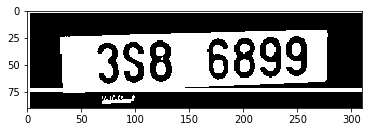

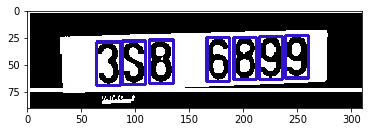

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00062
['3', 'B', '6', '0', '8', '3', '2']
{'3': ['3_0', '3_1']}


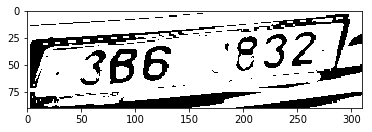

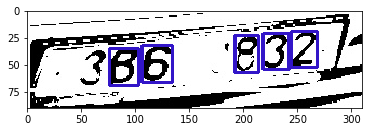

i am not saving


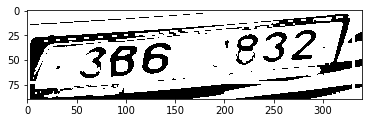

i am not saving
_----------------------------------__Starting______________________________------------------
I00012
['B', 'V', 'J', '6', '4', '1', '1']
{'1': ['1_0', '1_1']}


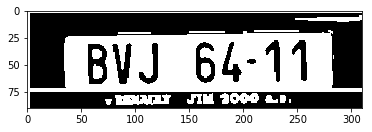

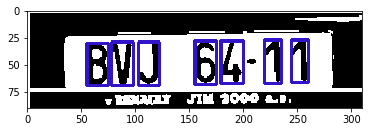

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00011
['5', 'B', '0', '5', '5', '3', '1']
{'5': ['5_0', '5_1', '5_2']}


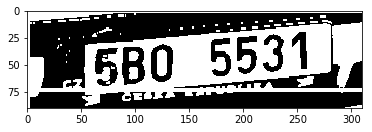

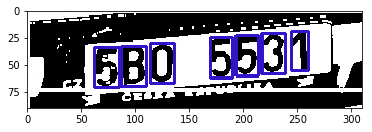

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00035
['7', 'B', '3', '0', '3', '3', '2']
{'3': ['3_0', '3_1', '3_2']}


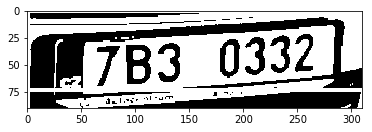

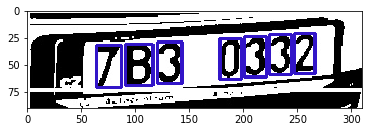

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00030
['9', 'T', '3', '3', '6', '6', '3']
{'3': ['3_0', '3_1', '3_2'], '6': ['6_0', '6_1']}


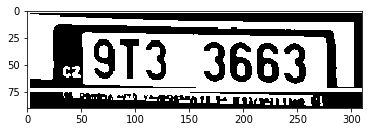

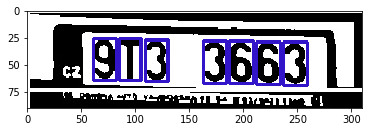

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00025
['5', 'B', '7', '7', '6', '5', '5']
{'5': ['5_0', '5_1', '5_2'], '7': ['7_0', '7_1']}


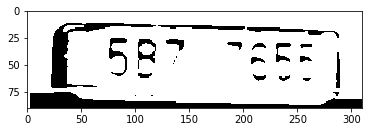

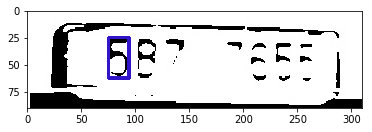

i am not saving


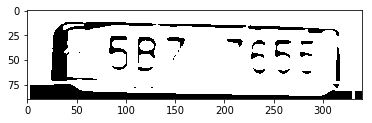

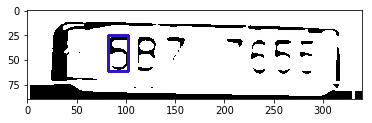

i am not saving
_----------------------------------__Starting______________________________------------------
I00066
['3', 'B', '7', '5', '7', '6', '3']
{'3': ['3_0', '3_1'], '7': ['7_0', '7_1']}


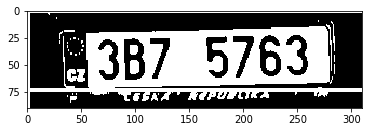

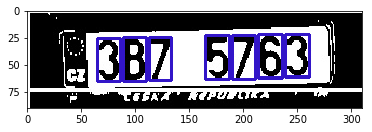

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00069
['4', 'B', '4', '6', '6', '9', '4']
{'4': ['4_0', '4_1', '4_2'], '6': ['6_0', '6_1']}


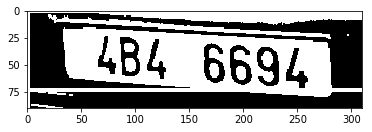

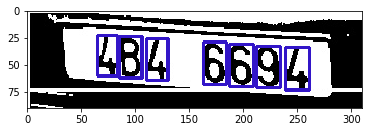

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00090
['1', 'B', 'B', '9', '1', '1', '0']
{'B': ['B_0', 'B_1'], '1': ['1_0', '1_1', '1_2']}


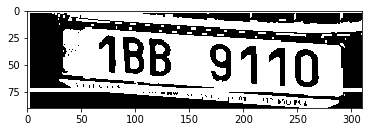

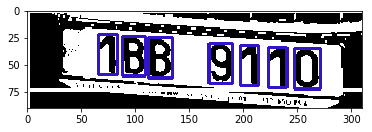

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00101
['7', 'B', '3', '1', '9', '4', '7']
{'7': ['7_0', '7_1']}


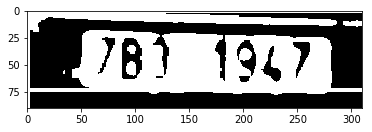

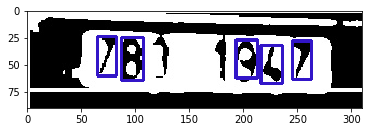

i am not saving


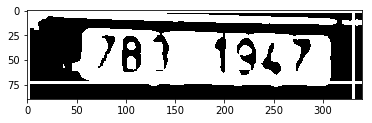

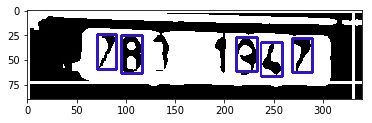

i am not saving
_----------------------------------__Starting______________________________------------------
I00069
['9', 'B', '6', '4', '0', '6', '4']
{'6': ['6_0', '6_1'], '4': ['4_0', '4_1']}


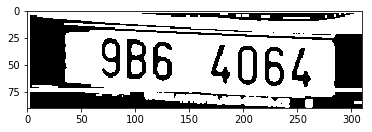

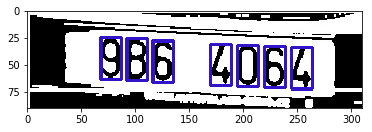

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00007
['6', 'B', '4', '5', '4', '9', '5']
{'4': ['4_0', '4_1'], '5': ['5_0', '5_1']}


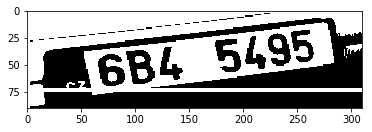

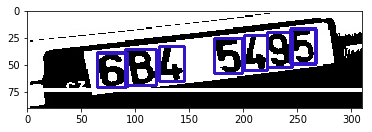

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00058
['B', 'Z', '0', '4', '9', '6', '6']
{'6': ['6_0', '6_1']}


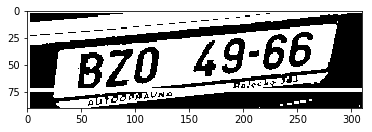

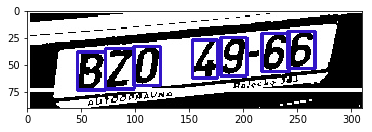

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00001
['9', 'B', '4', '3', '1', '0', '4']
{'4': ['4_0', '4_1']}


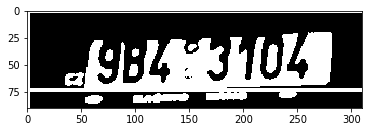

i am not saving


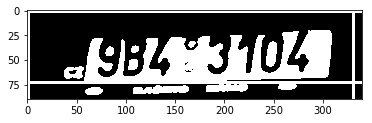

i am not saving
_----------------------------------__Starting______________________________------------------
I00059
['B', '8', '1', '2', '1']
{'1': ['1_0', '1_1']}


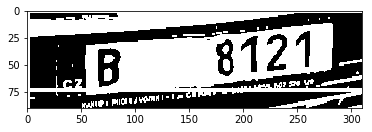

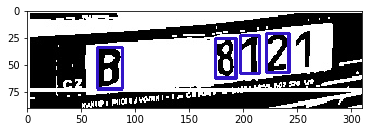

i am not saving


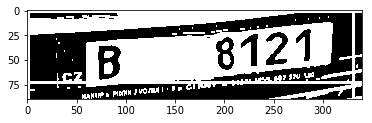

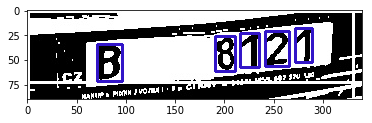

i am not saving
_----------------------------------__Starting______________________________------------------
I00081
['9', 'B', '4', '5', '1', '9', '3']
{'9': ['9_0', '9_1']}


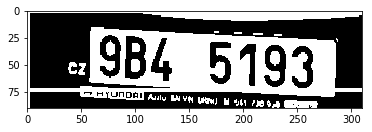

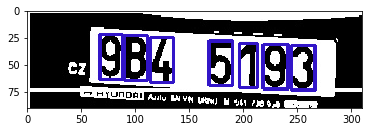

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00070
['8', 'B', '6', '9', '5', '8', '8']
{'8': ['8_0', '8_1', '8_2']}


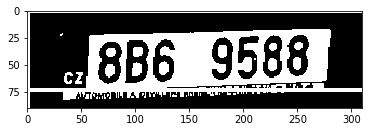

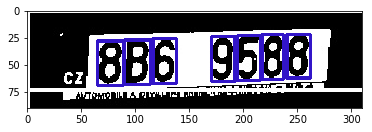

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00033
['3', 'A', 'I', '0', '8', '5', '1']
{}


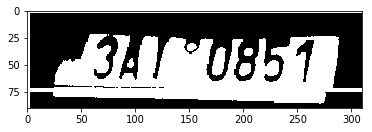

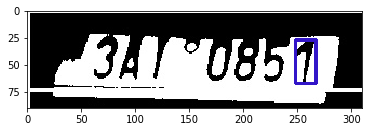

i am not saving


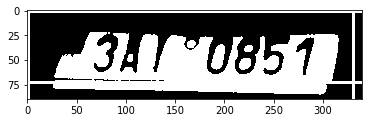

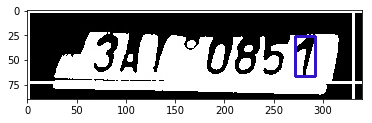

i am not saving
_----------------------------------__Starting______________________________------------------
I00034
['8', 'B', '2', '3', '1', '7', '0']
{}


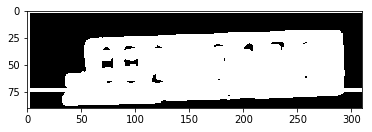

i am not saving


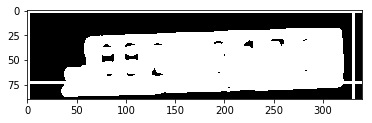

i am not saving
_----------------------------------__Starting______________________________------------------
I00015
['7', 'B', '1', '4', '3', '4', '9']
{'4': ['4_0', '4_1']}


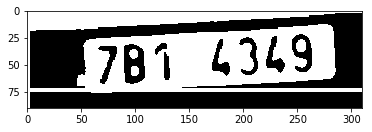

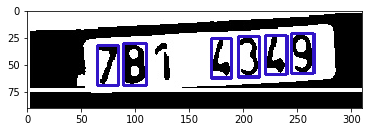

i am not saving


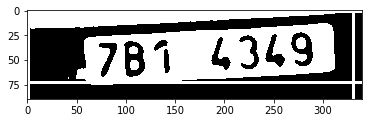

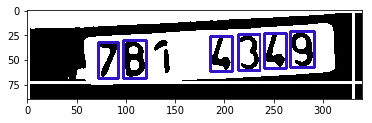

i am not saving
_----------------------------------__Starting______________________________------------------
I00019
['4', 'B', '4', '2', '0', '2', '9']
{'2': ['2_0', '2_1'], '4': ['4_0', '4_1']}


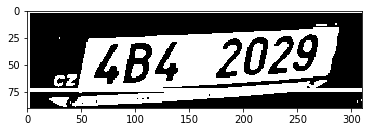

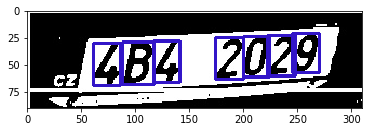

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00023
['7', 'B', '2', '7', '1', '5', '0']
{'7': ['7_0', '7_1']}


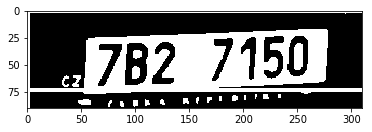

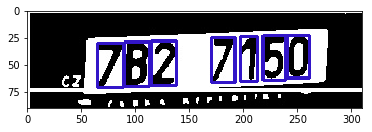

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00035
['9', 'B', '8', '4', '3', '9', '1']
{'9': ['9_0', '9_1']}


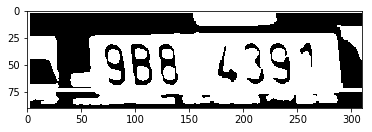

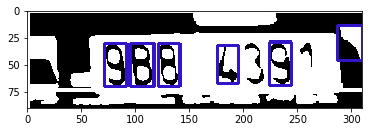

i am not saving


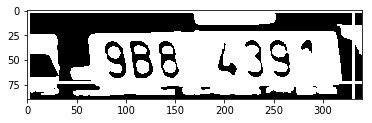

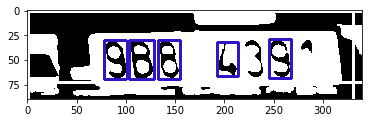

i am not saving
_----------------------------------__Starting______________________________------------------
I00055
['6', 'B', '3', '4', '8', '5', '9']
{}


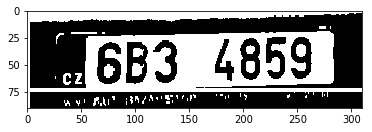

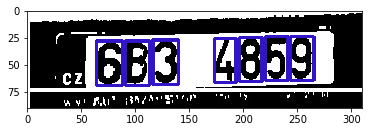

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00010
['6', 'M', '0', '4', '2', '9', '1']
{}


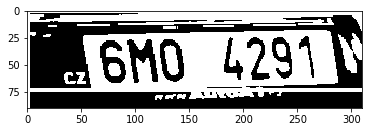

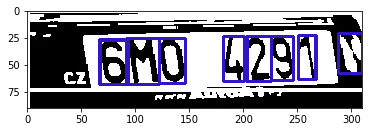

i am not saving


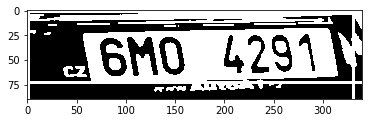

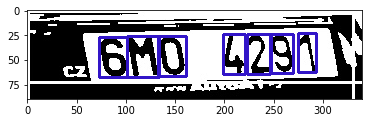

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00086
['7', 'B', '1', '1', '1', '2', '3']
{'1': ['1_0', '1_1', '1_2']}


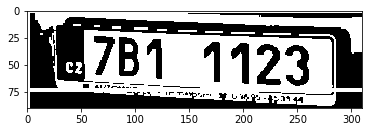

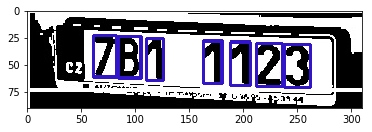

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00015
['4', 'B', '8', '3', '9', '4', '0']
{'4': ['4_0', '4_1']}


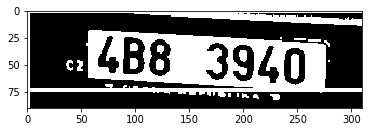

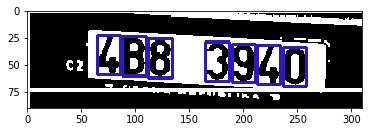

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00085
['7', 'B', '4', '6', '2', '0', '4']
{'4': ['4_0', '4_1']}


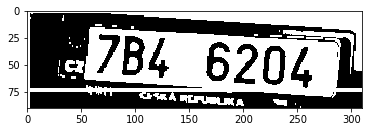

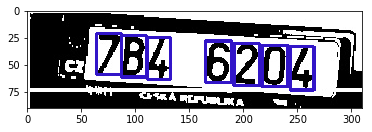

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00021
['4', 'B', '2', '0', '7', '3', '7']
{'7': ['7_0', '7_1']}


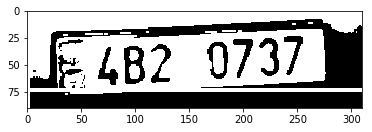

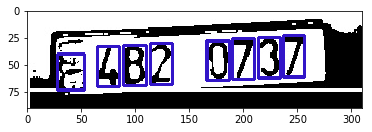

i am not saving


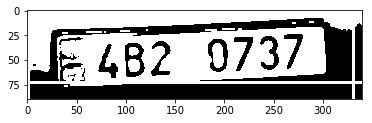

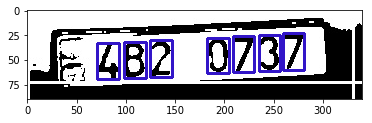

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00111
['7', 'B', '3', '4', '2', '1', '6']
{}


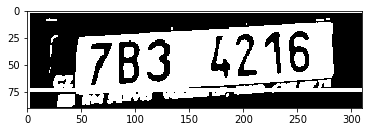

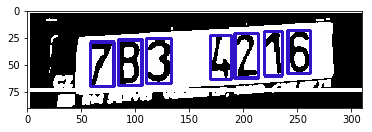

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00007
['6', 'B', '4', '8', '9', '2', '7']
{}


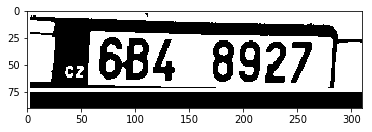

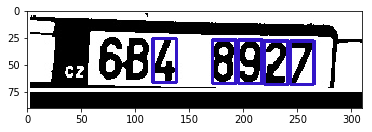

i am not saving


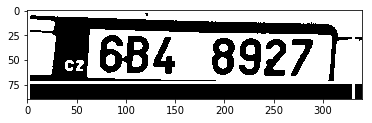

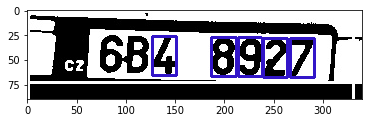

i am not saving
_----------------------------------__Starting______________________________------------------
I00065
['6', 'B', '8', '4', '9', '4', '9']
{'9': ['9_0', '9_1'], '4': ['4_0', '4_1']}


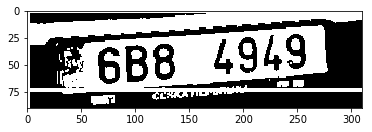

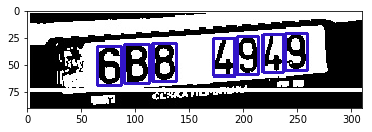

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00050
['8', 'B', '4', '1', '9', '5', '8']
{'8': ['8_0', '8_1']}


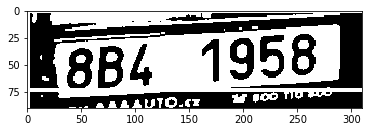

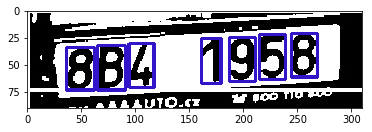

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00019
['3', 'B', '6', '0', '3', '7', '2']
{'3': ['3_0', '3_1']}


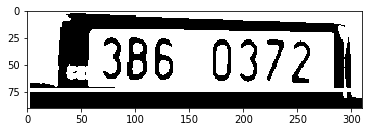

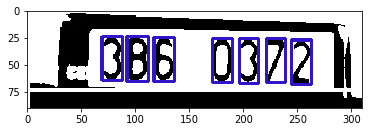

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00020
['8', 'B', '7', '1', '4', '0', '1']
{'1': ['1_0', '1_1']}


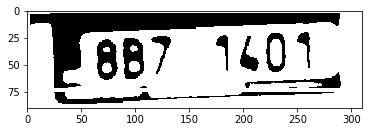

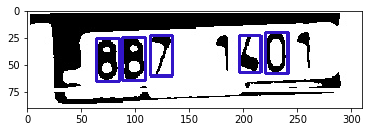

i am not saving


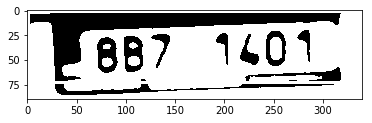

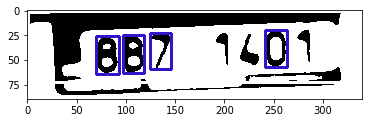

i am not saving


578    None
642    None
273    None
559    None
33     None
234    None
206    None
403    None
443    None
613    None
441    None
376    None
258    None
649    None
202    None
252    None
591    None
61     None
558    None
425    None
384    None
28     None
411    None
100    None
211    None
307    None
284    None
418    None
169    None
126    None
       ... 
91     None
611    None
617    None
377    None
398    None
179    None
210    None
594    None
198    None
597    None
359    None
336    None
106    None
109    None
70     None
516    None
524    None
111    None
306    None
216    None
650    None
30     None
367    None
83     None
419    None
492    None
608    None
297    None
235    None
81     None
Length: 416, dtype: object

In [23]:
train_df_val.apply(store_training,axis=1)

In [27]:
def store_validation(df):
    print("_----------------------------------__Starting______________________________------------------")
    image_path = df["image_path"]
    image_path_str = image_path.split("/")[-1]
    image_path_str = image_path_str.split(".")[0]
    print(image_path_str)
    number = str(df["lp"])
    number_list = list(number)
    print(number_list)
    duplicateFrequencies = {}
    for i in set(number_list):
        duplicateFrequencies[i] = number_list.count(i)
    new_dict = {}
    for key, value in duplicateFrequencies.items():
        if value >1:
            new_lis = []
            for i in range(value):
                new_lis.append(key+"_"+str(i))
            new_dict[key] = new_lis
        
    print(new_dict)
    image_path = image_path.replace("./","2017-IWT4S-HDR_LP-dataset/")
    image = cv2.imread(image_path)
    char_list = segment_characters(image)
    if len(char_list) > 7 or len(char_list) < 7:
        print("i am not saving")
        char_list = segment_characters(image,340)
        if len(char_list) > 7 or len(char_list) < 7:
            print("i am not saving")
        else:
            for index,char in enumerate(char_list):
                print(char.shape)
                new_number = number_list[index]
                class_new_number = "class_"+new_number
                if new_number in new_dict.keys():
                    dict_list = new_dict[new_number]
                    if not dict_list:
                        dict_list_number = "_"
                    else:  
                        dict_list_number = dict_list.pop(0)
            
                else: 
                    dict_list_number = "_"
                saved_path = "/Users/nikeshmangwani/Desktop/idfy_interview/idfy_generated_data/val/"+class_new_number+"/"+image_path_str+"_"+str(dict_list_number)+".png"
                scipy.misc.imsave(saved_path, char)

    else:
        for index,char in enumerate(char_list):
            print(char.shape)
            new_number = number_list[index]
            class_new_number = "class_"+new_number
            if new_number in new_dict.keys():
                dict_list = new_dict[new_number]
                if not dict_list:
                    dict_list_number = "_"
                else:  
                    dict_list_number = dict_list.pop(0)
            
            else: 
                dict_list_number = "_"
            saved_path = "/Users/nikeshmangwani/Desktop/idfy_interview/idfy_generated_data/val/"+class_new_number+"/"+image_path_str+"_"+str(dict_list_number)+".png"
            scipy.misc.imsave(saved_path, char)

    
    

_----------------------------------__Starting______________________________------------------
I00016
['4', 'B', '2', '7', '4', '3', '3']
{'3': ['3_0', '3_1'], '4': ['4_0', '4_1']}


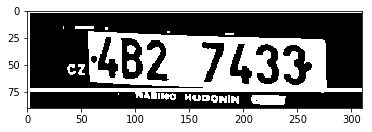

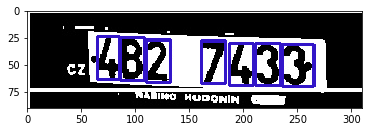

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00044
['5', 'B', '5', '7', '9', '2', '8']
{'5': ['5_0', '5_1']}


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:62: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


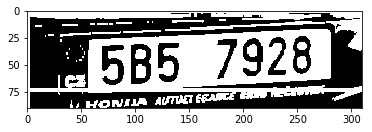

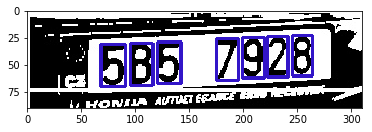

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00069
['4', 'B', '4', '6', '6', '9', '4']
{'4': ['4_0', '4_1', '4_2'], '6': ['6_0', '6_1']}


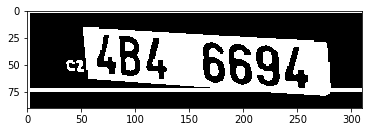

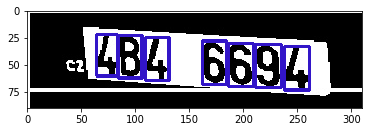

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00080
['B', 'Z', 'I', '0', '3', '4', '6']
{}


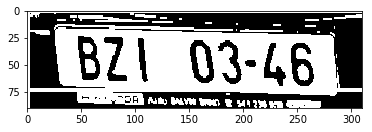

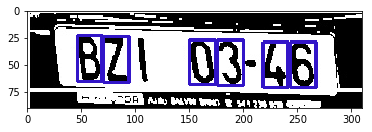

i am not saving


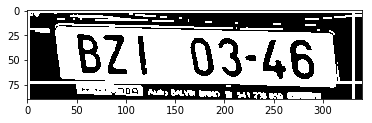

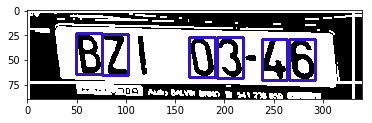

i am not saving
_----------------------------------__Starting______________________________------------------
I00127
['6', 'B', '7', '0', '9', '9', '0']
{'9': ['9_0', '9_1'], '0': ['0_0', '0_1']}


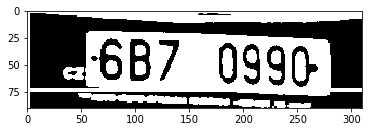

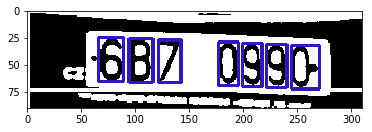

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00108
['8', 'B', '8', '6', '2', '6', '6']
{'6': ['6_0', '6_1', '6_2'], '8': ['8_0', '8_1']}


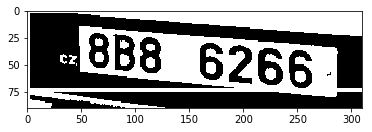

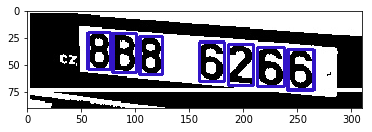

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00030
['9', 'B', '3', '0', '0', '3', '4']
{'3': ['3_0', '3_1'], '0': ['0_0', '0_1']}


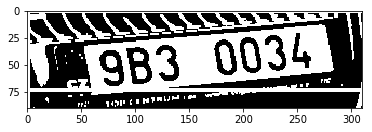

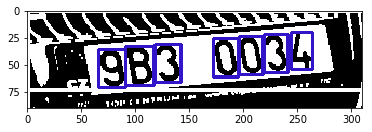

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00047
['8', 'B', '1', '0', '7', '3', '2']
{}


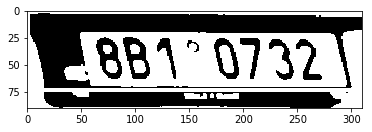

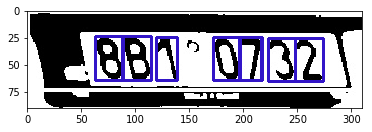

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00059
['3', 'Z', '6', '3', '1', '8', '7']
{'3': ['3_0', '3_1']}


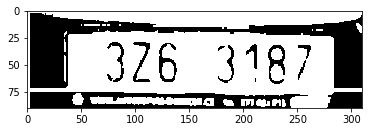

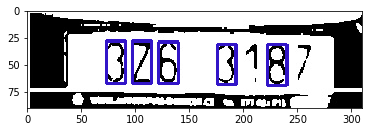

i am not saving


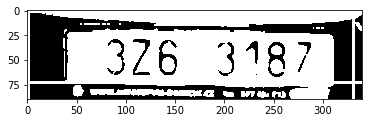

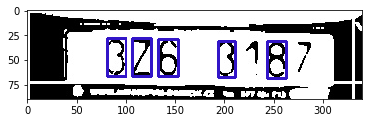

i am not saving
_----------------------------------__Starting______________________________------------------
I00022
['3', 'B', '0', '4', '0', '8', '2']
{'0': ['0_0', '0_1']}


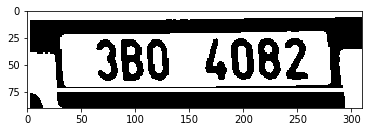

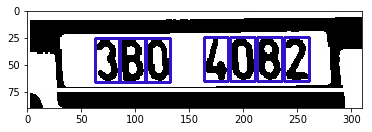

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['4', 'M', '3', '4', '4', '6', '2']
{'4': ['4_0', '4_1', '4_2']}


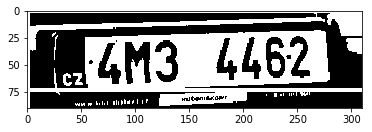

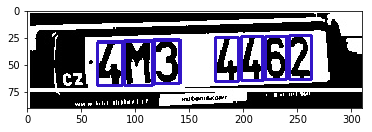

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00038
['2', 'B', '5', '7', '1', '2', '7']
{'2': ['2_0', '2_1'], '7': ['7_0', '7_1']}


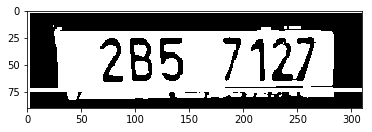

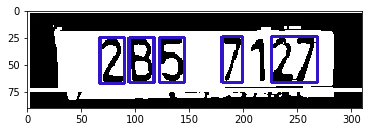

i am not saving


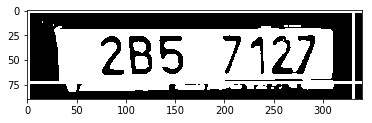

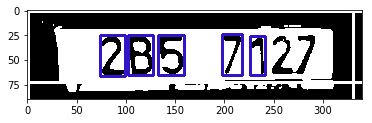

i am not saving
_----------------------------------__Starting______________________________------------------
I00005
['8', 'B', '9', '0', '1', '6', '4']
{}


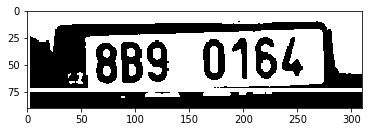

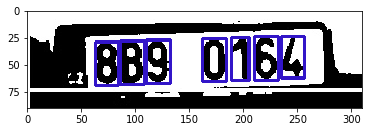

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00061
['7', 'B', '5', '7', '2', '6', '7']
{'7': ['7_0', '7_1', '7_2']}


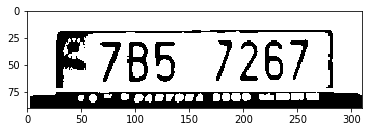

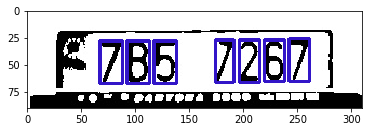

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00018
['8', 'B', '8', '8', '3', '9', '1']
{'8': ['8_0', '8_1', '8_2']}


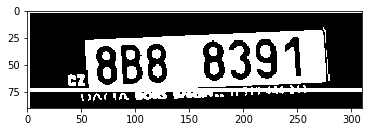

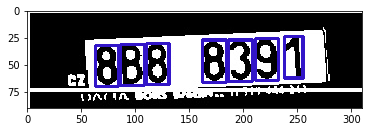

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00016
['7', 'B', '6', '6', '6', '5', '7']
{'7': ['7_0', '7_1'], '6': ['6_0', '6_1', '6_2']}


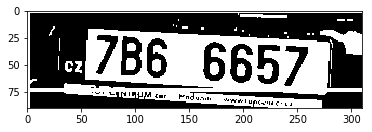

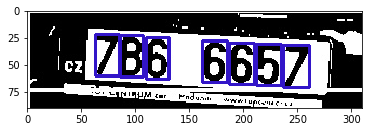

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00093
['9', 'B', '1', '3', '7', '7', '2']
{'7': ['7_0', '7_1']}


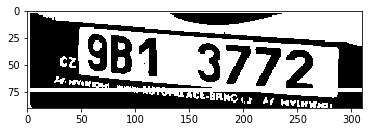

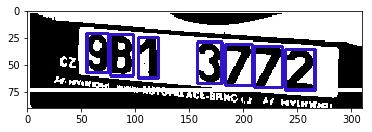

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00084
['1', 'B', 'I', '2', '1', '3', '8']
{'1': ['1_0', '1_1']}


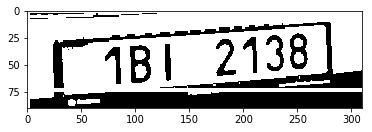

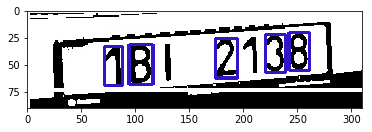

i am not saving


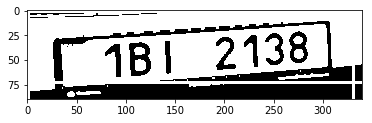

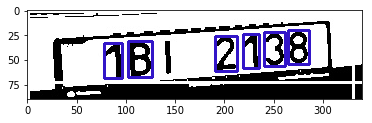

i am not saving
_----------------------------------__Starting______________________________------------------
I00013
['4', 'Z', '4', '2', '4', '0', '7']
{'4': ['4_0', '4_1', '4_2']}


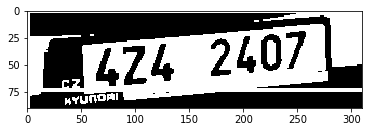

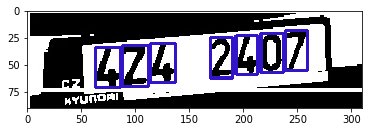

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00099
['8', 'B', '2', '2', '9', '2', '0']
{'2': ['2_0', '2_1', '2_2']}


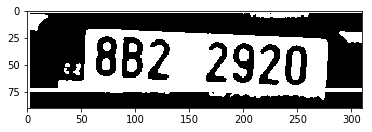

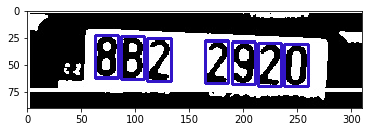

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['Z', 'N', 'E', '2', '3', '9', '3']
{'3': ['3_0', '3_1']}


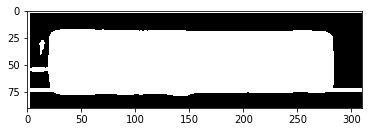

i am not saving


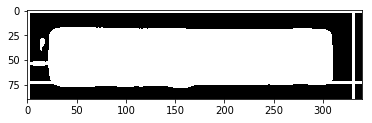

i am not saving
_----------------------------------__Starting______________________________------------------
I00000
['4', 'E', '0', '2', '3', '0', '4']
{'4': ['4_0', '4_1'], '0': ['0_0', '0_1']}


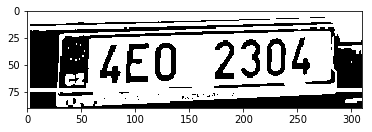

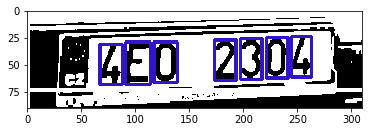

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00022
['7', 'B', '1', '2', '1', '5', '1']
{'1': ['1_0', '1_1', '1_2']}


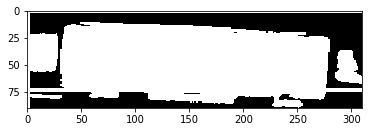

i am not saving


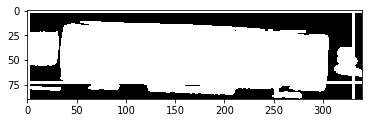

i am not saving
_----------------------------------__Starting______________________________------------------
I00017
['5', 'B', '2', '9', '7', '3', '7']
{'7': ['7_0', '7_1']}


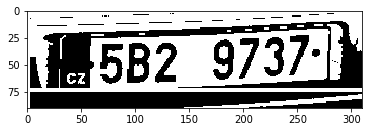

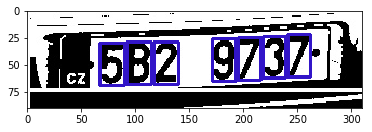

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00116
['3', 'B', '6', '0', '8', '5', '4']
{}


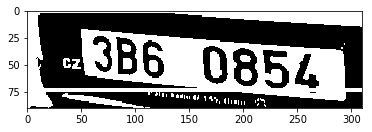

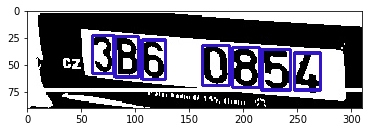

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00029
['2', 'B', '6', '5', '0', '5', '5']
{'5': ['5_0', '5_1', '5_2']}


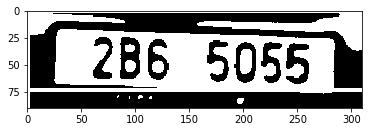

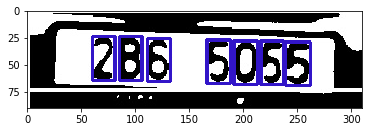

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00026
['7', 'B', '1', '4', '1', '5', '6']
{'1': ['1_0', '1_1']}


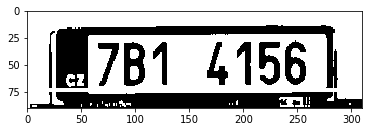

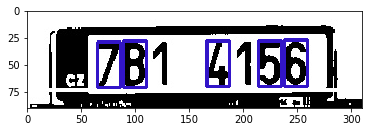

i am not saving


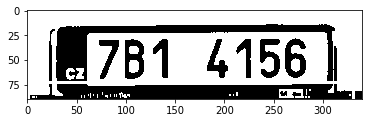

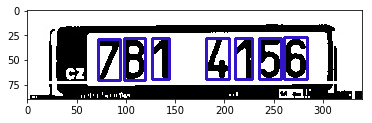

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00071
['2', 'A', 'X', '4', '9', '3', '8']
{}


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: DeprecationWarning: `imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


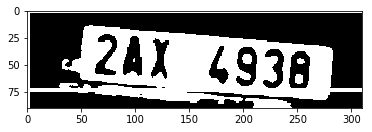

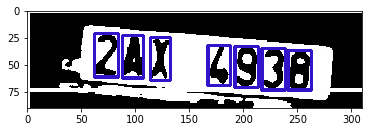

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00059
['1', 'B', '2', '7', '2', '4', '7']
{'2': ['2_0', '2_1'], '7': ['7_0', '7_1']}


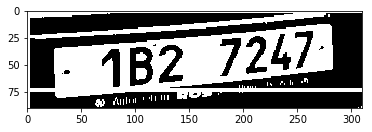

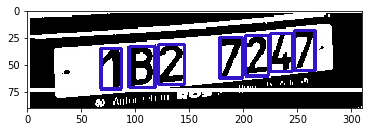

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00008
['B', 'Z', 'D', '1', '2', '2', '3']
{'2': ['2_0', '2_1']}


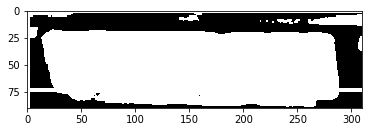

i am not saving


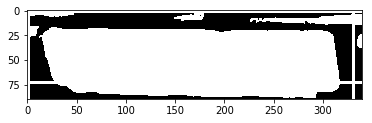

i am not saving
_----------------------------------__Starting______________________________------------------
I00050
['6', 'B', '0', '0', '3', '2', '0']
{'0': ['0_0', '0_1', '0_2']}


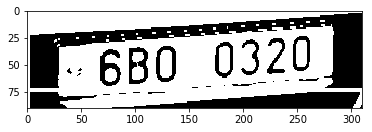

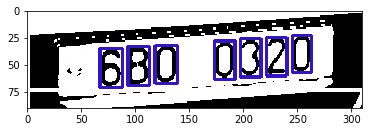

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00084
['2', 'B', '9', '0', '1', '7', '8']
{}


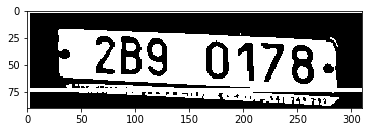

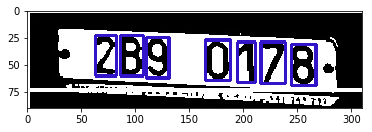

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00018
['8', 'B', '8', '8', '3', '9', '1']
{'8': ['8_0', '8_1', '8_2']}


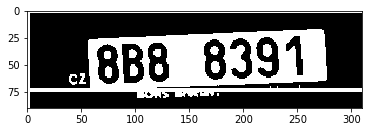

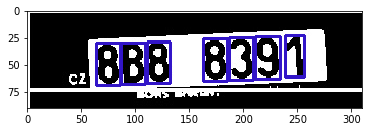

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00048
['B', 'Z', 'E', '7', '2', '7', '7']
{'7': ['7_0', '7_1', '7_2']}


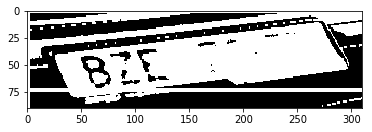

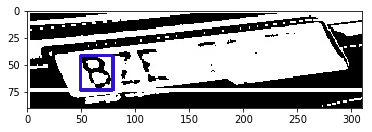

i am not saving


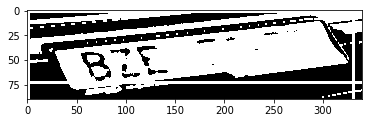

i am not saving
_----------------------------------__Starting______________________________------------------
I00074
['5', 'B', '7', '7', '3', '7', '9']
{'7': ['7_0', '7_1', '7_2']}


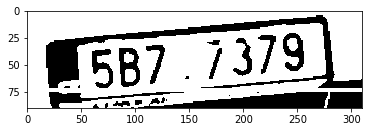

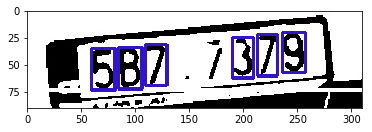

i am not saving


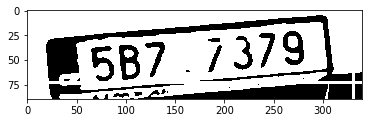

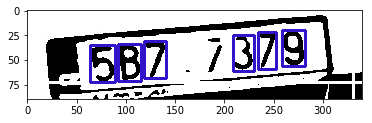

i am not saving
_----------------------------------__Starting______________________________------------------
I00059
['1', 'B', '2', '7', '2', '4', '7']
{'2': ['2_0', '2_1'], '7': ['7_0', '7_1']}


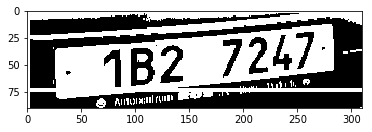

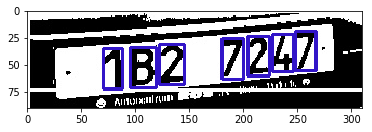

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00022
['5', 'B', '2', '9', '6', '7', '0']
{}


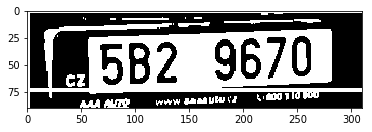

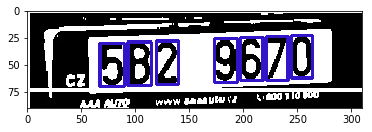

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00018
['4', 'A', 'X', '9', '6', '6', '0']
{'6': ['6_0', '6_1']}


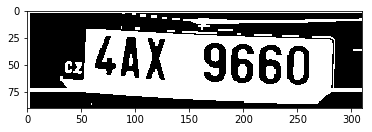

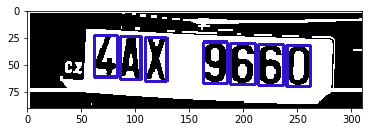

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00014
['1', 'B', 'C', '0', '5', '2', '5']
{'5': ['5_0', '5_1']}


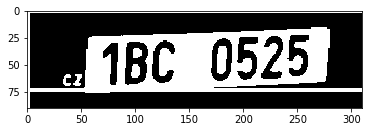

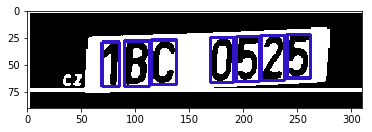

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00130
['7', 'B', '5', '9', '0', '6', '6']
{'6': ['6_0', '6_1']}


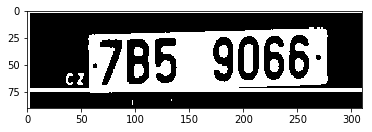

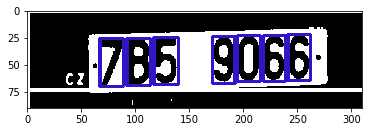

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00072
['7', 'B', '3', '0', '1', '3', '5']
{'3': ['3_0', '3_1']}


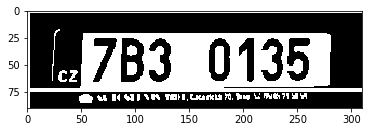

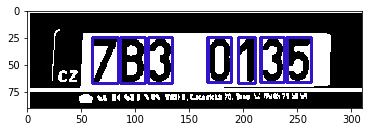

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00036
['7', 'B', '6', '3', '7', '6', '6']
{'7': ['7_0', '7_1'], '6': ['6_0', '6_1', '6_2']}


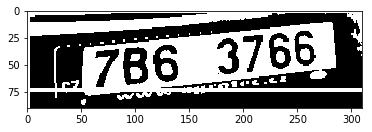

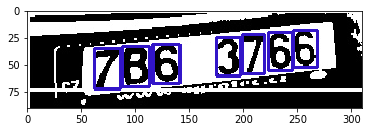

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00031
['B', '8', '5', '4', '7']
{}


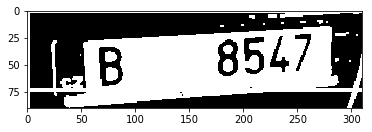

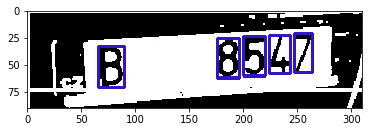

i am not saving


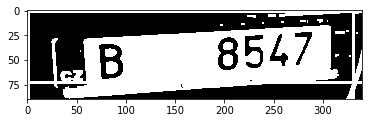

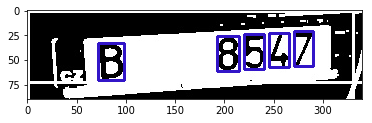

i am not saving
_----------------------------------__Starting______________________________------------------
I00128
['7', 'B', '7', '5', '2', '8', '5']
{'5': ['5_0', '5_1'], '7': ['7_0', '7_1']}


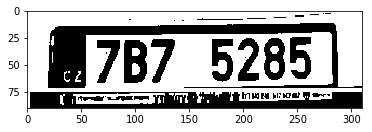

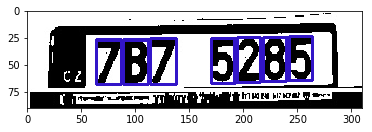

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00046
['9', 'B', '8', '3', '3', '0', '5']
{'3': ['3_0', '3_1']}


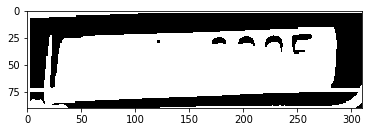

i am not saving


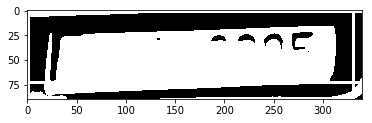

i am not saving
_----------------------------------__Starting______________________________------------------
I00135
['2', 'B', '7', '3', '7', '6', '8']
{'7': ['7_0', '7_1']}


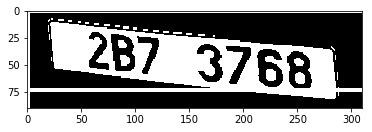

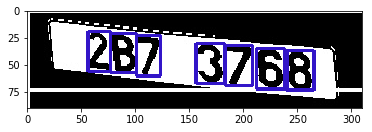

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00073
['2', 'A', 'X', '4', '9', '3', '8']
{}


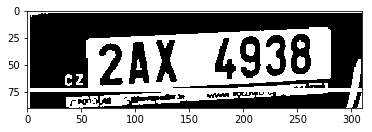

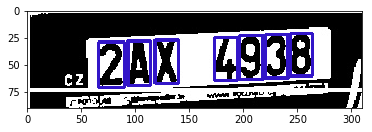

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00031
['2', 'S', 'E', '8', '6', '0', '1']
{}


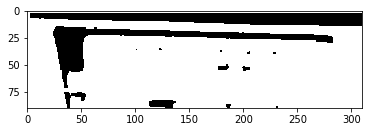

i am not saving


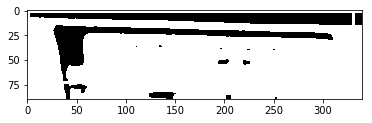

i am not saving
_----------------------------------__Starting______________________________------------------
I00036
['2', 'B', '1', '3', '5', '7', '9']
{}


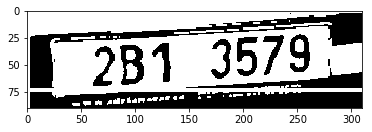

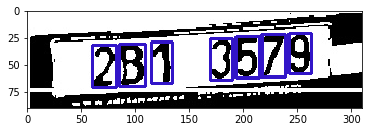

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00026
['6', 'B', '6', '7', '4', '9', '5']
{'6': ['6_0', '6_1']}


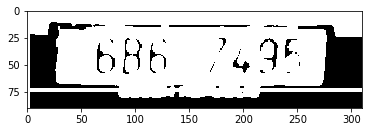

i am not saving


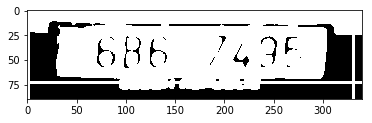

i am not saving
_----------------------------------__Starting______________________________------------------
I00083
['9', 'B', '8', '5', '2', '8', '9']
{'9': ['9_0', '9_1'], '8': ['8_0', '8_1']}


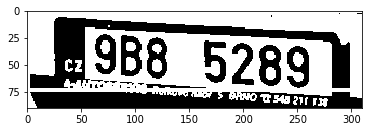

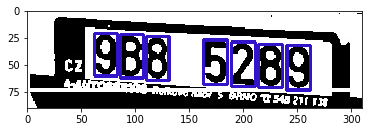

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00087
['2', 'B', '7', '6', '6', '8', '6']
{'6': ['6_0', '6_1', '6_2']}


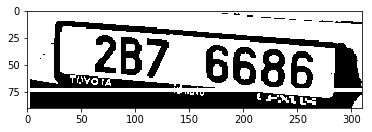

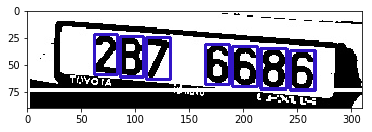

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00021
['4', 'B', '2', '0', '7', '3', '7']
{'7': ['7_0', '7_1']}


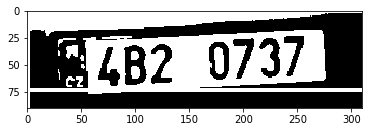

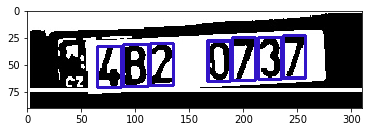

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00017
['2', 'B', '1', '7', '5', '1', '5']
{'1': ['1_0', '1_1'], '5': ['5_0', '5_1']}


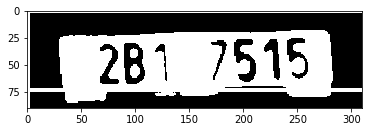

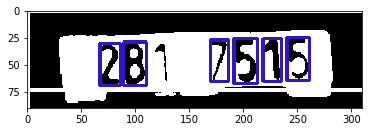

i am not saving


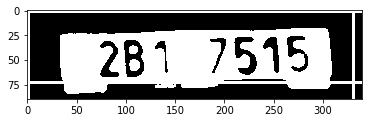

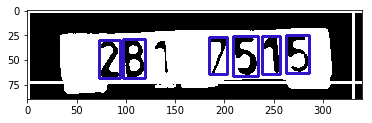

i am not saving
_----------------------------------__Starting______________________________------------------
I00118
['4', 'B', '8', '6', '1', '5', '7']
{}


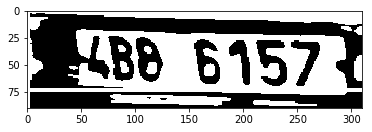

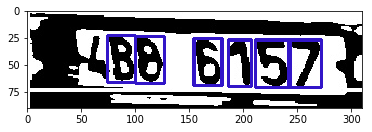

i am not saving


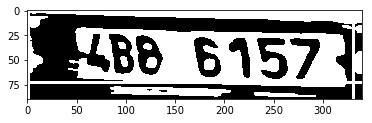

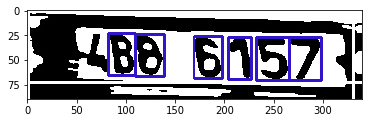

i am not saving
_----------------------------------__Starting______________________________------------------
I00048
['1', 'B', 'B', '8', '8', '5', '1']
{'B': ['B_0', 'B_1'], '8': ['8_0', '8_1'], '1': ['1_0', '1_1']}


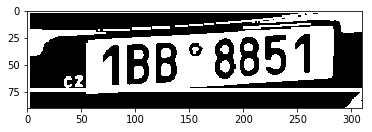

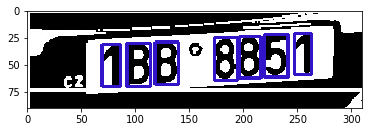

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00000
['9', 'B', '5', '2', '1', '4', '5']
{'5': ['5_0', '5_1']}


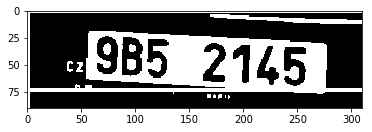

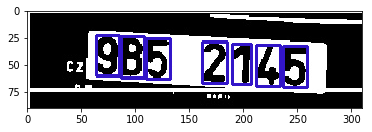

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00025
['7', 'B', '0', '8', '1', '9', '9']
{'9': ['9_0', '9_1']}


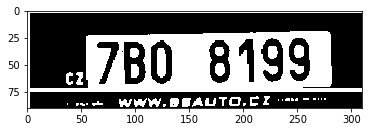

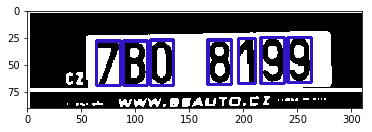

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00059
['3', 'Z', '6', '3', '1', '8', '7']
{'3': ['3_0', '3_1']}


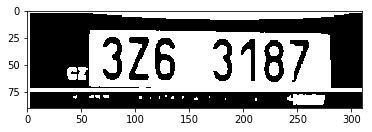

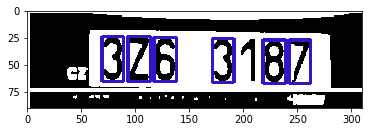

i am not saving


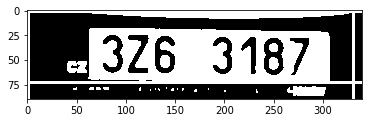

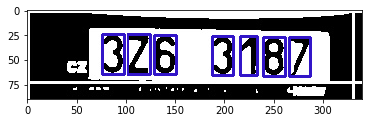

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00055
['1', 'B', 'A', '0', '8', '8', '8']
{'8': ['8_0', '8_1', '8_2']}


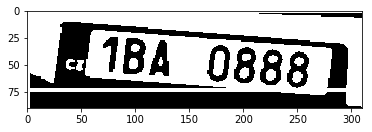

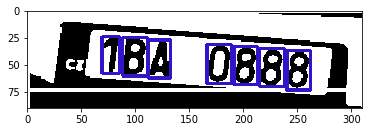

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00138
['7', 'B', '7', '8', '2', '8', '0']
{'8': ['8_0', '8_1'], '7': ['7_0', '7_1']}


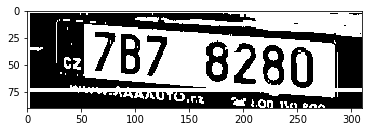

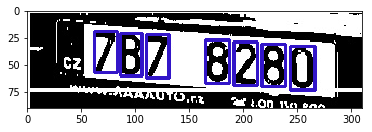

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00018
['5', 'B', '9', '7', '4', '2', '5']
{'5': ['5_0', '5_1']}


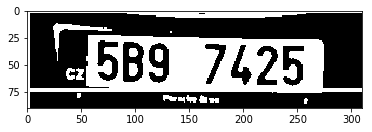

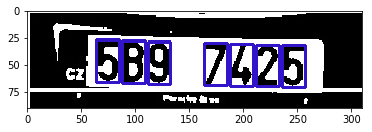

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00027
['5', 'M', '5', '6', '7', '4', '0']
{'5': ['5_0', '5_1']}


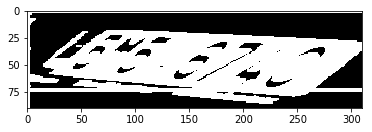

i am not saving


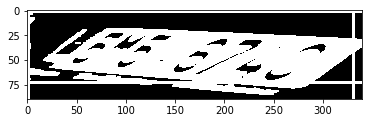

i am not saving
_----------------------------------__Starting______________________________------------------
I00030
['9', 'T', '3', '3', '6', '6', '3']
{'3': ['3_0', '3_1', '3_2'], '6': ['6_0', '6_1']}


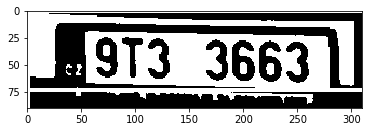

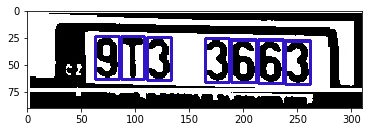

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00049
['9', 'B', '4', '3', '1', '0', '1']
{'1': ['1_0', '1_1']}


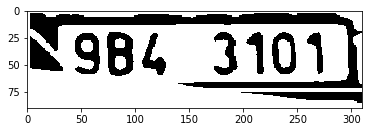

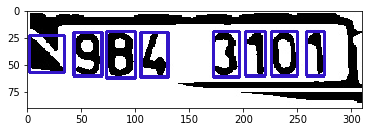

i am not saving


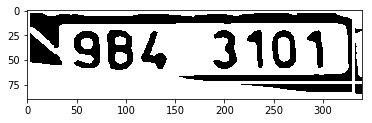

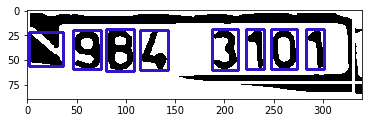

i am not saving
_----------------------------------__Starting______________________________------------------
I00037
['6', 'B', '2', '8', '8', '0', '0']
{'8': ['8_0', '8_1'], '0': ['0_0', '0_1']}


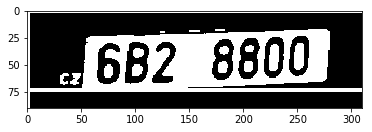

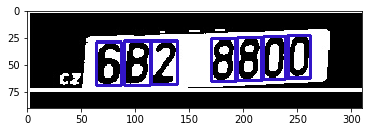

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00001
['3', 'B', '3', '8', '1', '4', '0']
{'3': ['3_0', '3_1']}


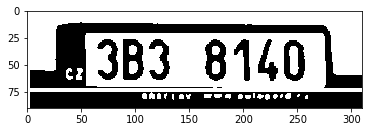

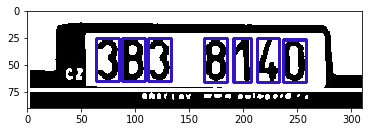

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00020
['1', 'B', '6', '1', '1', '7', '8']
{'1': ['1_0', '1_1', '1_2']}


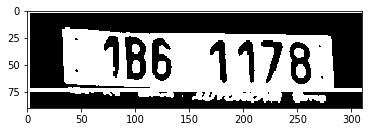

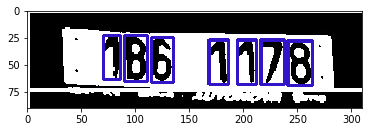

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00007
['5', 'Z', '4', '0', '1', '8', '1']
{'1': ['1_0', '1_1']}


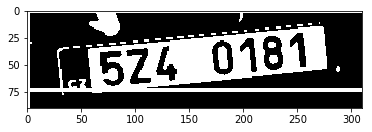

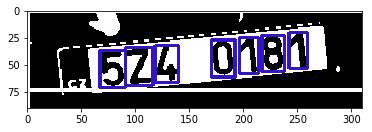

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00019
['4', 'B', '4', '2', '0', '2', '9']
{'2': ['2_0', '2_1'], '4': ['4_0', '4_1']}


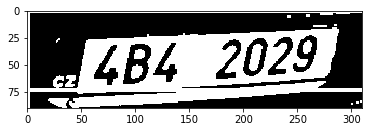

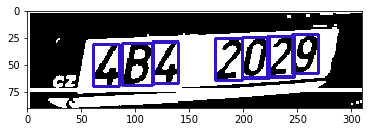

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00077
['5', 'B', '8', '2', '9', '0', '8']
{'8': ['8_0', '8_1']}


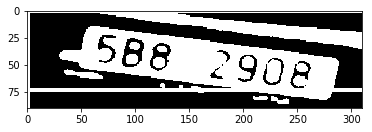

i am not saving


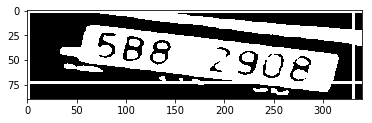

i am not saving
_----------------------------------__Starting______________________________------------------
I00054
['B', 'Z', 'J', '2', '9', '0', '9']
{'9': ['9_0', '9_1']}


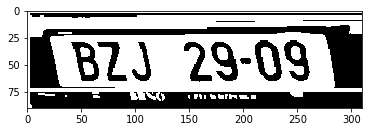

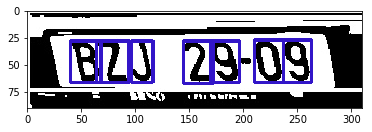

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00019
['9', 'B', '3', '8', '3', '6', '8']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


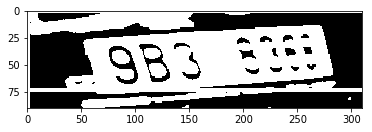

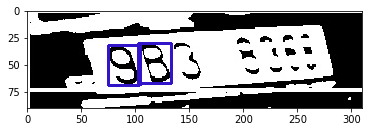

i am not saving


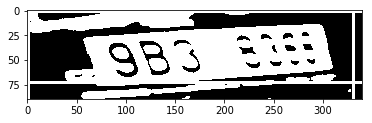

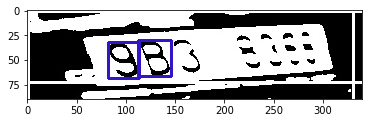

i am not saving
_----------------------------------__Starting______________________________------------------
I00051
['1', 'B', '0', '7', '8', '4', '6']
{}


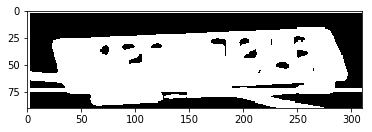

i am not saving


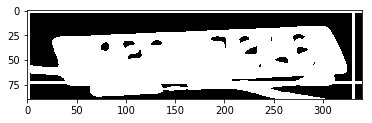

i am not saving
_----------------------------------__Starting______________________________------------------
I00010
['F', 'M', 'R', '4', '4', '3', '7']
{'4': ['4_0', '4_1']}


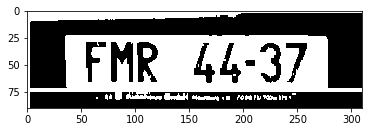

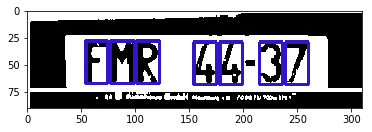

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00024
['4', 'A', 'T', '7', '9', '6', '2']
{}


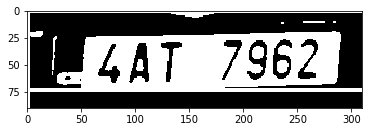

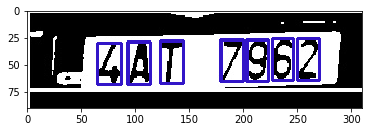

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00029
['7', 'B', '1', '4', '1', '5', '6']
{'1': ['1_0', '1_1']}


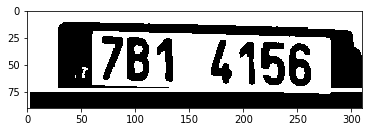

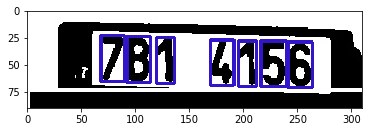

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00049
['1', 'Z', '3', '5', '2', '0', '6']
{}


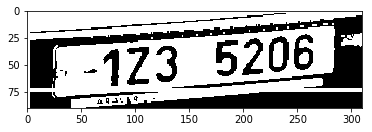

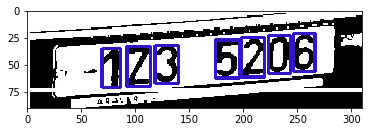

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00125
['7', 'B', '3', '0', '7', '8', '8']
{'8': ['8_0', '8_1'], '7': ['7_0', '7_1']}


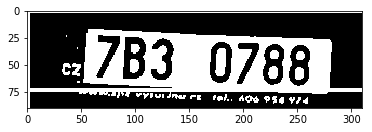

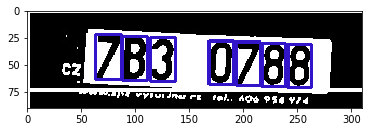

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00065
['7', 'B', '4', '0', '9', '8', '8']
{'8': ['8_0', '8_1']}


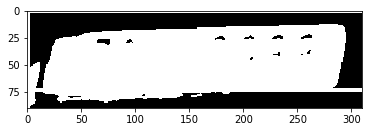

i am not saving


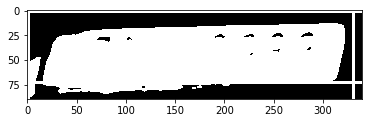

i am not saving
_----------------------------------__Starting______________________________------------------
I00021
['5', 'B', '9', '7', '4', '2', '5']
{'5': ['5_0', '5_1']}


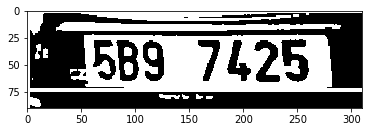

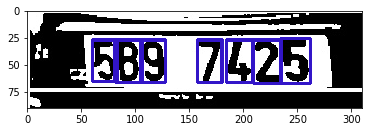

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00005
['L', 'L', '4', '3', '5', 'J', 'G']
{'L': ['L_0', 'L_1']}


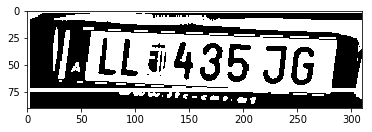

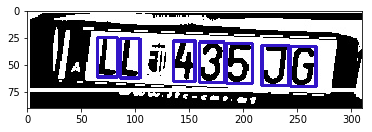

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00054
['2', 'B', '3', '8', '2', '8', '0']
{'8': ['8_0', '8_1'], '2': ['2_0', '2_1']}


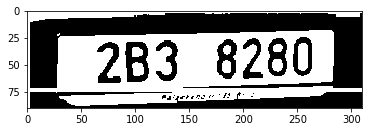

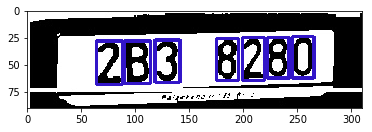

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00059
['B', '8', '1', '2', '1']
{'1': ['1_0', '1_1']}


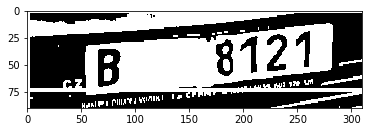

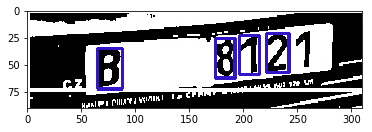

i am not saving


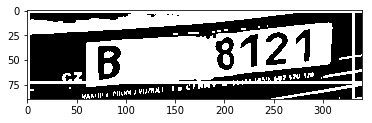

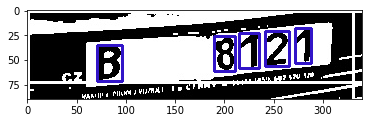

i am not saving
_----------------------------------__Starting______________________________------------------
I00061
['1', 'B', 'A', '8', '3', '7', '0']
{}


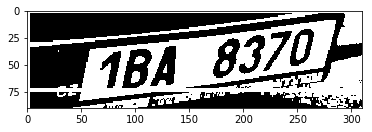

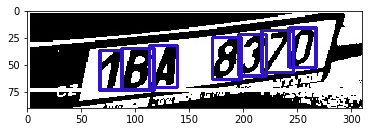

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00039
['1', 'B', 'C', '6', '7', '0', '3']
{}


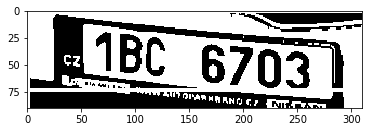

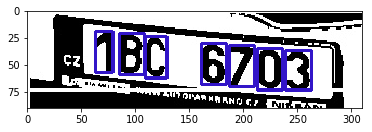

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00041
['4', 'B', '0', '7', '0', '0', '3']
{'0': ['0_0', '0_1', '0_2']}


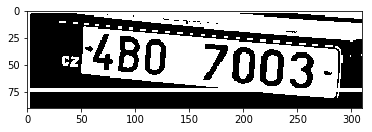

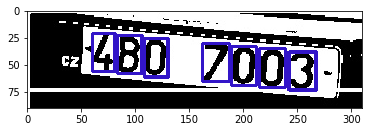

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00063
['2', 'B', '4', '5', '2', '7', '0']
{'2': ['2_0', '2_1']}


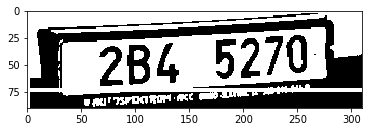

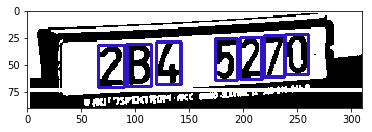

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00028
['5', 'M', '5', '6', '7', '4', '0']
{'5': ['5_0', '5_1']}


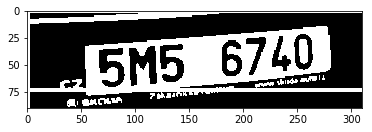

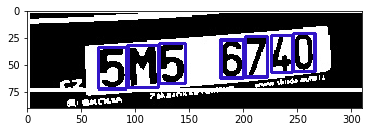

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00017
['1', 'B', 'B', '8', '8', '8', '7']
{'B': ['B_0', 'B_1'], '8': ['8_0', '8_1', '8_2']}


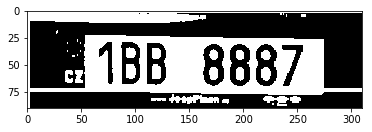

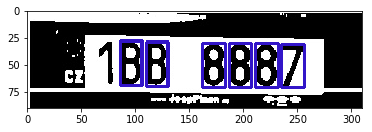

i am not saving


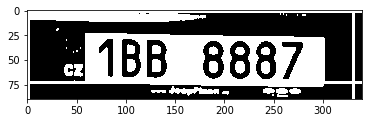

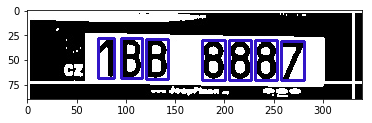

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00137
['5', 'B', '2', '6', '6', '7', '5']
{'6': ['6_0', '6_1'], '5': ['5_0', '5_1']}


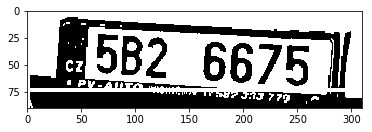

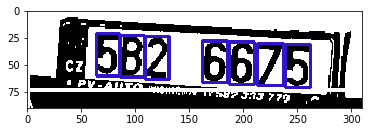

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00051
['3', 'Z', '6', '3', '1', '8', '7']
{'3': ['3_0', '3_1']}


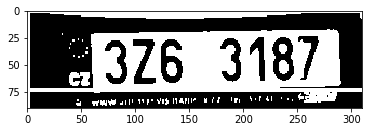

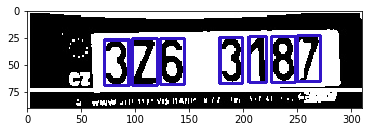

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['9', 'B', '6', '5', '4', '3', '1']
{}


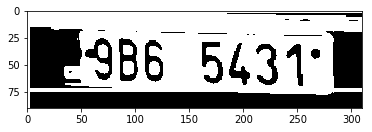

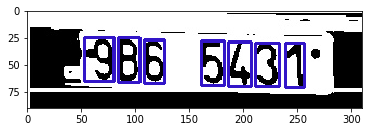

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00084
['2', 'B', '9', '0', '1', '7', '8']
{}


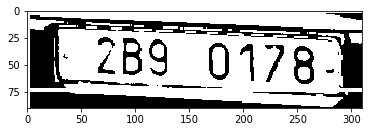

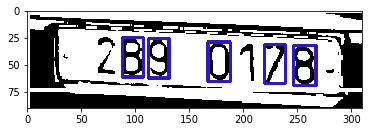

i am not saving


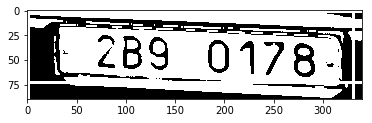

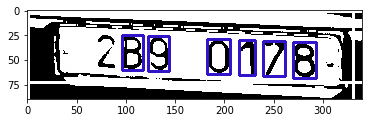

i am not saving
_----------------------------------__Starting______________________________------------------
I00071
['B', 'Z', 'N', '1', '0', '6', '5']
{}


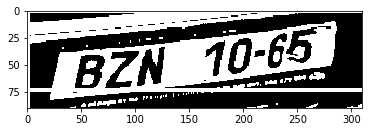

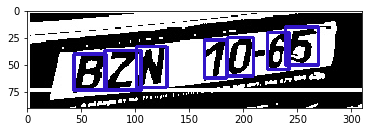

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00017
['1', 'B', 'B', '8', '8', '8', '7']
{'B': ['B_0', 'B_1'], '8': ['8_0', '8_1', '8_2']}


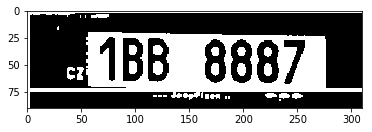

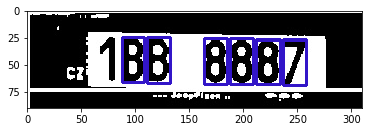

i am not saving


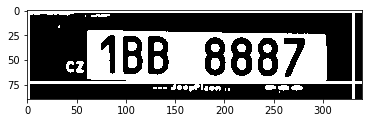

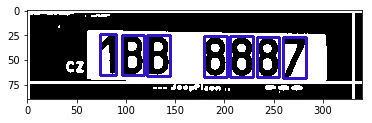

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00015
['4', 'B', '8', '3', '9', '4', '0']
{'4': ['4_0', '4_1']}


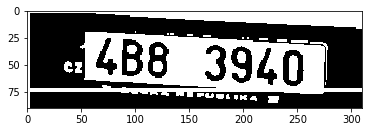

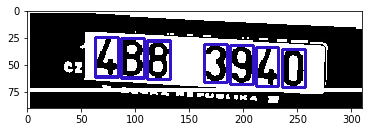

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00039
['B', 'M', 'Z', '0', '8', '1', '5']
{}


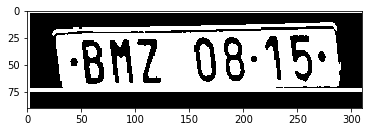

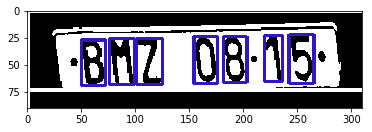

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00056
['9', 'B', '4', '9', '3', '6', '5']
{'9': ['9_0', '9_1']}


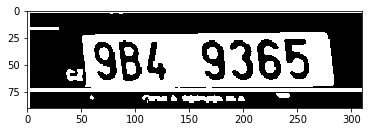

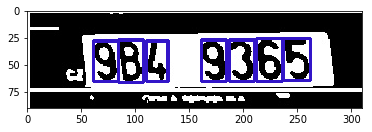

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00086
['5', 'B', '2', '3', '6', '1', '5']
{'5': ['5_0', '5_1']}


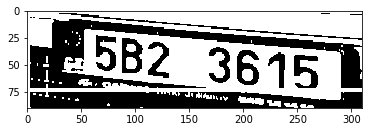

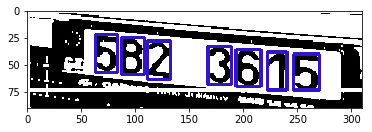

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00009
['1', 'B', '7', '6', '4', '6', '2']
{'6': ['6_0', '6_1']}


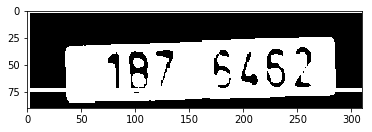

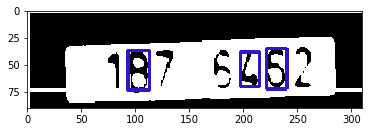

i am not saving


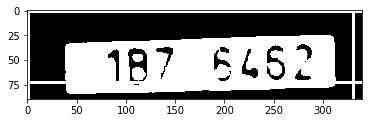

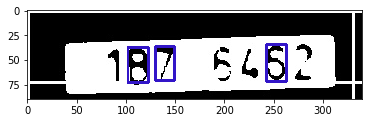

i am not saving
_----------------------------------__Starting______________________________------------------
I00032
['8', 'B', '2', '6', '2', '2', '9']
{'2': ['2_0', '2_1', '2_2']}


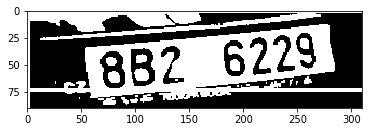

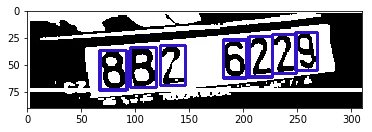

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00027
['9', 'B', '8', '8', '3', '6', '3']
{'3': ['3_0', '3_1'], '8': ['8_0', '8_1']}


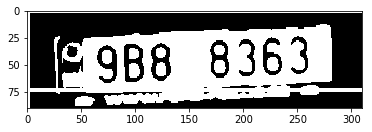

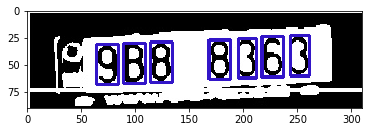

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00013
['1', 'B', 'C', '5', '1', '9', '1']
{'1': ['1_0', '1_1', '1_2']}


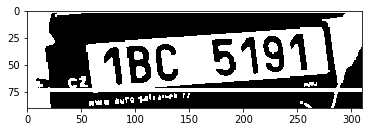

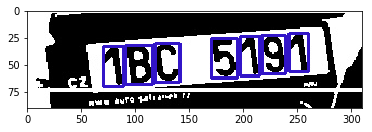

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
_----------------------------------__Starting______________________________------------------
I00106
['3', 'K', '2', '9', '7', '2', '9']
{'9': ['9_0', '9_1'], '2': ['2_0', '2_1']}


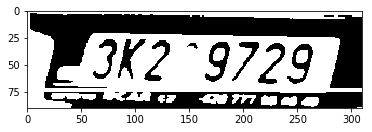

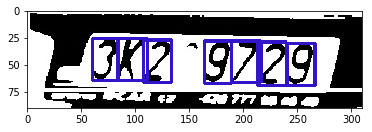

(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)
(44, 24)


32     None
285    None
616    None
639    None
451    None
412    None
257    None
573    None
159    None
84     None
214    None
272    None
10     None
163    None
37     None
228    None
382    None
365    None
222    None
394    None
59     None
197    None
240    None
34     None
429    None
98     None
531    None
338    None
314    None
57     None
       ... 
527    None
536    None
295    None
447    None
171    None
520    None
488    None
304    None
596    None
318    None
275    None
279    None
604    None
535    None
513    None
471    None
299    None
497    None
647    None
620    None
512    None
31     None
556    None
152    None
369    None
19     None
261    None
250    None
504    None
409    None
Length: 105, dtype: object

In [28]:
validate_df.apply(store_validation,axis=1)

In [29]:
test_df.to_csv("test_df_idfy.csv")